# **ML Customer Segmentation_Analysis - Clustering models**

Project completed for **The Bridge Data Science bootcamp**, with the aim of building an ML model that solves a specific problem from start to finish, excluding the productization or industrialization part.

Specifically, this is a customer segmentation problem, for which clustering models were tested.

- By: **Carlos Noya**
- Github: https://github.com/CarlosNoya/
- Data source: https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis

## 0. Import libraries 

In [ ]:
# Data Manipulation Libraries
import numpy as np
import pandas as pd
from datetime import datetime

# Data Preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Modeling Libraries
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Metrics and Visualization Tools
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import matplotlib as mpl
from yellowbrick.cluster import KElbowVisualizer
from matplotlib.ticker import FixedLocator, FixedFormatter
import scipy.cluster.hierarchy as shc

# Utilities
import sys
sys.path.append('../utils')  # Relative path to the utils folder
import bootcampviztools as bt

# Warnings
import warnings
warnings.filterwarnings('ignore')

# Pickle for serialization
import pickle

## 1. Problem Statement

In the e-commerce/retail sector, understanding customer profiles is key to improving sales and engagement. However, **the business lacks a clear understanding of its customers, making it challenging to personalize campaigns, promotions, and overall customer experiences.** This project aims to solve this issue by segmenting customers into distinct groups, allowing for more targeted marketing and better-tailored offerings.

## 2. Technical Problem

The main challenge is that the business lacks sufficient insights into its customers, which hinders personalized marketing and promotions. To address this, I will apply **unsupervised clustering techniques** to group customers with similar characteristics. The goal is to identify distinct customer segments, enabling the business to tailor its offerings more effectively.

## 3. Access data, visualization, and exploration

In [3]:
# Load dataset
df = pd.read_csv("../data_sample/marketing_campaign.csv", sep=";")
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04/09/2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08/03/2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21/08/2013,26,426,...,4,0,0,0,0,0,0,3,11,0


In [4]:
# First look at the dataset
df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [5]:
bt.tipifica_variable_plus(df)

Umbral de 'CARD_valores_unicos' para considerarla 'Categórica':  10
Umbral de 'CARD_%' para considerarla 'Numérica Continua':  30.0


,Variable,Missings_%,Dtype_real,CARD_valores_unicos,CARD_%,Dtype_sugerido
0,ID,0.00,int64,2240,100.00,Numérica Continua
1,Year_Birth,0.00,int64,59,2.63,Numérica Discreta
2,Education,0.00,object,5,0.22,Categórica
3,Marital_Status,0.00,object,8,0.36,Categórica
4,Income,1.07,float64,1974,88.12,Numérica Continua
5,Kidhome,0.00,int64,3,0.13,Categórica
6,Teenhome,0.00,int64,3,0.13,Categórica
7,Dt_Customer,0.00,object,663,29.60,Numérica Discreta
8,Recency,0.00,int64,100,4.46,Numérica Discreta
9,MntWines,0.00,int64,776,34.64,Numérica Continua


| Column/Feature     | Description                         | Feature Type     | Note                                        |
|---------------------|-------------------------------------|-------------------|---------------------------------------------|
| ID                  | Unique customer identifier          | Numeric           | Not very useful. Only for identification   |
| Year_Birth          | Year of birth                       | Numeric           | Calculate age (in years)                   |
| Education           | Education level                     | Categorical       | Check equivalences                         |
| Marital_Status      | Marital status                       | Categorical       | For derived hypotheses                     |
| Income              | Annual income                        | Numeric           | Has missing values (likely annual $)       |
| Kidhome             | Number of children (0-12) in the home | Numeric           | Interesting for spending patterns          |
| Teenhome            | Number of teenagers (13-19)         | Numeric           | Interesting for spending patterns          |
| Dt_Customer         | Date customer joined                | Date              | Measures customer tenure                   |
| Recency             | Days since last purchase            | Numeric           | Essential for evaluating customer retention|
| MntWines            | Spending in wines in the last 2 years | Numeric           | Direct info on buying habits ($)           |
| MntFruits           | Spending in fruits                  | Numeric           | Direct info on buying habits ($)           |
| MntMeatProducts     | Spending in meat products           | Numeric           | Direct info on buying habits ($)           |
| MntFishProducts     | Spending in fish products           | Numeric           | Direct info on buying habits ($)           |
| MntSweetProducts    | Spending in sweets                  | Numeric           | Direct info on buying habits ($)           |
| MntGoldProds        | Spending in branded products        | Numeric           | Direct info on buying habits ($)           |
| NumDealsPurchases   | Discount purchases                  | Numeric           | Response to price changes                  |
| NumWebPurchases     | Web purchases                       | Numeric           | Interesting for channel info               |
| NumCatalogPurchases | Catalog purchases                   | Numeric           | Interesting for channel info               |
| NumStorePurchases   | In-store purchases                  | Numeric           | Interesting for channel info               |
| NumWebVisitsMonth   | Web visits in the last month        | Numeric           | Interesting for channel info               |
| AcceptedCmp3        | Accepted campaign 3                 | Binary            | Measures response to marketing campaigns   |
| AcceptedCmp4        | Accepted campaign 4                 | Binary            | Measures response to marketing campaigns   |    
| AcceptedCmp5        | Accepted campaign 5                 | Binary            | Measures response to marketing campaigns   |
| AcceptedCmp1        | Accepted campaign 1                 | Binary            | Measures response to marketing campaigns   |
| AcceptedCmp2        | Accepted campaign 2                 | Binary            | Measures response to marketing campaigns   | 
| Complain            | Filed a complaint                   | Binary            | Measures response to marketing campaigns   |
| Z_CostContact       | Unknown                             |                   | What does it represent?                    |
| Z_Revenue           | Unknown                             |                   | What does it represent?                    |
| Response            | Responded to the last campaign      | Binary            | Measures recent interest                   |



In [6]:
# List of excluded columns
exclude = [] 

# Function to add columns to the exclude list and display it
def add_to_exclude(*name_cols):
    for name_col in name_cols:
        if name_col not in exclude:
            exclude.append(name_col)
    print("Excluded: ", exclude)

# Add specific columns to exclude
add_to_exclude("Z_CostContact", "Z_Revenue")

Excluded:  ['Z_CostContact', 'Z_Revenue']


## 4. Data cleaning

Data cleaning, handling of missing values and outliers, creation of new columns, adjustment of column types, renaming, and reordering...


### 4.1. Features analisys

#### A) *people* features

##### - 'ID'

- The cardinality is 100%, so I’ll add it to the exclude list to be removed

In [7]:
add_to_exclude("ID")

Excluded:  ['Z_CostContact', 'Z_Revenue', 'ID']


##### - 'Year_Birth' ('Age')

- Instead of referring to the year of birth, it makes more sense to talk about age. Therefore, a new column is created based on the previous one.
- Outliers are investigated and addressed accordingly.

In [8]:
# Values of the 'Year_Birth' column
print("Values in 'Year_Birth' column: \n", df.Year_Birth.unique(), "\n")

# Create new column 'Age'
df["Age"] = datetime.now().year - df["Year_Birth"]  # datetime.now().year = Current year [2025]

# Verify that all ages are correct
print("Values in 'Age' column: \n", df.Age.unique(), "\n")

Values in 'Year_Birth' column: 
 [1957 1954 1965 1984 1981 1967 1971 1985 1974 1950 1983 1976 1959 1952
 1987 1946 1980 1949 1982 1979 1951 1969 1986 1989 1963 1970 1973 1943
 1975 1996 1968 1964 1977 1978 1955 1966 1988 1948 1958 1972 1960 1945
 1991 1962 1953 1961 1956 1992 1900 1893 1990 1947 1899 1993 1994 1941
 1944 1995 1940] 

Values in 'Age' column: 
 [ 68  71  60  41  44  58  54  40  51  75  42  49  66  73  38  79  45  76
  43  46  74  56  39  36  62  55  52  82  50  29  57  61  48  47  70  59
  37  77  67  53  65  80  34  63  72  64  69  33 125 132  35  78 126  32
  31  84  81  30  85] 



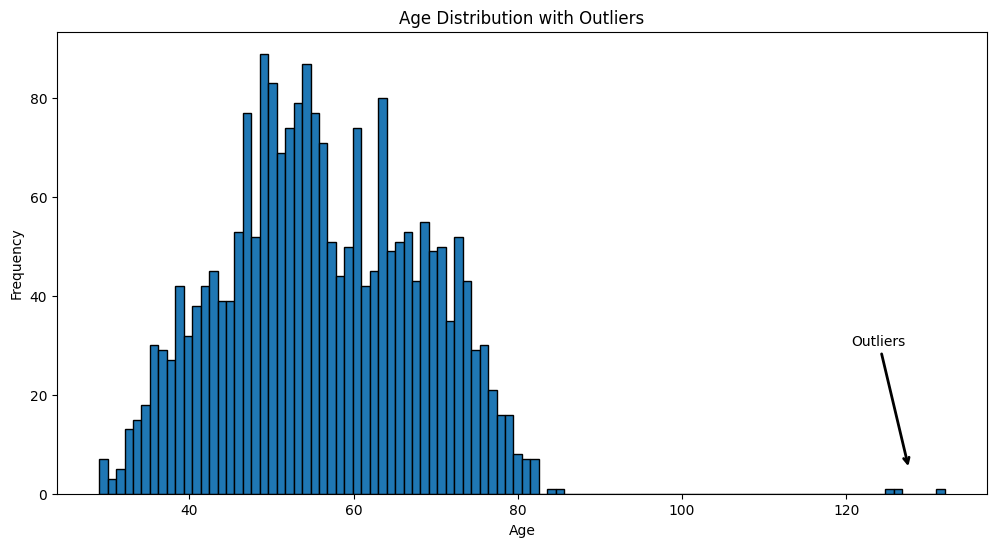

In [9]:
plt.figure(figsize=(12, 6))
df['Age'].hist(bins=100, grid=False, edgecolor="black")

# Identify the 99th percentile to mark outliers
outlier_age_max = df["Age"].quantile(0.9999)

# Add an arrow to indicate the outliers
plt.annotate(
    "Outliers", 
    xy=(outlier_age_max-3, 5),  # Coordinates (x, y)
    xytext=(outlier_age_max-10, 30),  # Text position
    arrowprops=dict(facecolor="red", arrowstyle="->", lw=2)
)

plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Age Distribution with Outliers")
plt.show()

In [10]:
# Number of outliers or unreasonable ages
outliers_age = df[df["Age"] > 85]
print(outliers_age["Age"].value_counts())

# Display the rows with unreasonable ages
df[df["Age"] > 85]

Age
125    1
132    1
126    1
Name: count, dtype: int64


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
192,7829,1900,2n Cycle,Divorced,36640.0,1,0,26/09/2013,99,15,...,0,0,0,0,0,1,3,11,0,125
239,11004,1893,2n Cycle,Single,60182.0,0,1,17/05/2014,23,8,...,0,0,0,0,0,0,3,11,0,132
339,1150,1899,PhD,Together,83532.0,0,0,26/09/2013,36,755,...,0,0,1,0,0,0,3,11,0,126


- Le imputaré la mediana (que difiere poco de la media)

In [11]:
print(df.Age.describe())

count    2240.000000
mean       56.194196
std        11.984069
min        29.000000
25%        48.000000
50%        55.000000
75%        66.000000
max       132.000000
Name: Age, dtype: float64


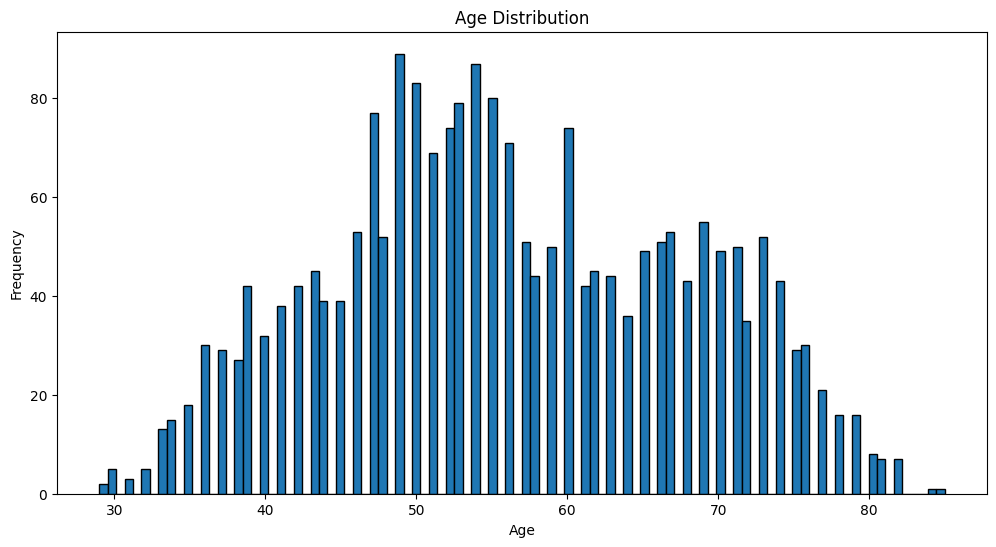

In [12]:
# Impute with the median
median_age = df["Age"].median()
df.loc[df["Age"] > 85, "Age"] = median_age

# Visualization
plt.figure(figsize=(12, 6))
df['Age'].hist(bins=100, grid=False, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Age Distribution")
plt.show()

In [13]:
add_to_exclude("Year_Birth")

Excluded:  ['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth']


##### - 'Education'

- I group the classes and reduce categories.
- When transforming them, I must order them numerically.

In [14]:
df["Education"].value_counts()

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [15]:
# Simplify and group the categories of Education
df["Education"] = df["Education"].replace({
    "Basic": "Undergraduate",
    "2n Cycle": "Undergraduate", 
    "Graduation": "Graduate", 
    "Master": "Postgraduate", 
    "PhD": "Postgraduate"
})

# Check the value counts after grouping
df["Education"].value_counts()

Education
Graduate         1127
Postgraduate      856
Undergraduate     257
Name: count, dtype: int64

##### - 'Marital_Status'

- Some classes can be grouped.
- When transforming them, I must order them numerically.
- Some unusual classes can be imputed (or deleted).

In [16]:
df["Marital_Status"].value_counts()

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [17]:
# Group the categories into Together and Single
df["Marital_Status"] = df["Marital_Status"].replace(["Married", "Together"], "Couple")
df["Marital_Status"] = df["Marital_Status"].replace(["Divorced", "Widow", "Alone"], "Single")

# Check the value counts after grouping
df["Marital_Status"].value_counts()

Marital_Status
Couple    1444
Single     792
Absurd       2
YOLO         2
Name: count, dtype: int64

In [18]:
df.loc[(df["Marital_Status"] == "Absurd") | (df["Marital_Status"] == "YOLO")]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
2093,7734,1993,Graduate,Absurd,79244.0,0,0,19/12/2012,58,471,...,0,0,1,1,0,0,3,11,1,32
2134,4369,1957,Postgraduate,Absurd,65487.0,0,0,10/01/2014,48,240,...,0,0,0,0,0,0,3,11,0,68
2177,492,1973,Postgraduate,YOLO,48432.0,0,1,18/10/2012,3,322,...,0,0,0,0,0,0,3,11,0,52
2202,11133,1973,Postgraduate,YOLO,48432.0,0,1,18/10/2012,3,322,...,0,0,0,0,0,0,3,11,1,52


- Since they are few, I will delete them directly. Additionally, one row seems to be duplicated (except for the "Response" value)

In [19]:
values_to_drop = df[(df["Marital_Status"] == "Absurd") | (df["Marital_Status"] == "YOLO")].index
df.drop(index=values_to_drop, inplace=True)

df["Marital_Status"].value_counts()

Marital_Status
Couple    1444
Single     792
Name: count, dtype: int64

##### - 'Income'

- It contains NaN values (delete or impute).
- Outliers.

In [20]:
# Description of the 'Income' column
income_description = df['Income'].describe()

# Add NaN values count and column type to the description
income_description['NaN'] = df['Income'].isnull().sum()
income_description['Dtype'] = df['Income'].dtype

# Display the description as a DataFrame
income_description.to_frame().T

,count,mean,std,min,25%,50%,75%,max,NaN,Dtype
Income,2212.0,52232.51085,25187.455359,1730.0,35233.5,51381.5,68522.0,666666.0,24.0,float64


- I will perform imputation based on a similar case, regarding the 'Education' column.

In [21]:
# Calculate mean income for each education group
income_mean_undergraduate = df[df["Education"] == "Undergraduate"]["Income"].mean()
income_mean_graduate = df[df["Education"] == "Graduate"]["Income"].mean()
income_mean_postgraduate = df[df["Education"] == "Postgraduate"]["Income"].mean()

# Display the mean income for each group
print("Mean income for 'Undergraduate' group: ", round(income_mean_undergraduate, 2))
print("Mean income for 'Graduate' group: ", round(income_mean_graduate, 2))
print("Mean income for 'Postgraduate' group: ", round(income_mean_postgraduate, 2))

Mean income for 'Undergraduate' group:  41823.53
Mean income for 'Graduate' group:  52696.59
Mean income for 'Postgraduate' group:  54754.98


In [22]:
# Impute NaN values with the mean income corresponding to each Education group
df.loc[(df['Education'] == 'Undergraduate') & (df['Income'].isna()), 'Income'] = income_mean_undergraduate
df.loc[(df['Education'] == 'Graduate') & (df['Income'].isna()), 'Income'] = income_mean_graduate
df.loc[(df['Education'] == 'Postgraduate') & (df['Income'].isna()), 'Income'] = income_mean_postgraduate

# Check the number of remaining NaN values
df["Income"].isna().sum()

0

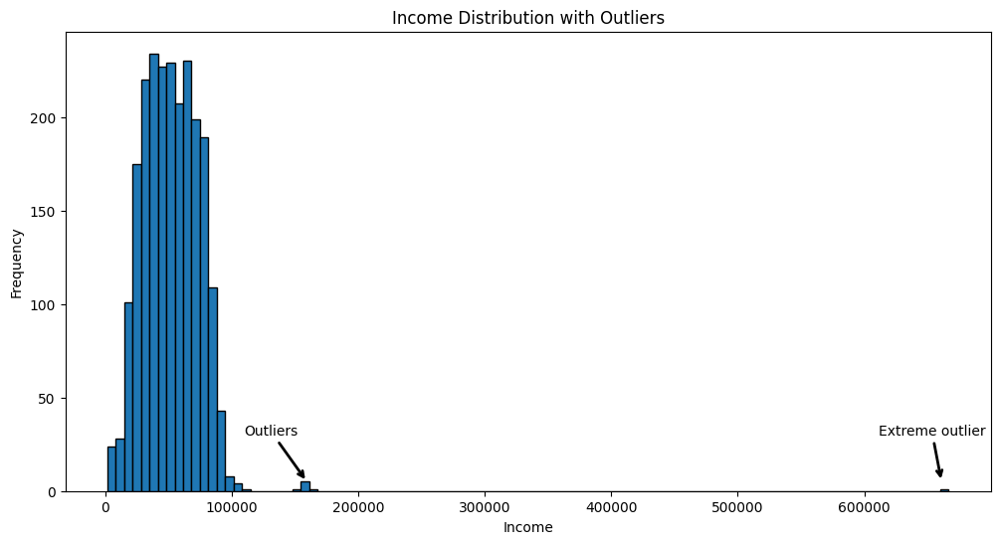

In [23]:
plt.figure(figsize=(12, 6))
df['Income'].hist(bins=100, grid=False, edgecolor="black")

# Identify the 99.89th percentile for marking outliers
outlier_income = df["Income"].quantile(0.9989)
outlier_income_ext = df["Income"].quantile(0.999995)

# Add an arrow to indicate the outliers
plt.annotate(
    "Outliers", 
    xy=(outlier_income, 5),  # Coordinates (x, y)
    xytext=(outlier_income - 50000, 30),  # Text position
    arrowprops=dict(facecolor="red", arrowstyle="->", lw=2)
)

# Add an arrow to indicate extreme outliers
plt.annotate(
    "Extreme outlier", 
    xy=(outlier_income_ext, 5),  # Coordinates (x, y)
    xytext=(outlier_income_ext - 50000, 30),  # Text position
    arrowprops=dict(facecolor="red", arrowstyle="->", lw=2)
)

plt.xlabel("Income")
plt.ylabel("Frequency")
plt.title("Income Distribution with Outliers")
plt.show()

In [24]:
# Number of outliers or unreasonable incomes
outliers_income = df[df["Income"] > 115000]
print(outliers_income["Income"].value_counts(sort=True).sort_index(ascending=False))

Income
666666.0    1
162397.0    1
160803.0    1
157733.0    1
157243.0    1
157146.0    1
156924.0    1
153924.0    1
Name: count, dtype: int64


- I will impute only the extreme value, in the same way as before. The other outliers can be transformed logarithmically later

In [25]:
df.loc[df["Income"] > 200000]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
2233,9432,1977,Graduate,Couple,666666.0,1,0,02/06/2013,23,9,...,0,0,0,0,0,0,3,11,0,48


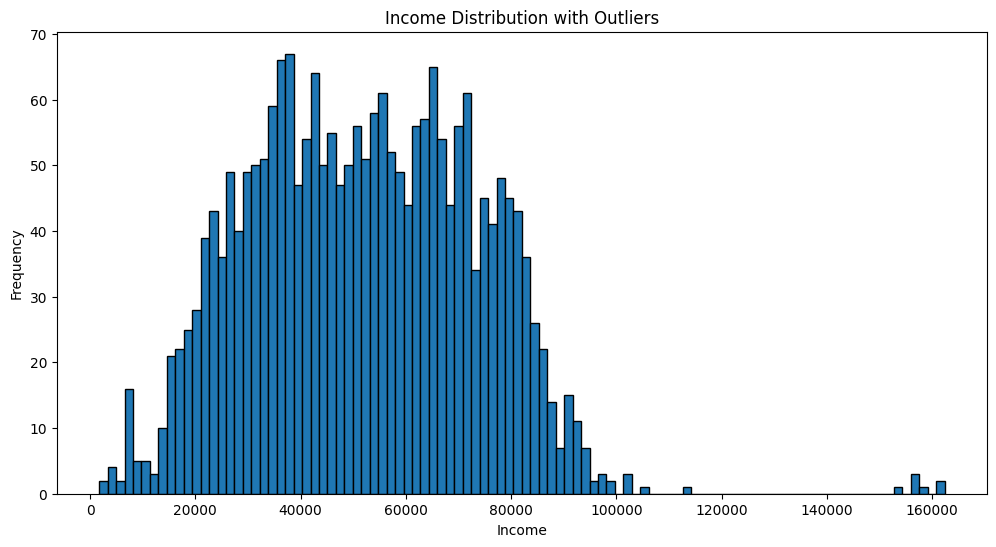

In [26]:
# Impute with the mean for extreme outliers
df.loc[df["Income"] > 200000, "Income"] = income_mean_graduate

# Visualization
plt.figure(figsize=(12, 6))
df['Income'].hist(bins=100, grid=False, edgecolor="black")
plt.xlabel("Income")
plt.ylabel("Frequency")
plt.title("Income Distribution with Outliers")
plt.show()

##### - 'Kidhome' , 'Teenhome' ('Children')

- Both columns could be treated as a single one that handles the number of children.

In [27]:
print(df.Kidhome.value_counts(), "\n")
print(df.Teenhome.value_counts())

Kidhome
0    1289
1     899
2      48
Name: count, dtype: int64 

Teenhome
0    1156
1    1028
2      52
Name: count, dtype: int64


In [28]:
# New "Children" column defining the number of children
df["Children"] = df["Kidhome"] + df["Teenhome"]
print(df.Children.value_counts())

# Crosstab between Kidhome and Teenhome
pd.crosstab(df["Kidhome"], df["Teenhome"])

Children
1    1126
0     636
2     421
3      53
Name: count, dtype: int64


Teenhome,0,1,2
Kidhome,,,
0,636,623,30
1,503,374,22
2,17,31,0


In [29]:
# Add to exclude list
add_to_exclude("Kidhome", "Teenhome")

Excluded:  ['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth', 'Kidhome', 'Teenhome']


##### - 'Dt_Customer' ('Client_for')

- Convert to date format.
- New column, using the number of days since the customer became a client.

In [30]:
df["Dt_Customer"].describe()

count           2236
unique           663
top       31/08/2012
freq              12
Name: Dt_Customer, dtype: object

In [31]:
# Convert to date format
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"], dayfirst=True, errors='coerce')  # Convert the column to date type with dayfirst=True
print(df["Dt_Customer"])

0      2012-09-04
1      2014-03-08
2      2013-08-21
3      2014-02-10
4      2014-01-19
          ...    
2235   2013-06-13
2236   2014-06-10
2237   2014-01-25
2238   2014-01-24
2239   2012-10-15
Name: Dt_Customer, Length: 2236, dtype: datetime64[ns]


In [32]:
print("Newest date:", df["Dt_Customer"].max().date())
print("Oldest date:", df["Dt_Customer"].min().date())

Newest date: 2014-06-29
Oldest date: 2012-07-30


In [33]:
# New column
df["Client_for"] = (df["Dt_Customer"].max() - df["Dt_Customer"]).dt.days  # Indicates how many days the customer has been registered
df["Client_for"]

0       663
1       113
2       312
3       139
4       161
       ... 
2235    381
2236     19
2237    155
2238    156
2239    622
Name: Client_for, Length: 2236, dtype: int64

In [34]:
add_to_exclude("Dt_Customer")

Excluded:  ['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth', 'Kidhome', 'Teenhome', 'Dt_Customer']


##### - 'Recency'

- Recency: Days since the last purchase.
- Nothing to be done.

In [35]:
df.Recency.unique()

array([58, 38, 26, 94, 16, 34, 32, 19, 68, 11, 59, 82, 53, 23, 51, 20, 91,
       86, 41, 42, 63,  0, 69, 89,  4, 96, 56, 31,  8, 55, 37, 76, 99,  3,
       88, 80, 72, 24, 92, 39, 29,  2, 54, 57, 30, 12, 18, 75, 90,  1, 25,
       40,  9, 87,  5, 95, 48, 70, 79, 45, 84, 44, 43, 35, 15, 17, 46, 27,
       74, 85, 65, 13, 83, 10, 21, 61, 73, 47, 36, 49, 28, 64, 98, 78, 77,
       81, 14, 52, 93, 50, 60, 66, 97, 62,  6, 33, 67, 22, 71,  7],
      dtype=int64)

##### - 'Complain'

- Complaints in the last 2 years (0: NO, 1: YES).

In [36]:
df.Complain.value_counts()

Complain
0    2215
1      21
Name: count, dtype: int64

##### - ('Family_size')

In [37]:
# New column "Family_Size" defining the number of family members
df["Family_Size"] = df["Children"] + (df["Marital_Status"].replace({"Single": 1, "Couple": 2}))
print(df.Family_Size.value_counts())

Family_Size
3    889
2    762
4    301
1    252
5     32
Name: count, dtype: int64


#### B) *products* features

##### - "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"

- All have a similar distribution.
- Create a new column with the total spending.
- Check that there are no erroneous data (zeros in total spending).

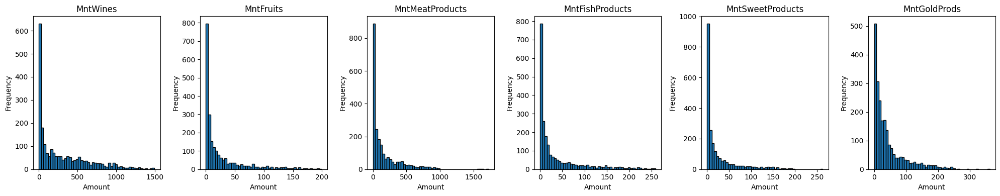

In [38]:
products = ["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"]

fig, axes = plt.subplots(1, len(products), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(products, axes):
    ax.hist(df[col], bins=50, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Amount")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

##### - ('Total_Spent')

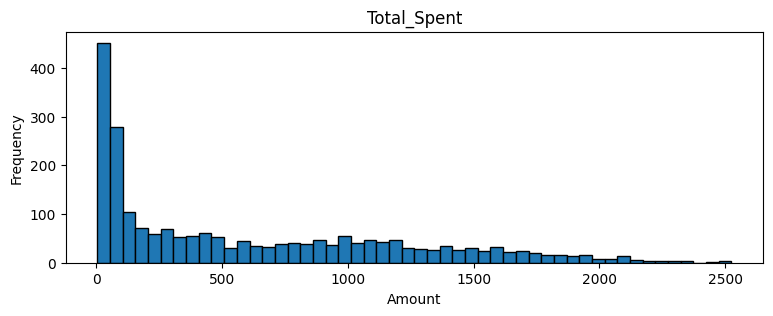

In [39]:
# New column with total spent
df["Total_Spent"] = df[["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"]].sum(axis=1)  # Axis 1 (sum by rows)

plt.figure(figsize=(9, 3))
plt.hist(df["Total_Spent"], bins=50, edgecolor="black")
plt.xlabel("Amount")
plt.ylabel("Frequency")
plt.title("Total_Spent")
plt.show()

In [40]:
# Check to ensure something was always purchased
df.loc[(df['Total_Spent'] == 0)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Children,Client_for,Family_Size,Total_Spent


##### - ('Avg_purcharse')

In [41]:
# New column for average spend per purchase
df["Avg_purcharse"] = round(df["Total_Spent"] / (df["NumWebPurchases"] + df["NumCatalogPurchases"] + df["NumStorePurchases"]), 3)
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,Age,Children,Client_for,Family_Size,Total_Spent,Avg_purcharse
0,5524,1957,Graduate,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,68,0,663,1,1617,73.50
1,2174,1954,Graduate,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,71,2,113,3,27,6.75
2,4141,1965,Graduate,Couple,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,60,0,312,2,776,38.80


#### C) *place* features

##### - "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth"

- Outliers, but within normal range (possible logarithmic transformations during feature engineering phase)
- Checking for erroneous data (zero spending in all purchase channels)

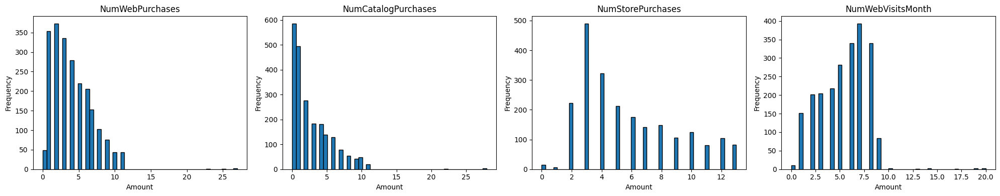

In [42]:
purchases = ["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth"]

fig, axes = plt.subplots(1, len(purchases), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(purchases, axes):
    ax.hist(df[col], bins=50, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Amount")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [43]:
df[purchases].describe()

,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
count,2236.000000,2236.000000,2236.000000,2236.000000
mean,4.082737,2.659213,5.789356,5.317531
std,2.779736,2.920752,3.253756,2.424756
min,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,3.000000,3.000000
50%,4.000000,2.000000,5.000000,6.000000
75%,6.000000,4.000000,8.000000,7.000000
max,27.000000,28.000000,13.000000,20.000000


- Six customers have not made any purchases through any channel, so it's better to remove them.

In [44]:
# Check
df.loc[(df['NumWebPurchases'] == 0) & (df['NumCatalogPurchases'] == 0) & (df['NumStorePurchases'] == 0), purchases]

,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
655,0,0,0,0
981,0,0,0,14
1245,0,0,0,20
1524,0,0,0,14
1846,0,0,0,19
2132,0,0,0,0


In [45]:
# Remove the six rows with erroneous data (no purchases made)
values_to_drop_2 = df[(df['NumWebPurchases'] == 0) & (df['NumCatalogPurchases'] == 0) & (df['NumStorePurchases'] == 0)].index
df.drop(index=values_to_drop_2, inplace=True)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,Age,Children,Client_for,Family_Size,Total_Spent,Avg_purcharse
0,5524,1957,Graduate,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,68,0,663,1,1617,73.500
1,2174,1954,Graduate,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,71,2,113,3,27,6.750
2,4141,1965,Graduate,Couple,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,60,0,312,2,776,38.800
3,6182,1984,Graduate,Couple,26646.0,1,0,2014-02-10,26,11,...,0,3,11,0,41,1,139,3,53,8.833
4,5324,1981,Postgraduate,Couple,58293.0,1,0,2014-01-19,94,173,...,0,3,11,0,44,1,161,3,422,30.143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduate,Couple,61223.0,0,1,2013-06-13,46,709,...,0,3,11,0,58,1,381,3,1341,83.812
2236,4001,1946,Postgraduate,Couple,64014.0,2,1,2014-06-10,56,406,...,0,3,11,0,79,3,19,5,444,29.600
2237,7270,1981,Graduate,Single,56981.0,0,0,2014-01-25,91,908,...,0,3,11,0,44,0,155,1,1241,68.944
2238,8235,1956,Postgraduate,Couple,69245.0,0,1,2014-01-24,8,428,...,0,3,11,0,69,1,156,3,843,40.143


#### D) *promotion* features

##### "NumDealsPurchases", "AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"

- NumDealsPurchases: Purchases made with a discount or offer (possible logarithmic transformations during feature engineering phase).
- Promotion (Accepted campaign offer): Accepted the offer in campaign number X (0: NO, 1: YES).
- Response: Accepted the last offer (0: NO, 1: YES).
- No action needed.

In [46]:
df.Response.value_counts()

Response
0    1898
1     332
Name: count, dtype: int64

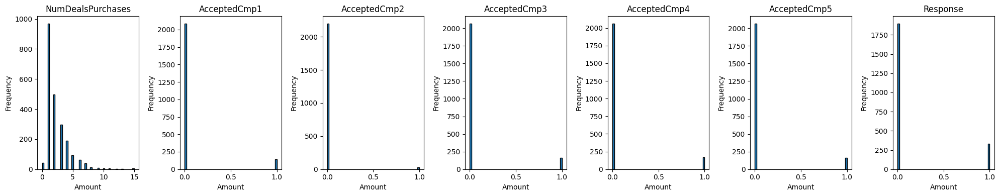

In [48]:
promotion = ["NumDealsPurchases", "AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]

fig, axes = plt.subplots(1, len(promotion), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(promotion, axes):
    ax.hist(df[col], bins=50, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Amount")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [49]:
df[promotion].describe()

,NumDealsPurchases,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Response
count,2230.000000,2230.000000,2230.000000,2230.000000,2230.000000,2230.000000,2230.000000
mean,2.315695,0.064126,0.013453,0.073094,0.074888,0.072646,0.148879
std,1.894450,0.245031,0.115230,0.260349,0.263269,0.259612,0.356049
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### - ('Total_Campaigns_Accepted')

In [50]:
df["Total_Campaigns_Accepted"] = df["AcceptedCmp1"] + df["AcceptedCmp2"] + df["AcceptedCmp3"] + df["AcceptedCmp4"] + df["AcceptedCmp5"] + df["Response"]
df["Total_Campaigns_Accepted"].value_counts()

Total_Campaigns_Accepted
0    1623
1     369
2     142
3      50
4      36
5      10
Name: count, dtype: int64

### 4.2. Dropping Columns, Renaming and Reordering Features

In [51]:
print(exclude)
df_backup_V1 = df.copy()

# Dropping exclude columns
df = df.drop(columns=exclude, axis=1)
df.head(5)

['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth', 'Kidhome', 'Teenhome', 'Dt_Customer']


,Education,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,AcceptedCmp2,Complain,Response,Age,Children,Client_for,Family_Size,Total_Spent,Avg_purcharse,Total_Campaigns_Accepted
0,Graduate,Single,58138.0,58,635,88,546,172,88,88,...,0,0,1,68,0,663,1,1617,73.500,1
1,Graduate,Single,46344.0,38,11,1,6,2,1,6,...,0,0,0,71,2,113,3,27,6.750,0
2,Graduate,Couple,71613.0,26,426,49,127,111,21,42,...,0,0,0,60,0,312,2,776,38.800,0
3,Graduate,Couple,26646.0,26,11,4,20,10,3,5,...,0,0,0,41,1,139,3,53,8.833,0
4,Postgraduate,Couple,58293.0,94,173,43,118,46,27,15,...,0,0,0,44,1,161,3,422,30.143,0


In [52]:
people_dict = {
    "Age": "Age",
    "Education": "Education",
    "Income": "Income",
    "Marital_Status": "Status",
    "Children": "Children",
    "Family_Size": "Fam_size",
    "Client_for": "Client_days",
    "Recency": "Recency",
    "Complain": "Complain"
}

products_dict = {
    "MntWines": "Wines",
    "MntFruits": "Fruits",
    "MntMeatProducts": "Meat",
    "MntFishProducts": "Fish",
    "MntSweetProducts": "Sweets",
    "MntGoldProds": "Gold",
    "Total_Spent": "Total_spent",
    "Avg_purcharse": "Avg_buy"
}

place_dict = {
    "NumWebPurchases": "Web",
    "NumCatalogPurchases": "Catalog",
    "NumStorePurchases": "Store",
    "NumWebVisitsMonth": "WebVisits"
}

promotion_dict = {
    "NumDealsPurchases": "Deals",
    "AcceptedCmp1": "Cmp1",
    "AcceptedCmp2": "Cmp2",
    "AcceptedCmp3": "Cmp3",
    "AcceptedCmp4": "Cmp4",
    "AcceptedCmp5": "Cmp5",
    "Response": "Response",
    "Total_Campaigns_Accepted": "Total_cmp"
}

# Rename columns first and then reorder
df = df.rename(columns={**people_dict, **products_dict, **place_dict, **promotion_dict})

# Extract lists of renamed column names
people = list(people_dict.values())
products = list(products_dict.values())
place = list(place_dict.values())
promotion = list(promotion_dict.values())

# Reorder columns as per the desired order
new_order = people + products + place + promotion

# Apply the reordering
df = df[new_order]
df.head()

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,Graduate,58138.0,Single,0,1,663,58,0,635,...,4,7,3,0,0,0,0,0,1,1
1,71,Graduate,46344.0,Single,2,3,113,38,0,11,...,2,5,2,0,0,0,0,0,0,0
2,60,Graduate,71613.0,Couple,0,2,312,26,0,426,...,10,4,1,0,0,0,0,0,0,0
3,41,Graduate,26646.0,Couple,1,3,139,26,0,11,...,4,6,2,0,0,0,0,0,0,0
4,44,Postgraduate,58293.0,Couple,1,3,161,94,0,173,...,6,5,5,0,0,0,0,0,0,0


In [53]:
df[people].head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain
0,68,Graduate,58138.0,Single,0,1,663,58,0
1,71,Graduate,46344.0,Single,2,3,113,38,0
2,60,Graduate,71613.0,Couple,0,2,312,26,0


In [54]:
df[products].head(3)

,Wines,Fruits,Meat,Fish,Sweets,Gold,Total_spent,Avg_buy
0,635,88,546,172,88,88,1617,73.50
1,11,1,6,2,1,6,27,6.75
2,426,49,127,111,21,42,776,38.80


In [55]:
df[place].head(3)

,Web,Catalog,Store,WebVisits
0,8,10,4,7
1,1,1,2,5
2,8,2,10,4


In [56]:
df[promotion].head(3)

,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,3,0,0,0,0,0,1,1
1,2,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2230 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          2230 non-null   int64  
 1   Education    2230 non-null   object 
 2   Income       2230 non-null   float64
 3   Status       2230 non-null   object 
 4   Children     2230 non-null   int64  
 5   Fam_size     2230 non-null   int64  
 6   Client_days  2230 non-null   int64  
 7   Recency      2230 non-null   int64  
 8   Complain     2230 non-null   int64  
 9   Wines        2230 non-null   int64  
 10  Fruits       2230 non-null   int64  
 11  Meat         2230 non-null   int64  
 12  Fish         2230 non-null   int64  
 13  Sweets       2230 non-null   int64  
 14  Gold         2230 non-null   int64  
 15  Total_spent  2230 non-null   int64  
 16  Avg_buy      2230 non-null   float64
 17  Web          2230 non-null   int64  
 18  Catalog      2230 non-null   int64  
 19  Store      

## 5. MiniEDA

In [58]:
# Features by categories
print(people)
print(products)
print(place)
print(promotion)

['Age', 'Education', 'Income', 'Status', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Complain']
['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Total_spent', 'Avg_buy']
['Web', 'Catalog', 'Store', 'WebVisits']
['Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Total_cmp']


#### Numeric features

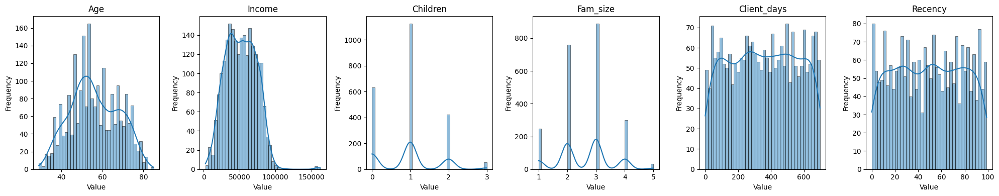

In [59]:
numeric_people = ["Age", "Income", "Children", "Fam_size", "Client_days", "Recency"]

fig, axes = plt.subplots(1, len(numeric_people), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(numeric_people, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

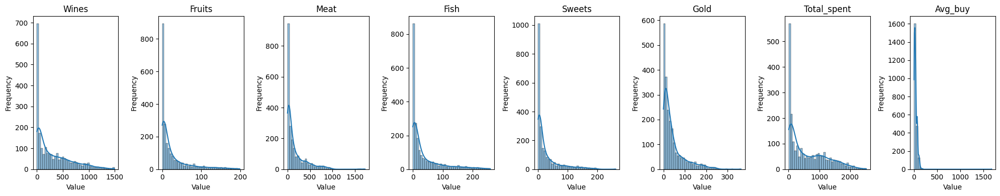

In [60]:
fig, axes = plt.subplots(1, len(products), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(products, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

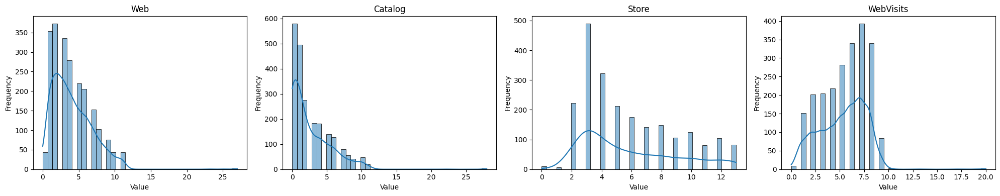

In [61]:
fig, axes = plt.subplots(1, len(place), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(place, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

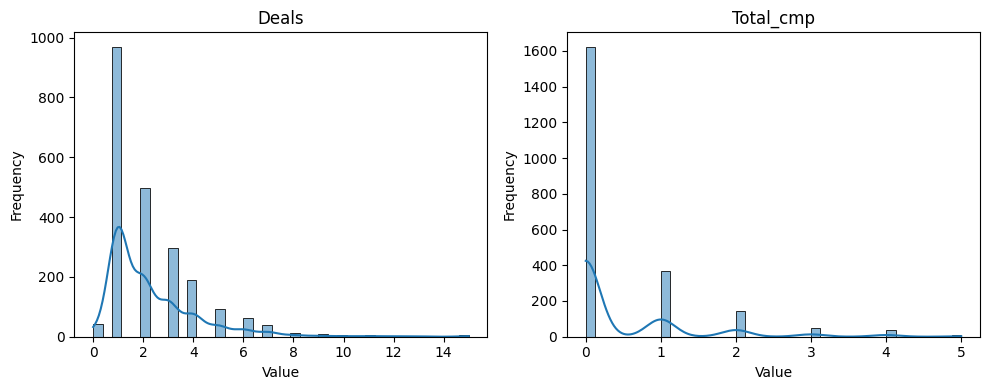

In [62]:
promotion_numeric = ["Deals", "Total_cmp"]

fig, axes = plt.subplots(1, len(promotion_numeric), figsize=(len(promotion_numeric)*10/2, 4)) # One row, as many columns as features

for col, ax in zip(promotion_numeric, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [63]:
promotion

['Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Total_cmp']

#### Categorical feature

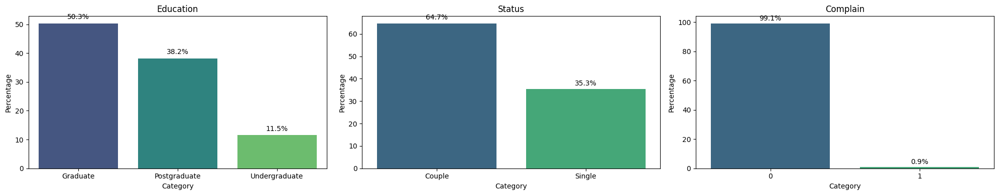

In [64]:
categoric = ["Education", "Status", "Complain"]
fig, axes = plt.subplots(1, len(categoric), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(categoric, axes):
    value_counts = df[col].value_counts(normalize=True) * 100  # Relative values as percentage
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=ax, palette="viridis")  # Different color for each bar
    ax.set_title(col)
    ax.set_xlabel("Category")
    ax.set_ylabel("Percentage")
    for i, v in enumerate(value_counts.values):
        ax.text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom')  # Show values above the bars

plt.tight_layout()
plt.show()

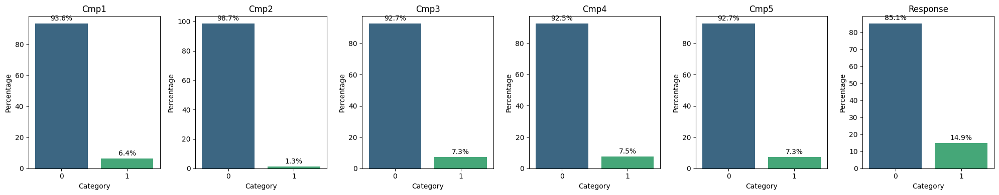

In [65]:
categoric = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']
fig, axes = plt.subplots(1, len(categoric), figsize=(20, 4))  # One row, as many columns as features

for col, ax in zip(categoric, axes):
    value_counts = df[col].value_counts(normalize=True) * 100  # Relative values as percentage
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=ax, palette="viridis")  # Different color for each bar
    ax.set_title(col)
    ax.set_xlabel("Category")
    ax.set_ylabel("Percentage")
    for i, v in enumerate(value_counts.values):
        ax.text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom')  # Show values above the bars

plt.tight_layout()
plt.show()

In [66]:
corr = df.corr(numeric_only= True)
corr["Response"].sort_values(ascending = False)

Response       1.000000
Total_cmp      0.723917
Cmp5           0.324610
Cmp1           0.291622
Total_spent    0.264776
Cmp3           0.255214
Wines          0.246626
Meat           0.237441
Catalog        0.219003
Client_days    0.192183
Cmp4           0.177742
Cmp2           0.169859
Avg_buy        0.165216
Income         0.162786
Web            0.147044
Gold           0.136401
Fruits         0.123818
Sweets         0.116614
Fish           0.109121
Store          0.037193
Deals          0.003451
WebVisits     -0.000635
Complain      -0.001649
Age           -0.015470
Children      -0.169703
Recency       -0.198102
Fam_size      -0.219847
Name: Response, dtype: float64

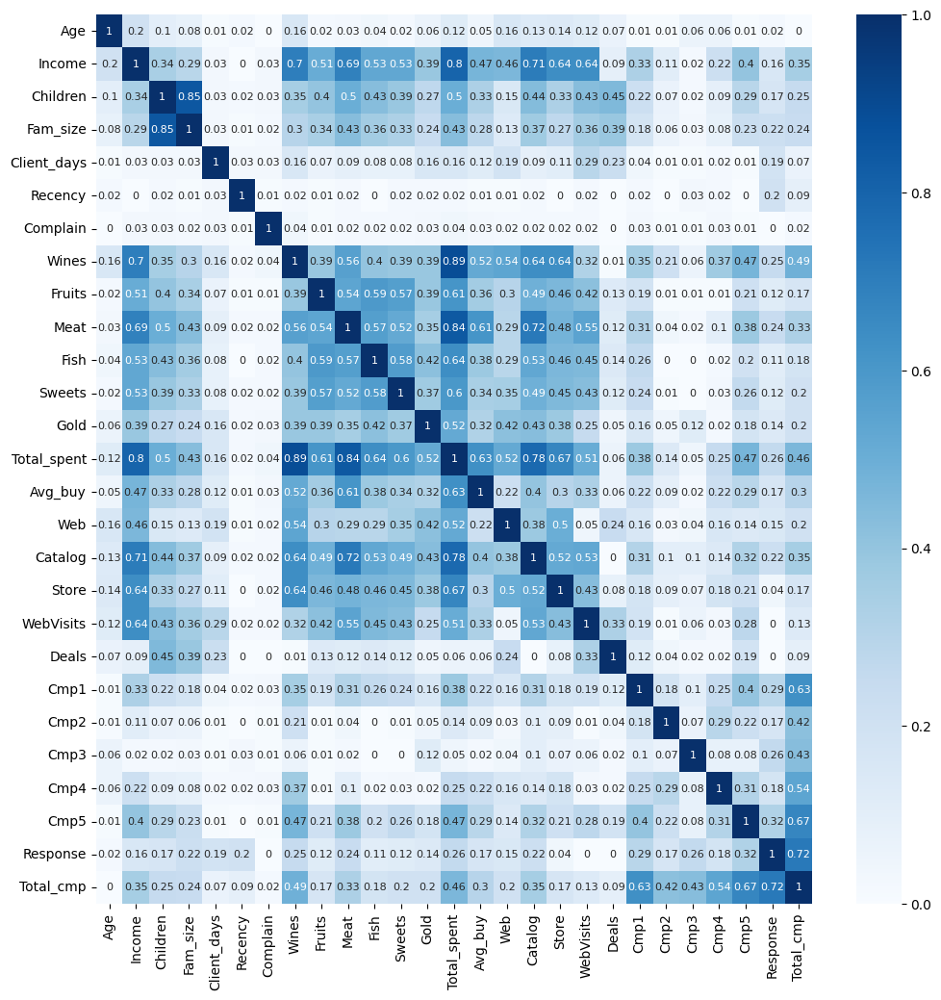

In [67]:
# Create the heatmap
plt.figure(figsize=(12,12))
sns.heatmap(np.abs(round(df.corr(numeric_only=True), 2)), annot=True, cmap="Blues", annot_kws={"size": 8})

# Set the title
plt.show()

## 6. Feature processing

In [68]:
df_backup_V2 = df.copy()

In [69]:
df_backup_V2.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,Graduate,58138.0,Single,0,1,663,58,0,635,...,4,7,3,0,0,0,0,0,1,1
1,71,Graduate,46344.0,Single,2,3,113,38,0,11,...,2,5,2,0,0,0,0,0,0,0
2,60,Graduate,71613.0,Couple,0,2,312,26,0,426,...,10,4,1,0,0,0,0,0,0,0


### 6.1. Categorical features

In [71]:
# Identify categorical features in the DataFrame
features_cat_list = df.select_dtypes(include='object').columns.tolist()

print("Categorical features:", features_cat_list)

Categorical features: ['Education', 'Status']


#### - 'Status'

In [72]:
# Mapping: singles as 1, couples as 2
status_map = {"Single": 1, "Couple": 2}
df['Status'] = df.Status.map(status_map)

#### - 'Education'

In [73]:
# Mapping for education
education_map = {"Undergraduate": 0, "Graduate": 1, "Postgraduate":2}
df['Education'] = df.Education.map(education_map) 

### 6.2. Numeric features

In [74]:
df.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,1,58138.0,1,0,1,663,58,0,635,...,4,7,3,0,0,0,0,0,1,1
1,71,1,46344.0,1,2,3,113,38,0,11,...,2,5,2,0,0,0,0,0,0,0
2,60,1,71613.0,2,0,2,312,26,0,426,...,10,4,1,0,0,0,0,0,0,0


In [75]:
df_transform = df.copy()

##### 6.2.1. Transformations

In [76]:
# Identify numeric variables in the DataFrame
features_num_list = df_transform.select_dtypes(include='number').columns.tolist()

# Remove, filtering, binary columns (0-1)
features_num_list = [feature for feature in features_num_list if df_transform[feature].nunique() > 2]
print(features_num_list)

['Age', 'Education', 'Income', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Total_spent', 'Avg_buy', 'Web', 'Catalog', 'Store', 'WebVisits', 'Deals', 'Total_cmp']


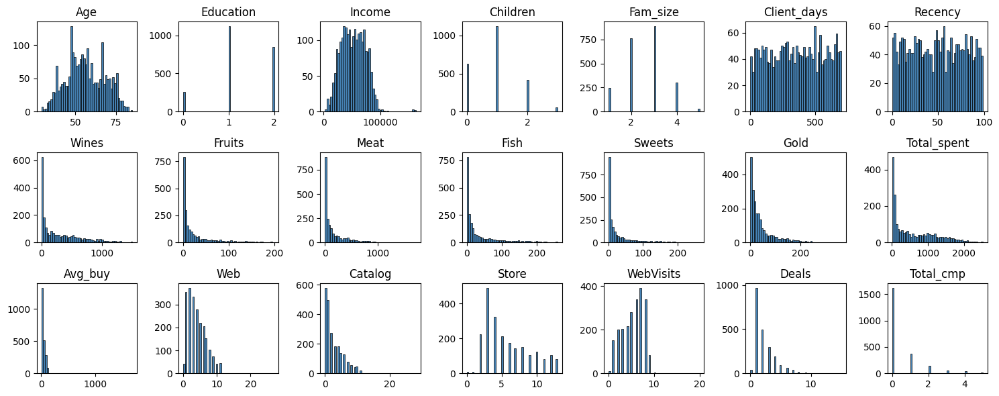

In [77]:
# SHOW THEIR HISTOGRAMS
# calculate the number of rows needed
n_cols = 7
features_to_show = features_num_list

n_rows = (len(features_to_show) + n_cols - 1) // n_cols  # Rounding up

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, n_rows *2))

# Flatten the axes for easy iteration
axes = axes.flatten()

for i, feature in enumerate(features_to_show):
    ax = axes[i]
    ax.hist(df_transform[feature], bins=50, color='steelblue', edgecolor='black', linewidth=0.5)
    ax.set_title(feature)

# Eliminate empty shafts
for j in range(len(features_to_show), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjusts the space between graphics
plt.show()

In [78]:
features_to_transform = ["Wines", "Fruits", "Meat", "Fish", "Sweets", "Gold", "Total_spent", "Avg_buy", "Web", "Catalog", "WebVisits", "Deals"]

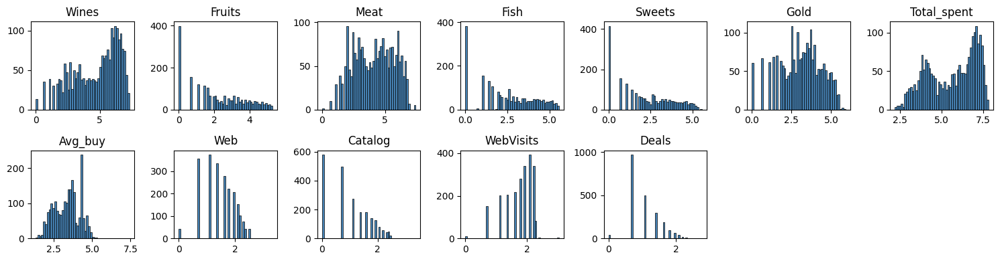

In [79]:
# Apply logarithmic transformation to the selected columns
for feature in features_to_transform:
    df_transform[feature] = np.log1p(df_transform[feature])  # log1p para manejar valores cero de forma segura

# SHOW ITS HISTOGRAMS
# calculate the number of rows needed
n_cols = 7
features_to_show = features_to_transform

n_rows = (len(features_to_show) + n_cols - 1) // n_cols   # Round up

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, n_rows *2))

# Flatten axes for easy iteration
axes = axes.flatten()

for i, feature in enumerate(features_to_show):
    ax = axes[i]
    ax.hist(df_transform[feature], bins=50, color='steelblue', edgecolor='black', linewidth=0.5)
    ax.set_title(feature)

# remove empty axes
for j in range(len(features_to_show), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Adjust spacing between plots
plt.show()

##### 6.2.1. Scaling

In [80]:
df_transform.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,1,58138.0,1,0,1,663,58,0,6.455199,...,4,2.079442,1.386294,0,0,0,0,0,1,1
1,71,1,46344.0,1,2,3,113,38,0,2.484907,...,2,1.791759,1.098612,0,0,0,0,0,0,0
2,60,1,71613.0,2,0,2,312,26,0,6.056784,...,10,1.609438,0.693147,0,0,0,0,0,0,0


In [81]:
df_scaled = df_transform.copy()

In [82]:
# Initialize scaler and normalize all columns in the DataFrame
scaler = StandardScaler()
df_scaled[df_scaled.columns] = scaler.fit_transform(df_scaled[df_scaled.columns])

# Display the first 3 rows of the scaled DataFrame
df_scaled.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,1.017806,-0.408153,0.292936,-1.352756,-1.267640,-1.767365,1.531482,0.306356,-0.097502,0.987064,...,-0.556478,0.715203,0.660045,-0.261762,-0.116775,-0.280817,-0.284517,-0.279887,2.390997,0.621099
1,1.274357,-0.408153,-0.265529,-1.352756,1.394165,0.443080,-1.193254,-0.384312,-0.097502,-1.221901,...,-1.173097,0.089789,0.043581,-0.261762,-0.116775,-0.280817,-0.284517,-0.279887,-0.418236,-0.502219
2,0.333670,-0.408153,0.931000,0.739232,-1.267640,-0.662142,-0.207395,-0.798712,-0.097502,0.765397,...,1.293380,-0.306573,-0.825277,-0.261762,-0.116775,-0.280817,-0.284517,-0.279887,-0.418236,-0.502219


In [83]:
# Display the mean and standard deviation of the scaled DataFrame
df_scaled.describe().loc[['mean', 'std']].T

,mean,std
Age,-1.425865e-16,1.000224
Education,-1.147065e-16,1.000224
Income,3.186290e-17,1.000224
Status,1.370105e-16,1.000224
Children,-7.965726e-17,1.000224
Fam_size,-2.453444e-16,1.000224
Client_days,4.062520e-17,1.000224
Recency,9.558871e-17,1.000224
Complain,3.425262e-17,1.000224
Wines,-1.067407e-16,1.000224


In [84]:
df_scaled.columns

Index(['Age', 'Education', 'Income', 'Status', 'Children', 'Fam_size',
       'Client_days', 'Recency', 'Complain', 'Wines', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'Total_spent', 'Avg_buy', 'Web', 'Catalog', 'Store',
       'WebVisits', 'Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5',
       'Response', 'Total_cmp'],
      dtype='object')

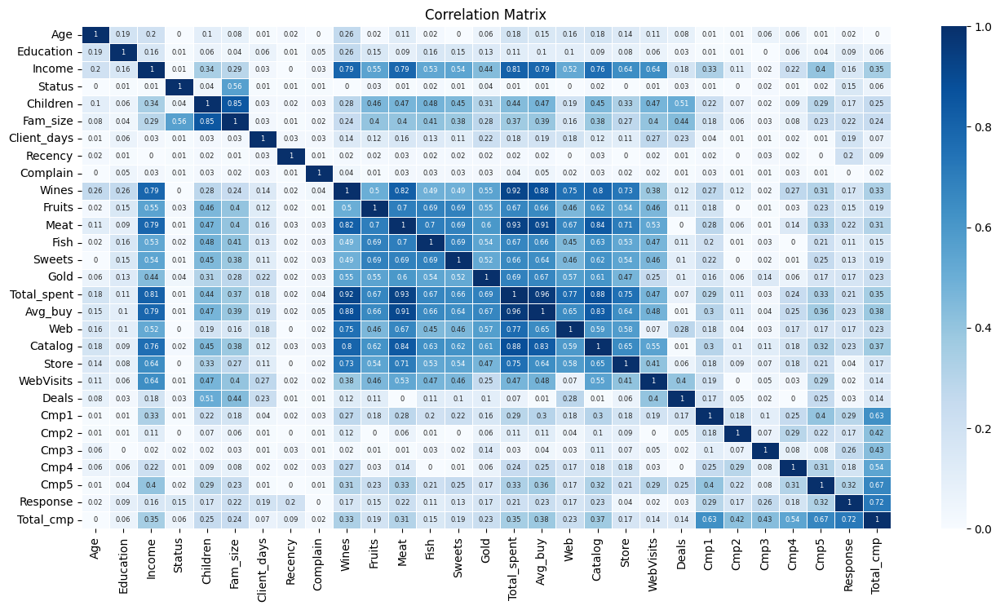

In [85]:
# Create a copy of the scaled DataFrame for clustering
df_cluster = df_scaled.copy()

# Calculate the correlation matrix
corr_matrix = df_cluster.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(16, 8))
sns.heatmap(np.abs(round(corr_matrix, 2)), annot=True, cmap="Blues", linewidths=0.5, annot_kws={"size": 6})
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# Filter correlations greater than 0.75
high_corr = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1) > 0.75)
             .stack()
             .reset_index())

# Rename columns for clarity
high_corr.columns = ["Variable 1", "Variable 2", "Correlation"]

# Filter to show only correlations greater than 0.85
high_corr = high_corr[high_corr["Correlation"] > 0.85]

# Display results sorted by correlation value
print(high_corr.sort_values(by="Correlation", ascending=False))

      Variable 1   Variable 2  Correlation
315  Total_spent      Avg_buy     0.964645
256         Meat  Total_spent     0.933278
221        Wines  Total_spent     0.923448
257         Meat      Avg_buy     0.910429
222        Wines      Avg_buy     0.881851
317  Total_spent      Catalog     0.881165


## 7. Dimensionality Reduction

### PCA

------------------------------------------
Cumulative explained variance percentage
------------------------------------------
[0.33597594 0.43085489 0.51497746 0.57456469 0.62132775 0.6621203
 0.69730677 0.73162993 0.76266533 0.7917734  0.82004847 0.84353166
 0.86524668 0.88376336 0.9019379  0.9178136  0.93179625 0.94516979
 0.95727984 0.96787858 0.97807124 0.98488576 0.99091367 0.99524089
 0.99850696 0.99986267 1.         1.         1.        ]


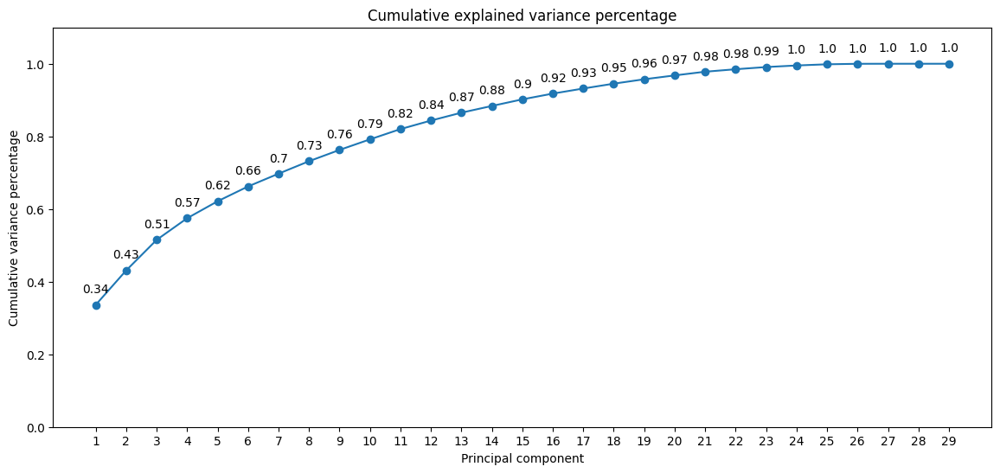

In [88]:
# Apply PCA
modelo_PCA = PCA()
modelo_PCA.fit(df_cluster)

# Cumulative explained variance ratio
prop_varianza_acum = modelo_PCA.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Cumulative explained variance percentage')
print('------------------------------------------')
print(prop_varianza_acum)

# Plot
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(
    np.arange(len(df_cluster.columns)) + 1,  # Ensure consistency with the number of features
    prop_varianza_acum,
    marker='o'
)

for x, y in zip(np.arange(len(df_cluster.columns)) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(
        label,
        (x, y),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_PCA.n_components_) + 1)
ax.set_title('Cumulative explained variance percentage')
ax.set_xlabel('Principal component')
ax.set_ylabel('Cumulative variance percentage')

plt.show()

To explain at least 85%-90% of the variance, we can choose:
- 14 components → 88.37% (0.8838)
- 15 components → 90.19% (0.9019)

#### modelo_PCA_14

In [89]:
# We apply PCA with 14 components
modelo_PCA_14 = PCA(n_components=14)
df_pca = modelo_PCA_14.fit_transform(df_cluster)

# Convert to DataFrame
df_pca = pd.DataFrame(df_pca, 
                      columns=[f'PC{i+1}' for i in range(14)])

# Display the first rows
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
0,4.150463,-0.223490,0.015195,2.844280,-1.871519,-0.160210,0.026971,0.093211,0.383286,-1.047731,1.210853,-0.376559,-0.011175,1.562442
1,-3.906083,0.445965,-0.371133,-1.042206,-0.896508,0.275020,0.310529,0.067807,-1.830978,-0.973297,0.659414,-0.535629,-0.313218,-0.338954
2,2.547821,-1.123240,-1.260134,-0.156397,0.366212,0.225192,-0.814919,0.563791,-0.064435,0.616017,0.506736,0.912407,0.325794,0.241557
3,-3.234401,0.291119,-0.923090,0.079208,1.087379,0.196224,-0.945407,0.339505,-0.313778,0.506573,-0.831678,0.115733,0.194358,0.591730
4,0.753834,-1.681054,0.225655,-0.434102,0.654781,-0.173348,0.514338,-1.017224,0.448042,0.350390,-1.532158,-0.696240,0.342655,1.557493


## 8. Clustering

### KMEANS

#### K number selection

[0] k=2, Silhouette Score: 0.2700
[1] k=3, Silhouette Score: 0.2029
[2] k=4, Silhouette Score: 0.1956
[3] k=5, Silhouette Score: 0.1436
[4] k=6, Silhouette Score: 0.1482
[5] k=7, Silhouette Score: 0.1620
[6] k=8, Silhouette Score: 0.1544
[7] k=9, Silhouette Score: 0.1316
[8] k=10, Silhouette Score: 0.1344


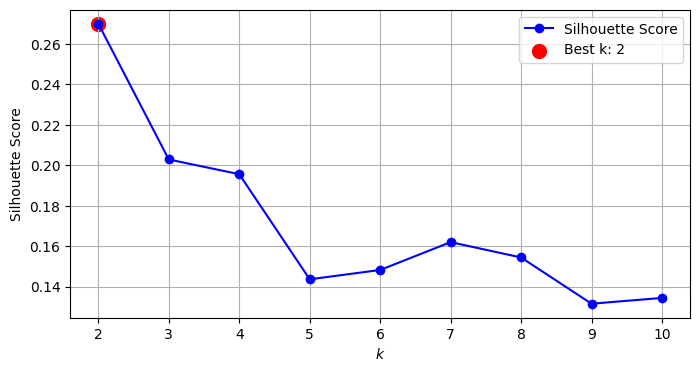


Best K: 2 with a Silhouette Score of 0.2700


In [91]:
k_range = range(2, 11)

# Dictionary to store models and silhouette scores, and list to store each KMeans model for each K
silhouette_scores = {}
kmeans_per_k = []

# Train the models and calculate silhouette score in one step
for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)  # Train KMeans model
    kmeans.fit(df_pca)  # Fit the model to PCA-transformed data
    kmeans_per_k.append(kmeans)  # Store the trained model
    score = silhouette_score(df_pca, kmeans.labels_)  # Calculate silhouette score
    silhouette_scores[k] = score  # Store the score
    print(f"[{k-2}] k={k}, Silhouette Score: {score:.4f}")  # Print the silhouette score for the current k

# Find the best value of K (the one with the highest silhouette score)
best_k = max(silhouette_scores, key=silhouette_scores.get)
best_score = silhouette_scores[best_k]

# Plot the silhouette scores
plt.figure(figsize=(8, 4))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), "bo-", label="Silhouette Score")  # Plot silhouette scores for each K
plt.scatter(best_k, best_score, color='red', s=100, label=f"Best k: {best_k}")  # Highlight the best K
plt.xlabel("$k$")  # X-axis label
plt.ylabel("Silhouette Score")  # Y-axis label
plt.xticks(range(2, 11))  # Set x-ticks to show each K value
plt.grid(True)  # Show grid
plt.legend()  # Show legend
plt.show()  # Display the plot

# Print the best K and its corresponding silhouette score
print(f"\nBest K: {best_k} with a Silhouette Score of {best_score:.4f}")

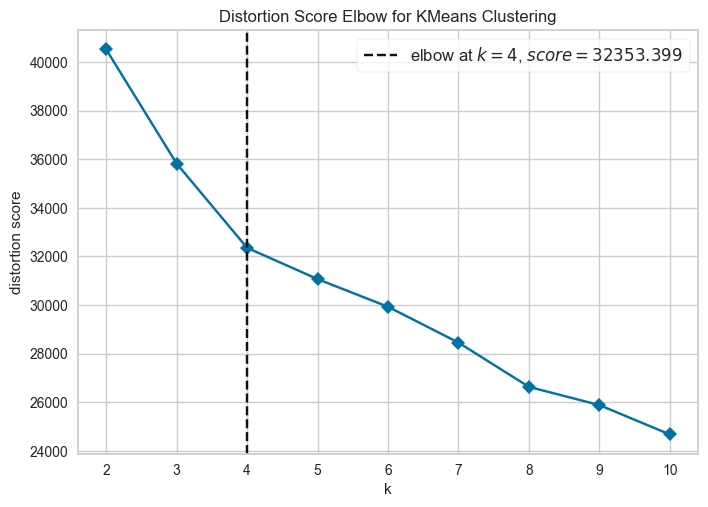

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [94]:
# Instantiate the clustering model and visualizer
model = KMeans(n_clusters=k, random_state=102)
visualizer = KElbowVisualizer(model, k=(2,11), timings=False)

visualizer.fit(df_pca)   # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

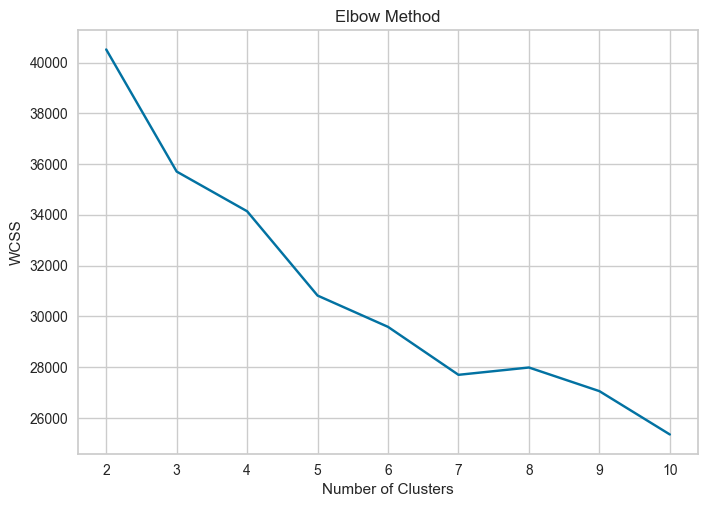

In [95]:
# Elbow method

# Calculate the Within-Cluster Sum of Squares (WCSS) for different values of k
wcss = []  # List to store WCSS for each k
for k in range(2, 11):  # Test between 2 and 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)  # Initialize KMeans with k clusters
    kmeans.fit(df_pca)  # Fit the PCA-transformed data
    wcss.append(kmeans.inertia_)  # Append the inertia (WCSS) for this value of k

# Plot the elbow graph
plt.plot(range(2, 11), wcss)  # Plot WCSS vs. number of clusters
plt.title('Elbow Method')  # Title of the plot
plt.xlabel('Number of Clusters')  # Label for the x-axis
plt.ylabel('WCSS')  # Label for the y-axis
plt.show()  # Display the plot

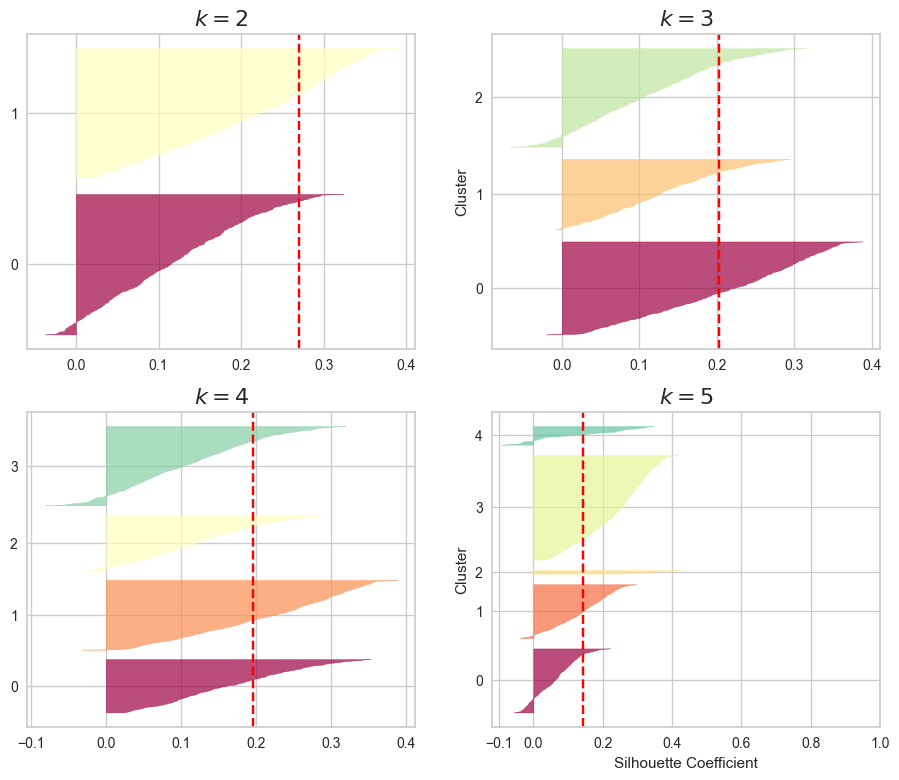

In [ ]:
plt.figure(figsize=(11, 9))

# Loop over the values of k (2, 3, 4, 5) to create subplots for each k value
for k in (2, 3, 4, 5):
    plt.subplot(2, 2, k-1)  # Create a 2x2 grid of subplots, selecting the appropriate position for each k

    y_pred = kmeans_per_k[k].labels_  # Get the cluster labels from the KMeans model for this k
    silhouette_coefficients = silhouette_samples(df_pca, y_pred)  # Calculate the silhouette coefficients for each sample

    padding = len(df_pca) // 30  # Set padding between clusters for visual clarity
    pos = padding  # Initial position for plotting
    ticks = []  # List to store tick positions for y-axis
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]  # Get silhouette coefficients for the current cluster
        coeffs.sort()  # Sort the coefficients in ascending order

        color = mpl.cm.Spectral(i / k)  # Generate a color based on the cluster index
        # Fill the area for the silhouette coefficients of the current cluster
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)  # Set the tick position at the center of the cluster
        pos += len(coeffs) + padding  # Move the position for the next cluster

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))  # Set the y-axis ticks to correspond to the cluster positions
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))  # Label the y-axis with the cluster numbers
    if k in (3, 5):
        plt.ylabel("Cluster")  # Label the y-axis for 3 and 5 clusters
    
    if k in (5, 6):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])  # Set x-axis ticks
        plt.xlabel("Silhouette Coefficient")  # Label the x-axis
    else:
        plt.tick_params(labelbottom=True)  # Show the bottom ticks for all other plots

    plt.axvline(x=silhouette_scores[k], color="red", linestyle="--")  # Add a vertical line for the silhouette score for this k
    plt.title("$k={}$".format(k), fontsize=16)  # Set the title with the value of k

plt.show()  # Display the plot

#### **k = 2**

In [99]:
# Get the model with K=2 (KMeans model for 2 clusters)
k = 2
kmeans_model = kmeans_per_k[k-2]  # K=2 is located at index 0 in the list kmeans_per_k

# Define the number of clusters
num_clusters = len(set(kmeans_model.labels_))  # Get the unique number of clusters from the model's labels

# Get the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to a tuple (r/255, g/255, b/255) for Matplotlib usage
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Assign the colors correctly based on the cluster labels
colors_mapped = [color_map_normalized[str(label)] for label in kmeans_model.labels_]

# Select the first two principal components for the plot (PCA components)
x = df_pca["PC1"]
y = df_pca["PC2"]
z = df_pca["PC2"]  # z is redundant, you can omit this

# Print the color maps and the mapped colors
print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)  # Normalized RGB tuples for Matplotlib
print(colors_mapped)  # List of normalized colors for each data point (based on cluster labels)

{'0': 'rgb(48,103,141)', '1': 'rgb(53,183,120)'}
{'0': (0.18823529411764706, 0.403921568627451, 0.5529411764705883), '1': (0.20784313725490197, 0.7176470588235294, 0.47058823529411764)}
[(0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.20784313725490197, 0.7176470588235294, 0.470588235294117

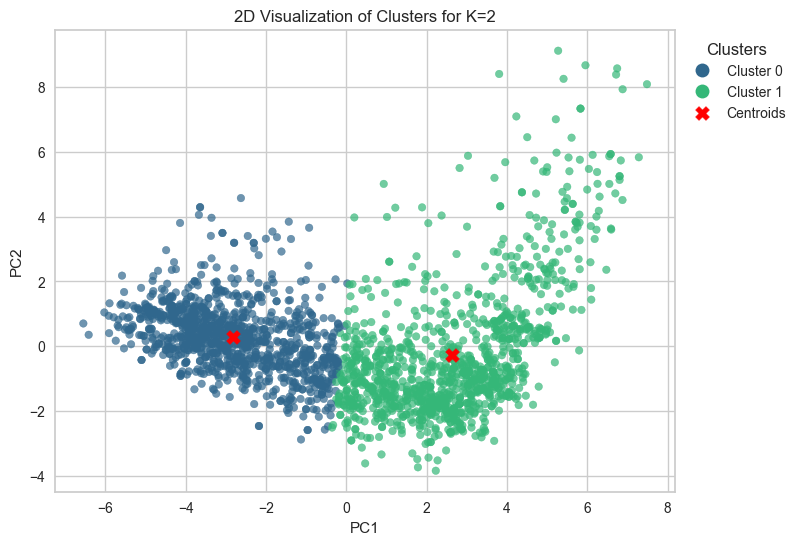

In [100]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=2 clusters
plt.figure(figsize=(8, 6))

# Plot data points with colors according to the clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  # Assign color based on the cluster labels
                      alpha=0.7, s=30, label="Data Points")

# Plot the centroids of the clusters (KMeans center points)
centroids = plt.scatter(kmeans_model.cluster_centers_[:, 0], 
                        kmeans_model.cluster_centers_[:, 1],  
                        c='red', marker='X', s=100, 
                        label='Cluster Centroids')

# Set the plot title and labels
plt.title(f'2D Visualization of Clusters for K={num_clusters}')
plt.xlabel('PC1')  # First Principal Component
plt.ylabel('PC2')  # Second Principal Component
plt.grid(True)

# Add a legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches + [centroids], 
           labels=legend_labels + ["Centroids"], 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

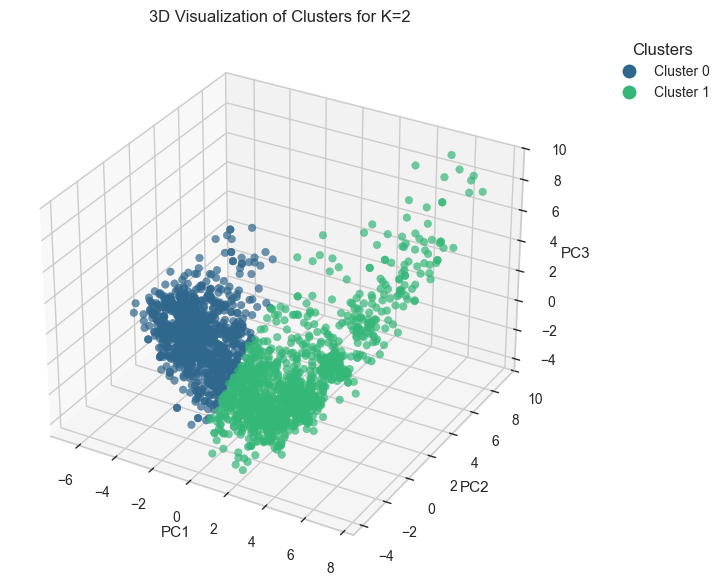

In [101]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K=2 clusters
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot data points with colors according to the clusters
scatter = ax.scatter(x, y, z, 
                     c=colors_mapped,  # Assign color based on the cluster labels
                     alpha=0.7, s=30)

# Set plot title and axis labels
ax.set_title(f'3D Visualization of Clusters for K={num_clusters}')
ax.set_xlabel('PC1')  # First Principal Component
ax.set_ylabel('PC2')  # Second Principal Component
ax.set_zlabel('PC3')  # Third Principal Component

# Adjust the initial view angle (optional, for better visualization)
# ax.view_init(elev=40, azim=45)

# Add a legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [102]:
# '3D Clusters with K=2'
df_pca_3D = df_pca.iloc[:, :3].copy()  # Select the first three principal components
df_pca_3D['Cluster'] = kmeans_model.labels_  # Assign cluster labels to the DataFrame
df_pca_3D['Cluster'] = df_pca_3D['Cluster'].astype(str)  # Convert cluster labels to strings

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_pca_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color="Cluster", 
                    title=f'3D Clusters with K={num_clusters}', 
                    color_discrete_map=color_map,  # Apply the color map
                    category_orders={"Cluster": ["0", "1"]})  # Order cluster categories

fig.update_traces(marker=dict(size=4, opacity=0.7))  # Adjust marker size and transparency
fig.update_layout(width=800, height=700,  # Set layout dimensions
                  legend=dict(font=dict(size=14)))  # Customize legend font size

# Correctly update legend names
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()  # Display the 3D plot

#### **k = 3**

In [103]:
# Get the model with K=3
k = 3
kmeans_model = kmeans_per_k[k-2]  # K=2 is at index 0 in the kmeans_per_k list

# Define the number of clusters
num_clusters = len(set(kmeans_model.labels_))  # The number of clusters is the unique count of labels

# Get the RGB color palette and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Assign colors based on cluster labels
colors_mapped = [color_map_normalized[str(label)] for label in kmeans_model.labels_]

# Prepare the data for visualization
x = df_pca["PC1"]  # First principal component
y = df_pca["PC2"]  # Second principal component
z = df_pca["PC2"]  # Using PC2 again for z-axis (consider revising if third component is intended)

print(color_map)  # Print the dictionary with RGB format
print(color_map_normalized)  # Print the normalized color map
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451)}
[(0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.321568627450

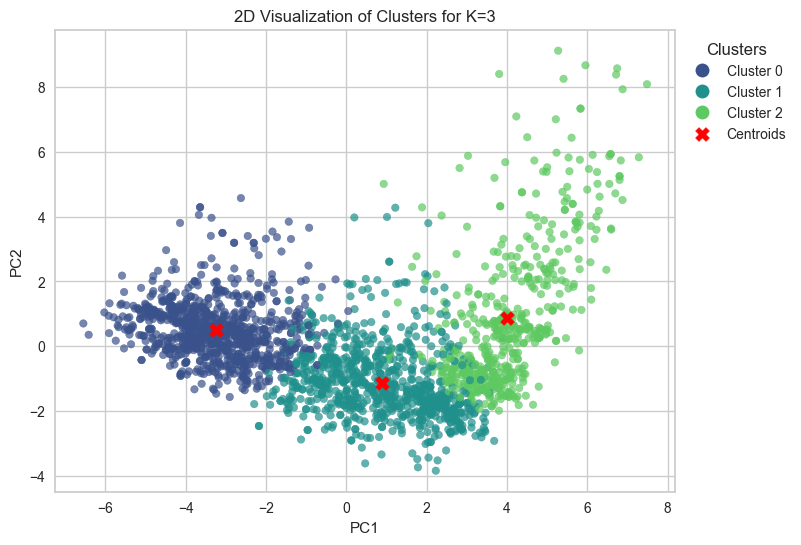

In [104]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=3
plt.figure(figsize=(8, 6))

# Data points with colors based on clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data Points")

# Add cluster centroids
centroids = plt.scatter(kmeans_model.cluster_centers_[:, 0], 
                        kmeans_model.cluster_centers_[:, 1],  
                        c='red', marker='X', s=100, 
                        label='Cluster Centroids')

plt.title(f'2D Visualization of Clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches + [centroids], 
           labels=legend_labels + ["Centroids"], 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

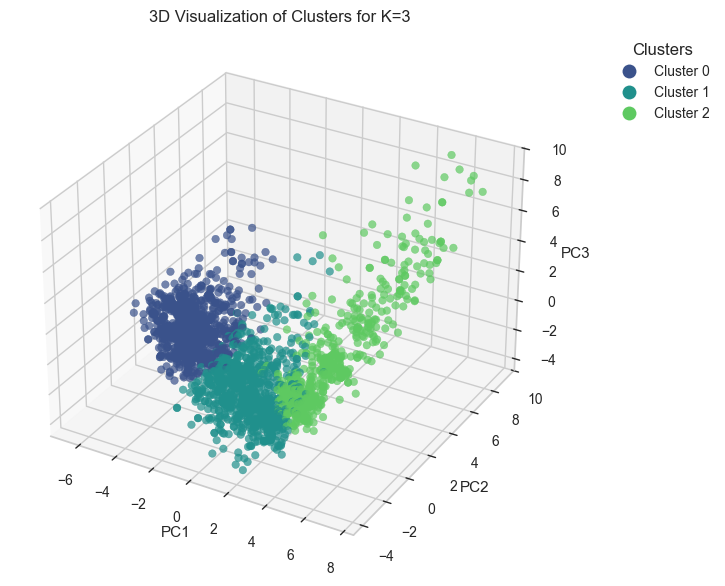

In [105]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K = 3
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points with colors based on clusters
scatter = ax.scatter(x, y, z, 
                     c=colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of Clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust initial view for better angle
#ax.view_init(elev=40, azim=45)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [106]:
# '3D Clusters with K=3'
df_pca_3D = df_pca.iloc[:, :3].copy()
df_pca_3D['Cluster'] = kmeans_model.labels_
df_pca_3D['Cluster'] = df_pca_3D['Cluster'].astype(str)

# Reverse the color assignment order
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_pca_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color="Cluster", 
                    title=f'3D Clusters with K={num_clusters}', 
                    color_discrete_map=color_map,
                    category_orders={"Cluster": ["0", "1", "2"]})

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### **k = 4**

In [107]:
# Get the model with K=4
k = 4
kmeans_model = kmeans_per_k[k-2]  # K=2 is at index 0 in the kmeans_per_k list

# Define the number of clusters
num_clusters = len(set(kmeans_model.labels_))

# Get the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to a tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Correctly assign colors
colors_mapped = [color_map_normalized[str(label)] for label in kmeans_model.labels_]

x = df_pca["PC1"]
y = df_pca["PC2"]
z = df_pca["PC2"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.1607843137254902, 0.47058823529411764, 0.5568627450980392), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (

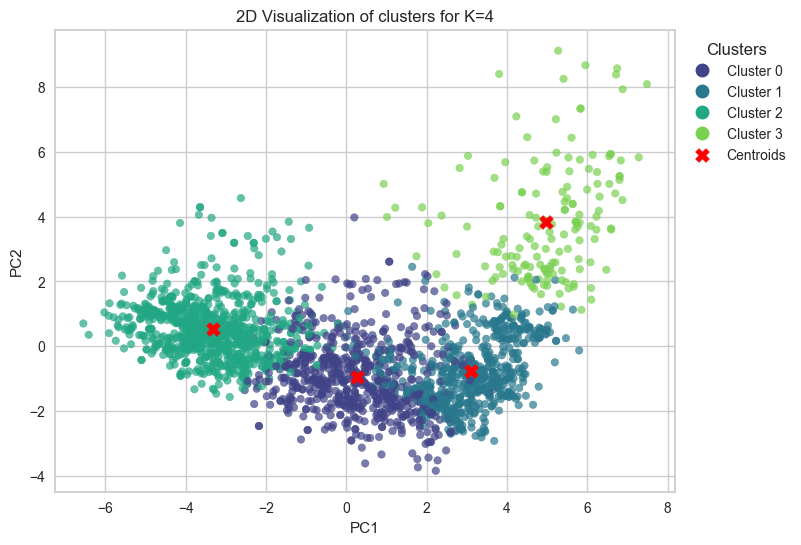

In [108]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=4
plt.figure(figsize=(8, 6))

# Data points colored according to clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data points")

# Add the cluster centroids
centroids = plt.scatter(kmeans_model.cluster_centers_[:, 0], 
                        kmeans_model.cluster_centers_[:, 1],  
                        c='red', marker='X', s=100, 
                        label='Cluster centroids')

plt.title(f'2D Visualization of clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add legend with the colors of the clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches + [centroids], 
           labels=legend_labels + ["Centroids"], 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

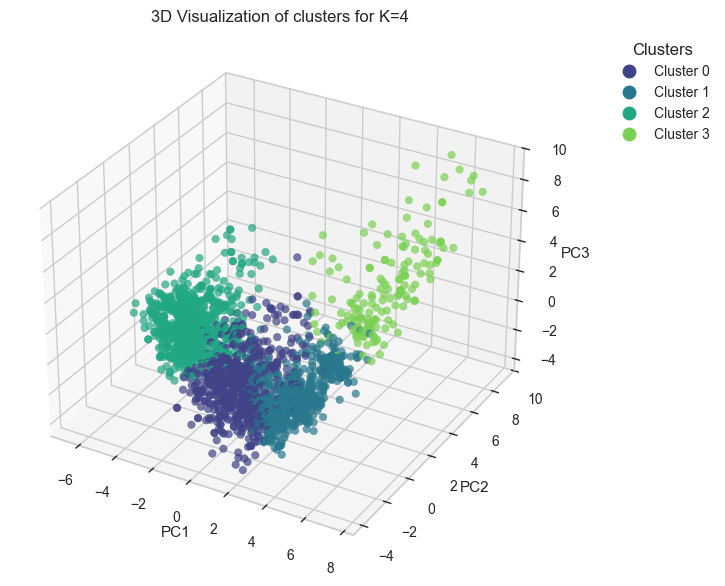

In [109]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points colored according to clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust the initial view for a better angle
#ax.view_init(elev=40, azim=45)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()


In [110]:
# '3D Clusters with K=4'
df_pca_3D = df_pca.iloc[:, :3].copy()
df_pca_3D['Cluster'] = kmeans_model.labels_
df_pca_3D['Cluster'] = df_pca_3D['Cluster'].astype(str)

# Reverse the color assignment order
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_pca_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'3D Clusters with K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Correctly update legend names
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

### DBSCAN

- If you want fewer clusters → Use a lower min_samples.
- If you want fewer anomalies → Use a higher min_samples.

In [111]:
# I am searching between 3 and 5 clusters and with an anomaly percentage lower than 10% (but with 10% as the maximum)

# Define min_samples values according to heuristics
min_samples_values = [5, 10, 15, 20, 25]  
eps_values = np.linspace(0.001, 6, 100)

best_config = []
best_models = {}
experiments = {}

# Loop to iterate over min_samples
for min_samples in min_samples_values:
    outlier_percent = []
    
    # Loop to iterate over eps
    for eps in eps_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df_pca)

        # Count the number of clusters (excluding noise -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Calculate the anomaly percentage
        anomaly_percentage = (labels == -1).sum() / len(labels) * 100
        outlier_percent.append(anomaly_percentage)

        # Calculate Silhouette Score only if there is more than one cluster
        silhouette = silhouette_score(df_pca, labels) if num_clusters > 1 else np.nan

        # Condition to save the configuration: 3-5 clusters, anomalies <= 10%
        if 3 <= num_clusters <= 5 and anomaly_percentage <= 10:
            best_config.append((eps, min_samples, num_clusters, anomaly_percentage, round(silhouette, 3)))

            # Save the best model by number of clusters
            if num_clusters not in best_models or anomaly_percentage > best_models[num_clusters]["anomalies"]:
                best_models[num_clusters] = {
                    "model": dbscan,
                    "eps": eps,
                    "min_samples": min_samples,
                    "anomalies": anomaly_percentage
                }
    
    experiments[min_samples] = outlier_percent.copy()

# Convert to DataFrame
df_results = pd.DataFrame(best_config, columns=["EPS", "min_samples", "Clusters", "Anomalies (%)", "Silhouette Score"])
print(df_results.sort_values(by="Anomalies (%)", ascending=False))

         EPS  min_samples  Clusters  Anomalies (%)  Silhouette Score
61  3.454970           15         3       9.820628             0.086
62  3.515566           15         3       8.968610             0.146
63  3.576162           15         4       7.713004             0.140
40  3.394374           10         5       6.995516             0.096
41  3.454970           10         4       6.816143             0.121
..       ...          ...       ...            ...               ...
59  5.939404           10         3       0.313901             0.451
60  6.000000           10         3       0.313901             0.451
37  5.878808            5         3       0.313901             0.451
39  6.000000            5         3       0.313901             0.451
38  5.939404            5         3       0.313901             0.451

[68 rows x 5 columns]


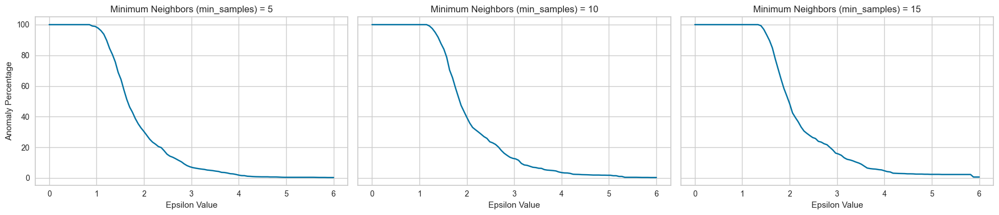

In [112]:
# Visualization % of anomalies (which decreases as the value of our EPSILON distance increases)
fig, axes = plt.subplots(1, 3, figsize=(18, 4), dpi=100, sharey=True)

for i, min_samples in enumerate([5, 10, 15]):
    sns.lineplot(ax=axes[i], 
                 x=np.linspace(0.001, 6, 100),             
                 y=experiments[min_samples])
    
    axes[i].set_ylabel("Anomaly Percentage")
    axes[i].set_xlabel("Epsilon Value")
    axes[i].set_title(f"Minimum Neighbors (min_samples) = {min_samples}")

plt.tight_layout()
plt.show()

In [114]:
# Best models
df_results.sort_values(by="Anomalies (%)", ascending=False).head(5)

,EPS,min_samples,Clusters,Anomalies (%),Silhouette Score
61,3.454970,15,3,9.820628,0.086
62,3.515566,15,3,8.968610,0.146
63,3.576162,15,4,7.713004,0.140
40,3.394374,10,5,6.995516,0.096
41,3.454970,10,4,6.816143,0.121


Best Models with a Maximum of 10% Anomalies:
- Clusters = 3 -> EPS: 3.454,  min_samples: 15, Silhouette: 0.086
- Clusters = 4 -> EPS: 3.576,  min_samples: 15, Silhouette: 0.140
- Clusters = 5 -> EPS: 3.39,  min_samples: 10, Silhouette: 0.096

#### K = 3 (EPS: 3.454,  min_samples: 15)

In [115]:
# Create a copy of the PCA DataFrame for DBSCAN
df_dbscan_3 = df_pca.copy()

# Initialize the DBSCAN model with selected EPS and min_samples values
dbscan_3 = DBSCAN(eps = 3.45, 
                  min_samples = 15)

# Fit the DBSCAN model to the data
dbscan_3.fit(df_dbscan_3)

# Assign the cluster labels to the DataFrame
df_dbscan_3["Cluster"] = dbscan_3.labels_

# Display the normalized count of each cluster (as a percentage)
round(df_dbscan_3["Cluster"].value_counts(normalize=True)*100, 2)

Cluster
 0    83.99
-1     9.87
 2     4.39
 1     1.75
Name: proportion, dtype: float64

In [116]:
model = dbscan_3
df_model = df_dbscan_3

In [117]:
# DBSCAN
# Define the number of clusters, including noise (labeled as -1)
num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)  # Excludes noise (-1) if it exists

# Get the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Add color for noise (-1)
color_map["-1"] = "rgb(0,0,0)"  # Assign black color for noise

# Convert "rgb(r,g,b)" to a tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Assign colors correctly, handling the noise (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC3"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)  # Normalized color map for Matplotlib
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)', '-1': 'rgb(0,0,0)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451), '-1': (0.0, 0.0, 0.0)}
[(0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.22745098039215686, 0.3215686274509804, 0.5450980392

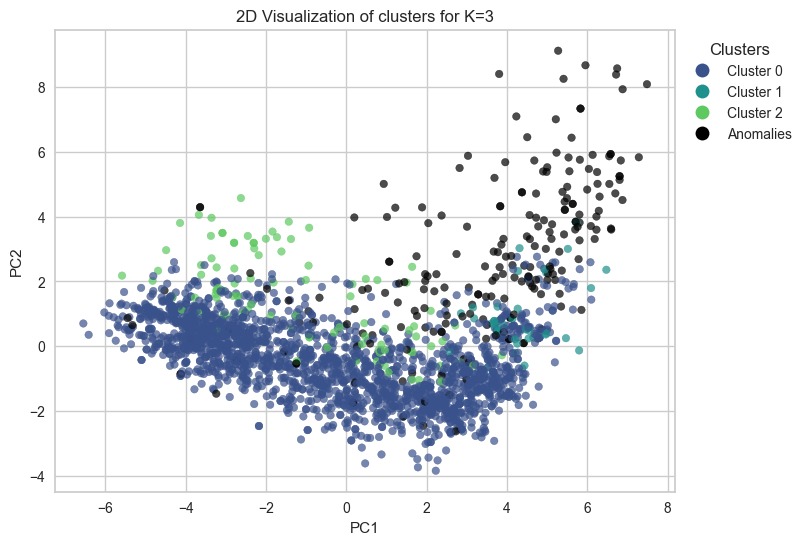

In [118]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=3
plt.figure(figsize=(8, 6))

# Data points with colors according to the clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data Points")

plt.title(f'2D Visualization of clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add cluster legend
unique_clusters = set(df_model['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalies' for i in unique_clusters]  # Label noise as 'Anomalies'
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


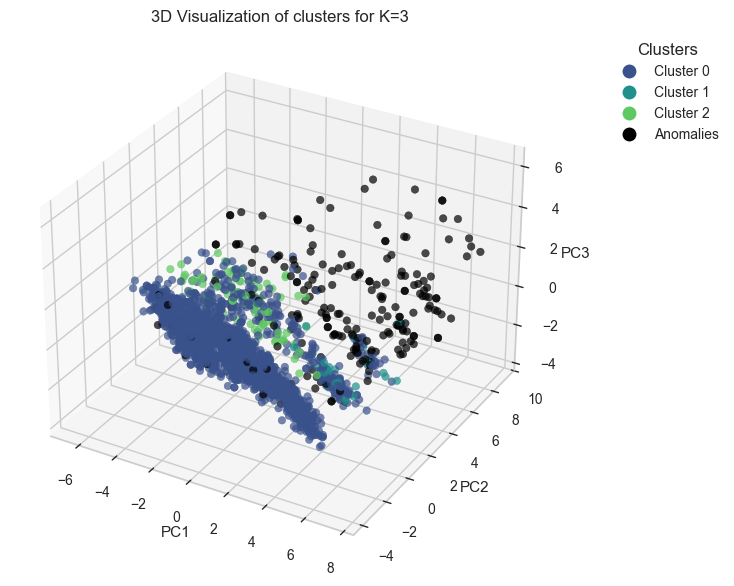

In [119]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K = 3
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points with colors according to the clusters
scatter = ax.scatter(x, y, z, 
                     c=colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust the initial view for a better angle
#ax.view_init(elev=40, azim=45)

unique_clusters = set(df_model['Cluster'])  # Get unique clusters
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalies' for i in unique_clusters]

# Create legend patches (including for anomalies)
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()


In [120]:
# '3D Clusters with K=3'
df_dbscan_k3_3D = df_pca.iloc[:, :3].copy()  # Select the first three principal components
df_dbscan_k3_3D['Cluster'] = model.labels_  # Assign the cluster labels
df_dbscan_k3_3D['Cluster'] = df_dbscan_k3_3D['Cluster'].astype(str)  # Ensure cluster column is of type string

# Create a new color_map ensuring '-1' (noise) is labeled as "Anomalies"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Assign a specific color for anomalies if desired

# Create the 3D figure with updated colors
fig = px.scatter_3d(df_dbscan_k3_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color="Cluster", 
                    title=f'3D Clusters with K={num_clusters}', 
                    color_discrete_map=color_map_updated,  # Use updated color map
                    category_orders={"Cluster": ["0", "1", "2", "3"]})  # Customize the order of the clusters

# Update traces to adjust marker size and opacity
fig.update_traces(marker=dict(size=4, opacity=0.7))

# Customize the layout and legend
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend labels and hover text to display cluster names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalies",  # Replace '-1' with "Anomalies" in the legend
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

# Show the plot
fig.show()

#### K = 4 (EPS: 3.576,  min_samples: 15)

In [122]:
# Create a copy of the PCA DataFrame
df_dbscan_4 = df_pca.copy()

# Initialize the DBSCAN model with specified eps and min_samples
dbscan_4 = DBSCAN(eps=3.576, min_samples=15)

# Fit the DBSCAN model to the data
dbscan_4.fit(df_dbscan_4)

# Assign the cluster labels to the new "Cluster" column
df_dbscan_4["Cluster"] = dbscan_4.labels_

# Calculate the percentage distribution of each cluster
round(df_dbscan_4["Cluster"].value_counts(normalize=True) * 100, 2)

Cluster
 0    89.28
-1     7.71
 1     1.97
 3     0.63
 2     0.40
Name: proportion, dtype: float64

In [123]:
model = dbscan_4
df_model = df_dbscan_4

In [124]:
# DBSCAN
# Define the number of clusters, including noise (labeled as -1)
num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)  # Excludes noise (-1) if it exists

# Get the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Add color for noise (-1)
color_map["-1"] = "rgb(0,0,0)"  # Assign black color for noise

# Convert "rgb(r,g,b)" to a tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Assign colors correctly, handling the noise (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC3"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)  # Normalized color map for Matplotlib
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)', '-1': 'rgb(0,0,0)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294), '-1': (0.0, 0.0, 0.0)}
[(0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274,

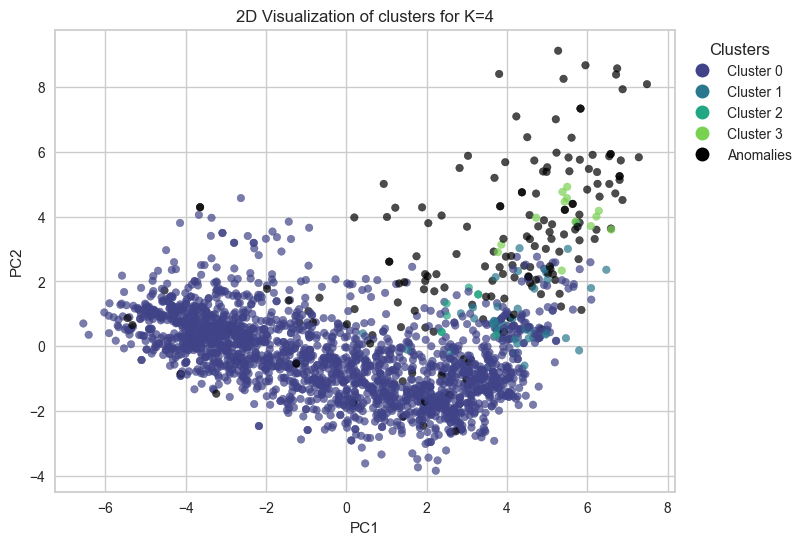

In [125]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=4
plt.figure(figsize=(8, 6))

# Data points with colors according to the clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data Points")

plt.title(f'2D Visualization of clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add cluster legend
unique_clusters = set(df_model['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalies' for i in unique_clusters]  # Label noise as 'Anomalies'
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


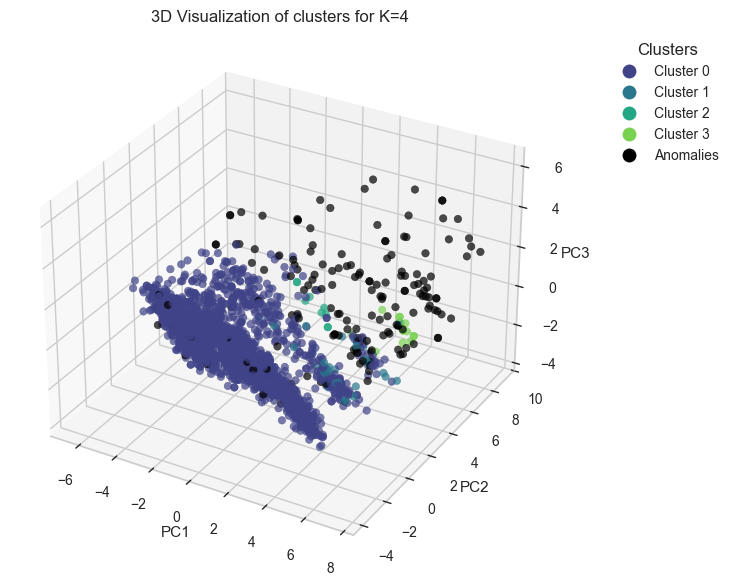

In [126]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points with colors according to the clusters
scatter = ax.scatter(x, y, z, 
                     c=colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust the initial view for a better angle
#ax.view_init(elev=40, azim=45)

unique_clusters = set(df_model['Cluster'])  # Get unique clusters
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalies' for i in unique_clusters]

# Create legend patches (including for anomalies)
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()


In [127]:
# '3D Clusters with K=4'
df_dbscan_k3_3D = df_pca.iloc[:, :3].copy()  # Select the first three principal components
df_dbscan_k3_3D['Cluster'] = model.labels_  # Assign the cluster labels
df_dbscan_k3_3D['Cluster'] = df_dbscan_k3_3D['Cluster'].astype(str)  # Ensure cluster column is of type string

# Create a new color_map ensuring '-1' (noise) is labeled as "Anomalies"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Assign a specific color for anomalies if desired

# Create the 3D figure with updated colors
fig = px.scatter_3d(df_dbscan_k3_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color="Cluster", 
                    title=f'3D Clusters with K={num_clusters}', 
                    color_discrete_map=color_map_updated,  # Use updated color map
                    category_orders={"Cluster": ["0", "1", "2", "3"]})  # Customize the order of the clusters

# Update traces to adjust marker size and opacity
fig.update_traces(marker=dict(size=4, opacity=0.7))

# Customize the layout and legend
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend labels and hover text to display cluster names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalies",  # Replace '-1' with "Anomalies" in the legend
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

# Show the plot
fig.show()

#### K = 5 (EPS: 3.39,  min_samples: 10)

In [135]:
# Create a copy of the PCA DataFrame
df_dbscan_5 = df_pca.copy()

# Initialize the DBSCAN model with specified eps and min_samples
dbscan_5 = DBSCAN(eps=3.39, min_samples=10)

# Fit the DBSCAN model to the data
dbscan_5.fit(df_dbscan_5)

# Assign the cluster labels to the new "Cluster" column
df_dbscan_5["Cluster"] = dbscan_5.labels_

# Calculate the percentage distribution of each cluster
round(df_dbscan_5["Cluster"].value_counts(normalize=True) * 100, 2)

Cluster
 0    84.26
-1     7.04
 3     4.71
 1     2.78
 2     0.85
 4     0.36
Name: proportion, dtype: float64

In [136]:
model = dbscan_5
df_model = df_dbscan_5

In [137]:
# DBSCAN
# Define the number of clusters, including noise (labeled as -1)
num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)  # Excludes noise (-1) if it exists

# Get the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Add color for noise (-1)
color_map["-1"] = "rgb(0,0,0)"  # Assign black color for noise

# Convert "rgb(r,g,b)" to a tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Assign colors correctly, handling the noise (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC3"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)  # Normalized color map for Matplotlib
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(68,57,130)', '1': 'rgb(48,103,141)', '2': 'rgb(32,144,140)', '3': 'rgb(53,183,120)', '4': 'rgb(144,214,67)', '-1': 'rgb(0,0,0)'}
{'0': (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), '1': (0.18823529411764706, 0.403921568627451, 0.5529411764705883), '2': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '3': (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), '4': (0.5647058823529412, 0.8392156862745098, 0.2627450980392157), '-1': (0.0, 0.0, 0.0)}
[(0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.50980392156

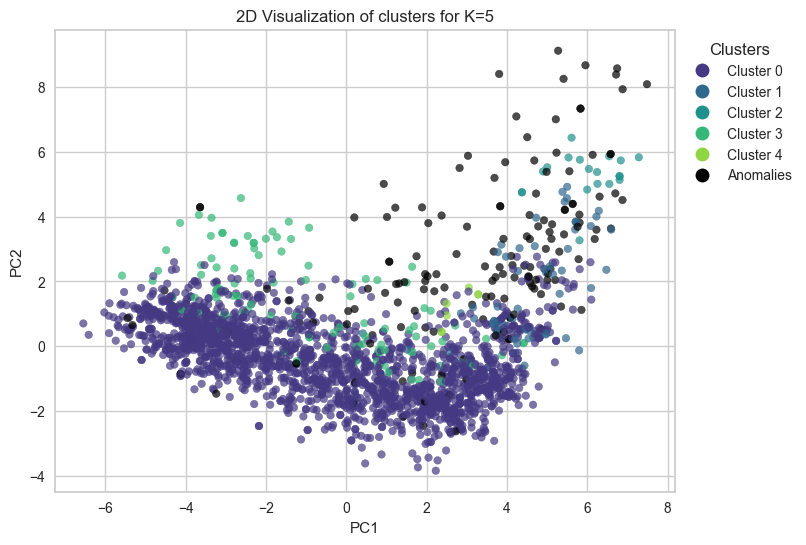

In [138]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=5
plt.figure(figsize=(8, 6))

# Data points with colors according to the clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data Points")

plt.title(f'2D Visualization of clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add cluster legend
unique_clusters = set(df_model['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalies' for i in unique_clusters]  # Label noise as 'Anomalies'
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


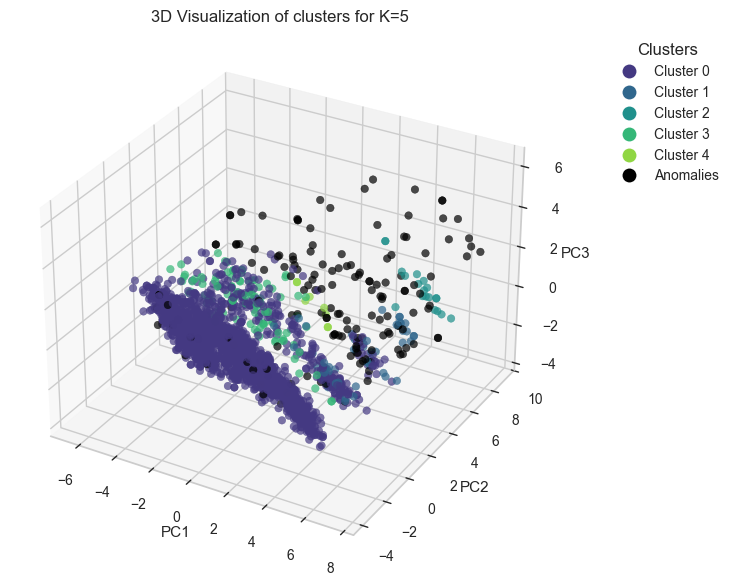

In [139]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K = 5
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points with colors according to the clusters
scatter = ax.scatter(x, y, z, 
                     c=colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust the initial view for a better angle
#ax.view_init(elev=40, azim=45)

unique_clusters = set(df_model['Cluster'])  # Get unique clusters
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalies' for i in unique_clusters]

# Create legend patches (including for anomalies)
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()


In [140]:
# '3D Clusters with K=5'
df_dbscan_k3_3D = df_pca.iloc[:, :3].copy()  # Select the first three principal components
df_dbscan_k3_3D['Cluster'] = model.labels_  # Assign the cluster labels
df_dbscan_k3_3D['Cluster'] = df_dbscan_k3_3D['Cluster'].astype(str)  # Ensure cluster column is of type string

# Create a new color_map ensuring '-1' (noise) is labeled as "Anomalies"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Assign a specific color for anomalies if desired

# Create the 3D figure with updated colors
fig = px.scatter_3d(df_dbscan_k3_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color="Cluster", 
                    title=f'3D Clusters with K={num_clusters}', 
                    color_discrete_map=color_map_updated,  # Use updated color map
                    category_orders={"Cluster": ["0", "1", "2", "3"]})  # Customize the order of the clusters

# Update traces to adjust marker size and opacity
fig.update_traces(marker=dict(size=4, opacity=0.7))

# Customize the layout and legend
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend labels and hover text to display cluster names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalies",  # Replace '-1' with "Anomalies" in the legend
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

# Show the plot
fig.show()

### Agglomerative

#### Distance between clusters: 'WARD'

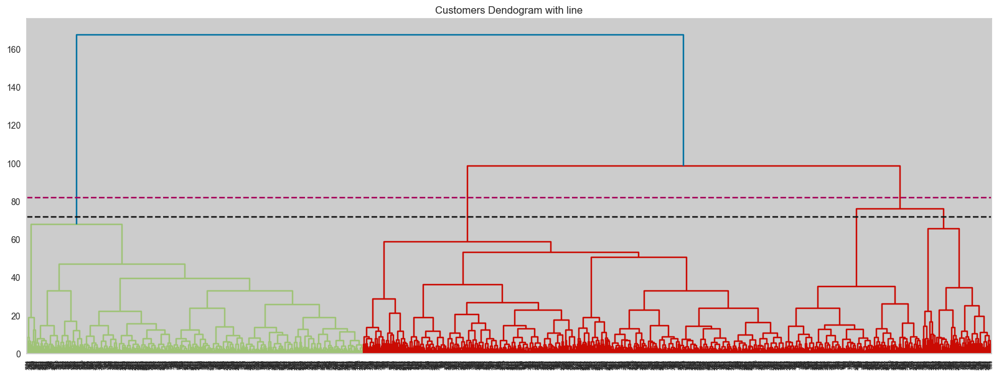

In [144]:
# Dendrograms to calculate the number of clusters
plt.figure(figsize=(20, 7))
plt.title("Customers Dendogram with line")
clusters = shc.linkage(df_pca, 
            method='ward', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 72, color = 'k', linestyle = '--')
plt.axhline(y = 82, color = 'm', linestyle = '--')

- Through the dendrograms, the best options for K would be 3 and 4.

##### **k = 3**

In [145]:
# Copy the DataFrame to preserve the original data
df_AggClu_ward_k3 = df_pca.copy()

# Define the Agglomerative Clustering model
AggClu_ward_k3 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')  

# Fit the model to the data
AggClu_ward_k3.fit(df_pca)  

# Add the cluster labels to the DataFrame
df_AggClu_ward_k3["Cluster"] = AggClu_ward_k3.labels_  

# Calculate the percentage of each cluster and round the values to two decimal places
round(df_AggClu_ward_k3["Cluster"].value_counts(normalize=True) * 100, 2)


Cluster
2    43.72
1    34.89
0    21.39
Name: proportion, dtype: float64

In [146]:
model = AggClu_ward_k3
df_model = df_AggClu_ward_k3

In [155]:
silhouette_agglomerative_k3 = silhouette_score(df_pca, model.labels_)
print(f'Silhouette Score Aglomerativo (K={len(set(model.labels_))}): {round(silhouette_agglomerative_k3,4)}')

Silhouette Score Aglomerativo (K=3): 0.1699


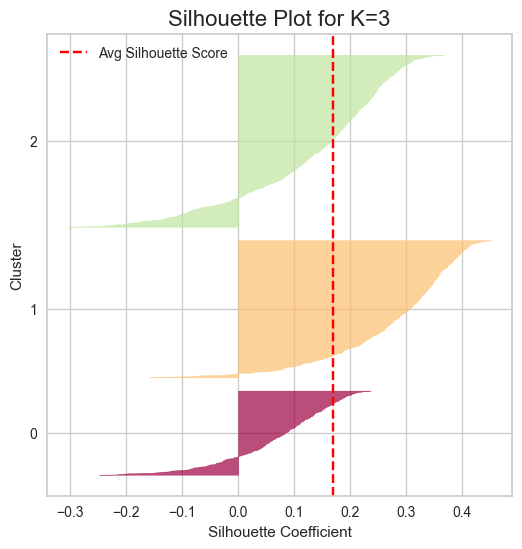

In [148]:
# silhouette_samples
# Obtain cluster labels from the model
y_pred = df_model["Cluster"].values  # The cluster labels assigned by the model
k = len(set(y_pred))  # Number of clusters

# Calculate silhouette coefficients
silhouette_coefficients = silhouette_samples(df_pca, y_pred)  # Calculate silhouette for each sample
silhouette_avg = silhouette_score(df_pca, y_pred)  # General average silhouette score

# Create the figure
plt.figure(figsize=(6, 6))

padding = len(df_pca) // 30  # Space between clusters
pos = padding  
ticks = []  

# Iterate over each cluster
for i in range(k):
    coeffs = silhouette_coefficients[y_pred == i]  # Filter by cluster
    coeffs.sort()  # Sort the silhouette scores

    color = mpl.cm.Spectral(i / k)  # Color palette
    plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                      facecolor=color, edgecolor=color, alpha=0.7)
    
    ticks.append(pos + len(coeffs) // 2)  # Position the cluster on the graph
    pos += len(coeffs) + padding  # Update position for next cluster

# Configure axes and legend
plt.gca().yaxis.set_major_locator(FixedLocator(ticks))  # Set ticks on the y-axis
plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))  # Set tick labels as cluster indices

plt.xlabel("Silhouette Coefficient")  # X-axis label
plt.ylabel("Cluster")  # Y-axis label
plt.tick_params(labelbottom=True)

# Red line indicating the average silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--", label="Avg Silhouette Score")
plt.title(f"Silhouette Plot for K={k}", fontsize=16)  # Plot title
plt.legend()  # Display legend
plt.show()

In [149]:
# Define the number of clusters
num_clusters = len(set(model.labels_))

# Obtain the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Assign colors correctly
colors_mapped = [color_map_normalized[str(label)] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC2"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451)}
[(0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412

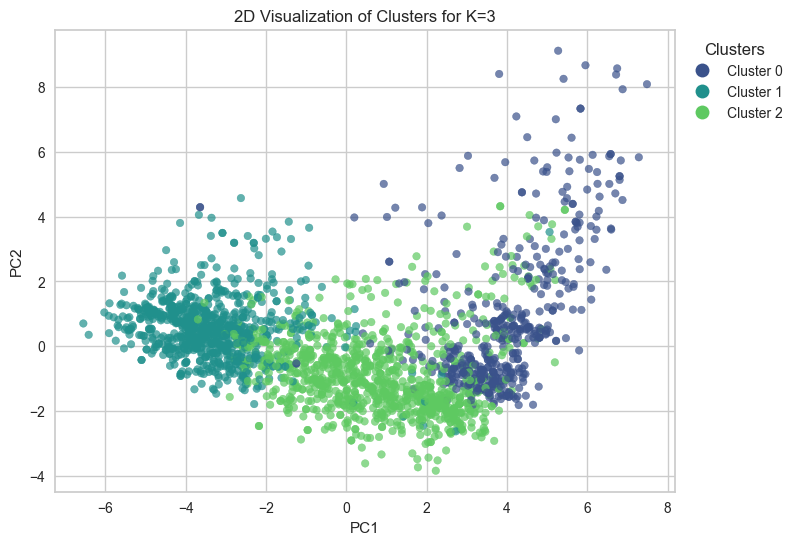

In [ ]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=3
plt.figure(figsize=(8, 6))

# Data points colored according to clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data Points")

plt.title(f'2D Visualization of Clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

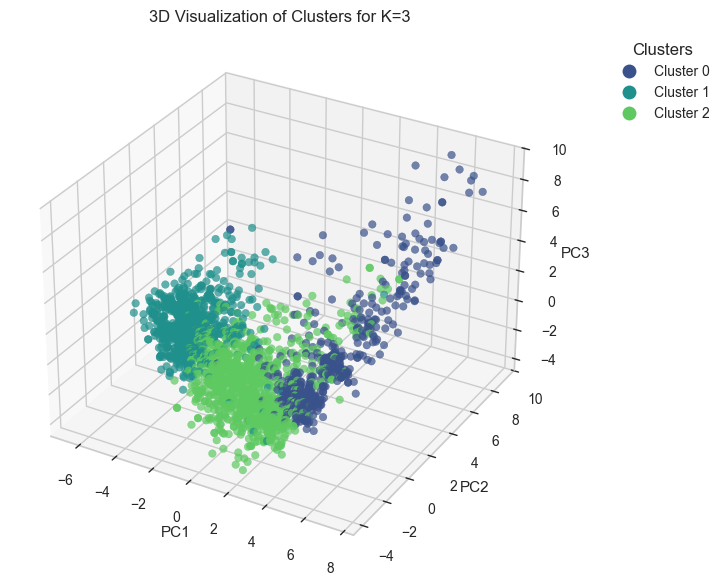

In [ ]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K=3
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points colored according to clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of Clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust the initial view for a better angle
#ax.view_init(elev=40, azim=45)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [153]:
# 'Clusters in 3D with K=3'
df_AggClu_ward_3D = df_pca.iloc[:, :3].copy()
df_AggClu_ward_3D['Cluster'] = model.labels_
df_AggClu_ward_3D['Cluster'] = df_AggClu_ward_3D['Cluster'].astype(str)

# Invert the color assignment order
# color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_AggClu_ward_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'3D Clusters with K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

##### **k = 4**

In [154]:
# Copy the DataFrame to preserve the original data
df_AggClu_ward_k4 = df_pca.copy()

# Define the Agglomerative Clustering model
AggClu_ward_k4 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')

# Fit the model to the data
AggClu_ward_k4.fit(df_pca)

# Add the cluster labels to the DataFrame
df_AggClu_ward_k4["Cluster"] = AggClu_ward_k4.labels_

# Calculate the percentage of each cluster and round the values to two decimal places
round(df_AggClu_ward_k4["Cluster"].value_counts(normalize=True)*100,2)

Cluster
2    43.72
0    34.89
3    14.26
1     7.13
Name: proportion, dtype: float64

In [156]:
model = AggClu_ward_k4
df_model = df_AggClu_ward_k4

In [157]:
silhouette_agglomerative_k4 = silhouette_score(df_pca, model.labels_)
print(f'Silhouette Score Aglomerativo (K={len(set(model.labels_))}): {round(silhouette_agglomerative_k4,4)}')

Silhouette Score Aglomerativo (K=4): 0.1557


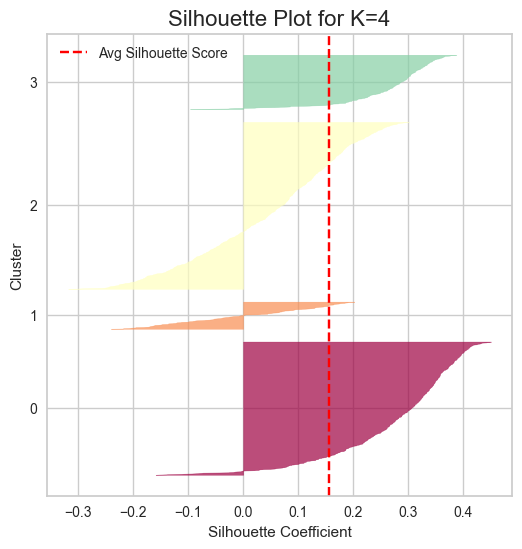

In [158]:
# silhouette_samples
# Obtain cluster labels from the model
y_pred = df_model["Cluster"].values  # The cluster labels assigned by the model
k = len(set(y_pred))  # Number of clusters

# Calculate silhouette coefficients
silhouette_coefficients = silhouette_samples(df_pca, y_pred)  # Calculate silhouette for each sample
silhouette_avg = silhouette_score(df_pca, y_pred)  # General average silhouette score

# Create the figure
plt.figure(figsize=(6, 6))

padding = len(df_pca) // 30  # Space between clusters
pos = padding  
ticks = []  

# Iterate over each cluster
for i in range(k):
    coeffs = silhouette_coefficients[y_pred == i]  # Filter by cluster
    coeffs.sort()  # Sort the silhouette scores

    color = mpl.cm.Spectral(i / k)  # Color palette
    plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                      facecolor=color, edgecolor=color, alpha=0.7)
    
    ticks.append(pos + len(coeffs) // 2)  # Position the cluster on the graph
    pos += len(coeffs) + padding  # Update position for next cluster

# Configure axes and legend
plt.gca().yaxis.set_major_locator(FixedLocator(ticks))  # Set ticks on the y-axis
plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))  # Set tick labels as cluster indices

plt.xlabel("Silhouette Coefficient")  # X-axis label
plt.ylabel("Cluster")  # Y-axis label
plt.tick_params(labelbottom=True)

# Red line indicating the average silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--", label="Avg Silhouette Score")
plt.title(f"Silhouette Plot for K={k}", fontsize=16)  # Plot title
plt.legend()  # Display legend
plt.show()

In [159]:
# Define the number of clusters
num_clusters = len(set(model.labels_))

# Obtain the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Assign colors correctly
colors_mapped = [color_map_normalized[str(label)] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC2"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.4745098039215686, 0.8196078431372549, 0.3176470588235294), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.4745098039215686, 0.8196078431372549, 0.3176470588235294), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.

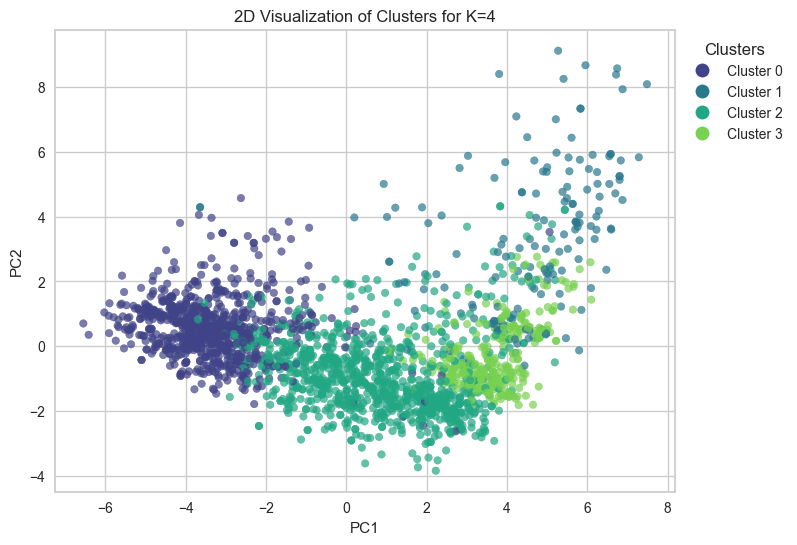

In [160]:
# 2D VISUALIZATION -> using PC1 and PC2 for K=4
plt.figure(figsize=(8, 6))

# Data points colored according to clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Data Points")

plt.title(f'2D Visualization of Clusters for K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

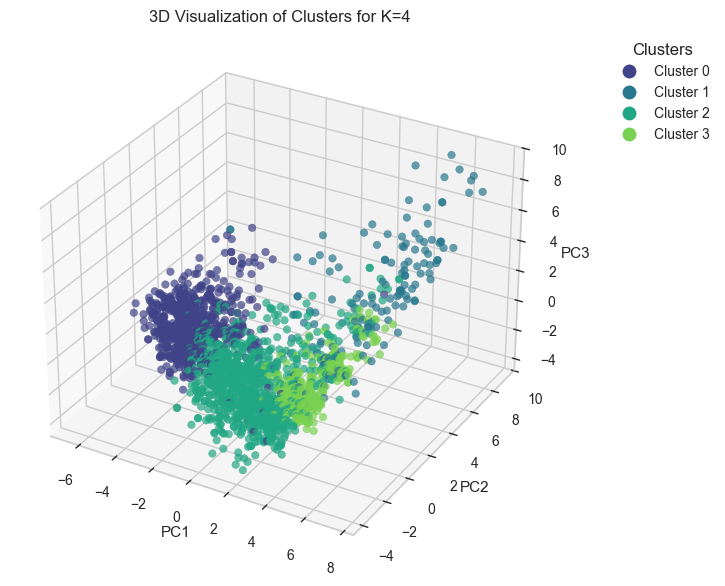

In [161]:
# 3D VISUALIZATION -> using PC1, PC2, and PC3 for K=4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Data points colored according to clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Set title and axis labels
ax.set_title(f'3D Visualization of Clusters for K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Adjust the initial view for a better angle
#ax.view_init(elev=40, azim=45)

# Add legend with cluster colors
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [ ]:
# 'Clusters in 3D with K=4'
df_AggClu_ward_3D = df_pca.iloc[:, :3].copy()
df_AggClu_ward_3D['Cluster'] = model.labels_
df_AggClu_ward_3D['Cluster'] = df_AggClu_ward_3D['Cluster'].astype(str)

# Invert the color assignment order
# color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_AggClu_ward_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'3D Clusters with K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### Distance between cluster:  "AVERAGE"

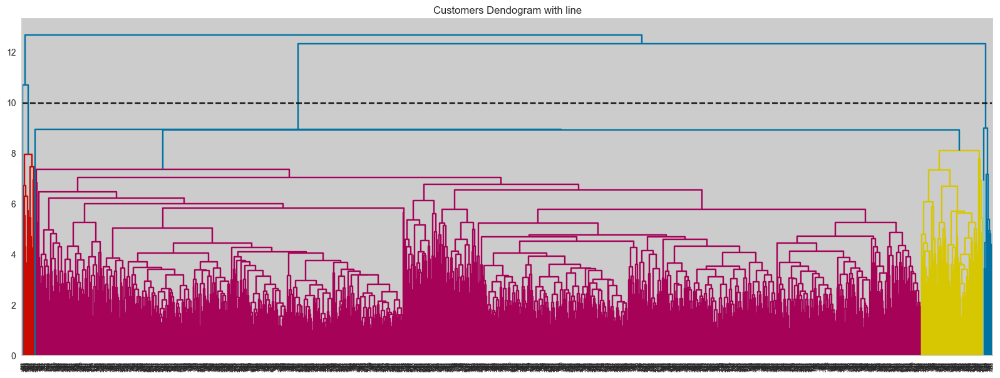

In [163]:
# Dendrograms to calculate the number of clusters

plt.figure(figsize=(20, 7))
plt.title("Customers Dendogram with line")
clusters = shc.linkage(df_pca, 
            method='average', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 10, color = 'k', linestyle = '--')

In [164]:
df_AggClu_avg = df_pca.copy()
AggClu_avg = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='average')
AggClu_avg.fit(df_pca)
df_AggClu_avg["Cluster"] = AggClu_avg.labels_

round(df_AggClu_avg["Cluster"].value_counts(normalize=True)*100,2)

Cluster
2    97.71
1     1.26
0     0.94
3     0.09
Name: proportion, dtype: float64

- It is discarded due to the imbalance of results, however I visualize the result for K4.

##### Visualization **k = 4**

In [166]:
model = AggClu_avg
df_model = df_AggClu_avg

In [167]:
# Define the number of clusters
num_clusters = len(set(model.labels_))

# Obtain the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Assign colors correctly
colors_mapped = [color_map_normalized[str(label)] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC2"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (

In [169]:
# 'Clusters in 3D with K=4'
df_AggClu_ward_3D = df_pca.iloc[:, :3].copy()
df_AggClu_ward_3D['Cluster'] = model.labels_
df_AggClu_ward_3D['Cluster'] = df_AggClu_ward_3D['Cluster'].astype(str)

# Invert the color assignment order
# color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_AggClu_ward_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'3D Clusters with K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### Distance between cluster: "COMPLETE"

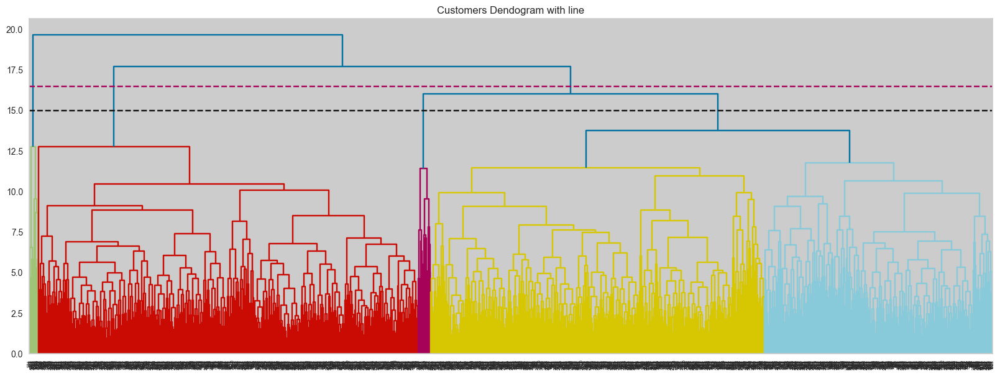

In [170]:
# Dendrograms to calculate the number of clusters


plt.figure(figsize=(20, 7))
plt.title("Customers Dendogram with line")
clusters = shc.linkage(df_pca, 
            method='complete', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 15, color = 'k', linestyle = '--')
plt.axhline(y = 16.5, color = 'm', linestyle = '--')

In [172]:
df_AggClu_com = df_pca.copy()
AggClu_com = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='complete')
AggClu_com.fit(df_pca)
df_AggClu_com["Cluster"] = AggClu_com.labels_

round(df_AggClu_com["Cluster"].value_counts(normalize=True)*100,2)

Cluster
0    58.34
2    39.46
3     1.26
1     0.94
Name: proportion, dtype: float64

- It is discarded due to the imbalance of results, however I visualize the result for K4.

##### Visualization **k = 4**

In [173]:
model = AggClu_com
df_model = df_AggClu_com

In [174]:
# Define the number of clusters
num_clusters = len(set(model.labels_))

# Obtain the color palette in RGB format and create the color_map dictionary
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convert "rgb(r,g,b)" to tuple (r/255, g/255, b/255) for Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Assign colors correctly
colors_mapped = [color_map_normalized[str(label)] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC2"]

print(color_map)  # Dictionary in "rgb(r,g,b)" format
print(color_map_normalized)
print(colors_mapped)  # List of normalized colors for Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (

In [175]:
# 'Clusters in 3D with K=4'
df_AggClu_ward_3D = df_pca.iloc[:, :3].copy()
df_AggClu_ward_3D['Cluster'] = model.labels_
df_AggClu_ward_3D['Cluster'] = df_AggClu_ward_3D['Cluster'].astype(str)

# Invert the color assignment order
# color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Create the 3D figure with corrected colors
fig = px.scatter_3d(df_AggClu_ward_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'3D Clusters with K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})

fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Update legend names correctly
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

## 9. Evaluations

### 9.1. Models to evaluate

In [176]:
# K=3
df_kmeans_K3 = df_backup_V2.copy()
kmeans_k3 = kmeans_per_k[1] # [1] equivalente a K=3
df_kmeans_K3['Cluster'] = kmeans_k3.labels_

df_dbscan_3 = df_backup_V2.copy()
df_dbscan_3['Cluster'] = dbscan_3.labels_

df_agg_K3 = df_backup_V2.copy()
df_agg_K3['Cluster'] = AggClu_ward_k3.labels_

# K=4
df_kmeans_K4 = df_backup_V2.copy()
kmeans_k4 = kmeans_per_k[2] # [2] equivalente a K=4
df_kmeans_K4['Cluster'] = kmeans_k4.labels_

df_dbscan_4 = df_backup_V2.copy()
df_dbscan_4['Cluster'] = dbscan_4.labels_

df_agg_K4  = df_backup_V2.copy()
df_agg_K4['Cluster'] = AggClu_ward_k4.labels_

# K=5
df_dbscan_5 = df_backup_V2.copy()
df_dbscan_5['Cluster'] = dbscan_5.labels_

In [ ]:
# Silhouette score comparative

models = [kmeans_k3, kmeans_k4, AggClu_ward_k3, AggClu_ward_k4, dbscan_3, dbscan_4, dbscan_5]

# Create a list of dictionaries with the results
silhouette_results = []
for model in models:
    # Calculate the silhouette score
    silhouette_score_value = silhouette_score(df_pca, model.labels_)

    # If the model is DBSCAN, subtract 1 from the number of clusters (due to anomalies)
    if isinstance(model, DBSCAN):
        num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)
    else:
        num_clusters = len(set(model.labels_))

    silhouette_results.append({
        "Model": type(model).__name__,
        "K": num_clusters,  # Use the adjusted K value
        "Silhouette Score": round(silhouette_score_value, 3)
    })

# Convert the list into a DataFrame
df_silhouette = pd.DataFrame(silhouette_results).set_index("Model")
df_silhouette

,K,Silhouette Score
Model,,
KMeans,3,0.203
KMeans,4,0.196
AgglomerativeClustering,3,0.170
AgglomerativeClustering,4,0.156
DBSCAN,3,0.085
DBSCAN,4,0.140
DBSCAN,5,0.096


- The most interesting models are KMeans and Agglomerative Clustering. DBSCAN could be discarded (both due to its low silhouette score and the way it distributed its clusters)

In [179]:
#features by categories and type
print(people)
print(products)
print(place)
print(promotion)
print("")
people_num = [item for item in people if item not in features_cat_list]
print(features_cat_list)
print(people_num)

['Age', 'Education', 'Income', 'Status', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Complain']
['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Total_spent', 'Avg_buy']
['Web', 'Catalog', 'Store', 'WebVisits']
['Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Total_cmp']

['Education', 'Status']
['Age', 'Income', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Complain']


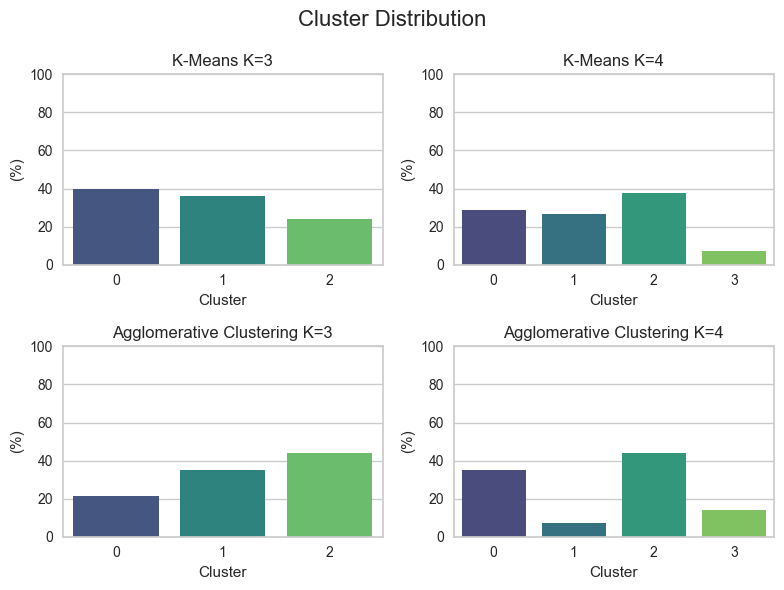

In [181]:
# CLUSTER DISTRIBUTION BY MODELS
models = [
    (df_kmeans_K3, "K-Means K=3"), 
    (df_kmeans_K4, "K-Means K=4"),
    (df_agg_K3, "Agglomerative Clustering K=3"),
    (df_agg_K4, "Agglomerative Clustering K=4")
]

# Configure the figure with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(8, 6))

# Visualize in subplots
for i, (model_data, model_name) in enumerate(models):
    ax = axes[i//2, i%2]  # Select the corresponding subplot
    sns.countplot(data=model_data, x='Cluster', ax=ax, palette="viridis", stat="percent")  # Assumes 'Cluster' column contains labels
    ax.set_title(f'{model_name}')
    ax.set_xlabel('Cluster')
    ax.set_ylabel('(%)')
    ax.set_ylim(0, 100) 

# Adjust layout to prevent title overlap
plt.suptitle("Cluster Distribution", fontsize=16)
plt.tight_layout()
plt.show()


### 9.2. Correlation

#### K = 3

##### Kmeans

In [187]:
corr_kmeans_K3 = df_kmeans_K3.corr(numeric_only= True)
corr_kmeans_K3["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Total_spent    0.855039
Income         0.800507
Catalog        0.742069
Meat           0.741309
Wines          0.717163
Store          0.671072
Fish           0.621962
Fruits         0.576401
Sweets         0.568290
Avg_buy        0.550063
Web            0.509122
Gold           0.494810
Total_cmp      0.407346
Cmp5           0.406484
Cmp1           0.344269
Response       0.252064
Cmp4           0.226274
Age            0.137000
Cmp2           0.127612
Client_days    0.093450
Cmp3           0.033806
Recency        0.018783
Complain      -0.039923
Deals         -0.069688
Fam_size      -0.471665
Children      -0.542351
WebVisits     -0.580933
Name: Cluster, dtype: float64

##### Aglomerative

In [188]:
corr_agg_K3 = df_agg_K3.corr(numeric_only= True)
corr_agg_K3["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Deals          0.421301
Children       0.386900
WebVisits      0.339786
Fam_size       0.334061
Web            0.186605
Client_days    0.117635
Age            0.084822
Cmp3           0.032437
Recency        0.021767
Cmp4           0.016931
Store         -0.016022
Complain      -0.028081
Gold          -0.050735
Wines         -0.150289
Avg_buy       -0.173549
Cmp2          -0.184230
Income        -0.199532
Catalog       -0.232030
Fruits        -0.236509
Response      -0.250424
Sweets        -0.251720
Fish          -0.285756
Total_spent   -0.295339
Cmp5          -0.310105
Total_cmp     -0.312247
Meat          -0.395200
Cmp1          -0.408249
Name: Cluster, dtype: float64

#### K = 4

##### Kmeans

In [189]:
corr_kmeans_K4 = df_kmeans_K4.corr(numeric_only= True)
corr_kmeans_K4["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Cmp5           0.364293
Total_cmp      0.317737
Cmp1           0.288038
Response       0.177039
Cmp2           0.173032
Cmp4           0.085062
Cmp3           0.047623
Complain       0.030061
Meat           0.001137
Sweets        -0.018121
Fish          -0.025042
Recency       -0.027297
Fruits        -0.038753
WebVisits     -0.056088
Avg_buy       -0.056472
Total_spent   -0.091868
Catalog       -0.124085
Wines         -0.125622
Fam_size      -0.132790
Children      -0.134684
Client_days   -0.159967
Income        -0.171630
Gold          -0.185052
Age           -0.211016
Store         -0.320070
Web           -0.432011
Deals         -0.475893
Name: Cluster, dtype: float64

##### Aglomerative

In [190]:
corr_agg_K4 = df_agg_K4.corr(numeric_only= True)
corr_agg_K4["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Income         0.650189
Total_spent    0.627175
Store          0.610151
Catalog        0.559470
Wines          0.526996
Meat           0.525819
Web            0.516686
Fish           0.450947
Fruits         0.446173
Sweets         0.423548
Gold           0.416982
Avg_buy        0.404674
Age            0.160157
Client_days    0.146256
Cmp5           0.133882
Deals          0.110106
Cmp4           0.073541
Response       0.038808
Recency        0.030347
Total_cmp      0.028575
Cmp2          -0.039541
Cmp3          -0.063854
Cmp1          -0.086976
Complain      -0.121399
Fam_size      -0.320352
Children      -0.387579
WebVisits     -0.426387
Name: Cluster, dtype: float64

### 9.3. Visualization features

#### K = 3

##### Kmeans

In [191]:
data = df_kmeans_K3

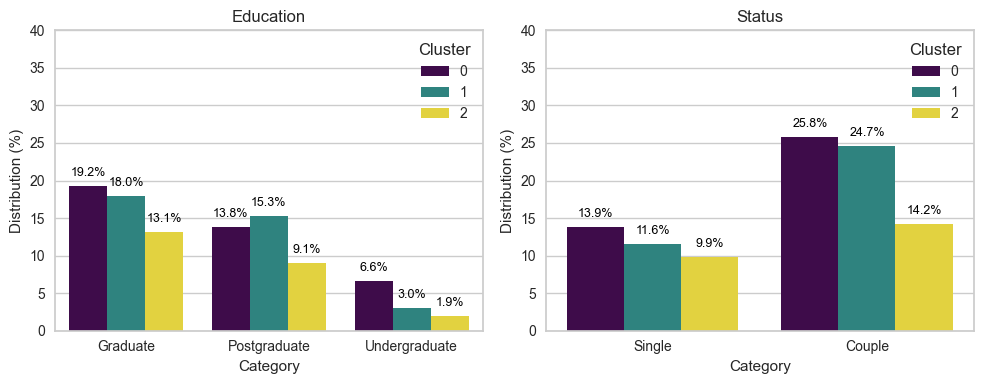

In [192]:
# Categorical Variables

# Configure the figure with 1 row and 2 columns (since there are only 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualize in subplots
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Select the correct subplot
    
    # Plot countplot with percentage
    sns.countplot(data=data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Category')
    ax.set_ylabel('Distribution (%)')
    ax.set_ylim(0, 40)  

    # Display values on the bars
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Avoid labels on bars with no data
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

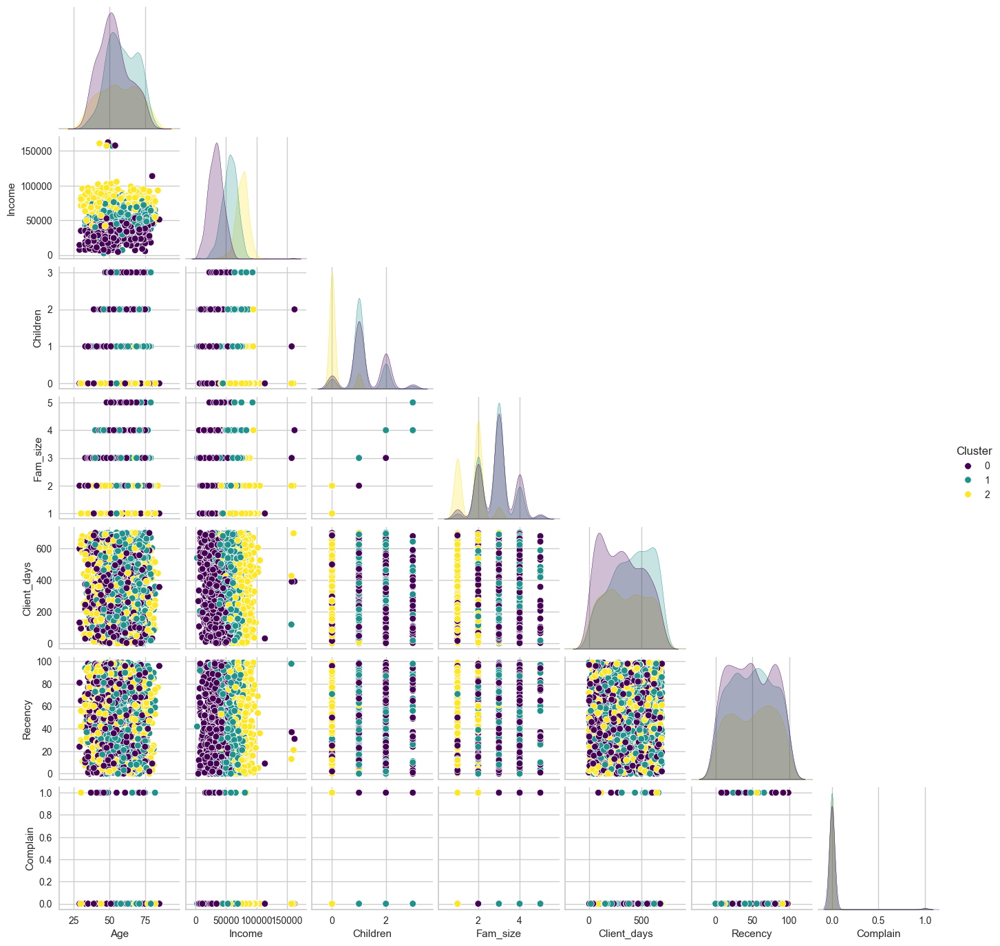

In [193]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

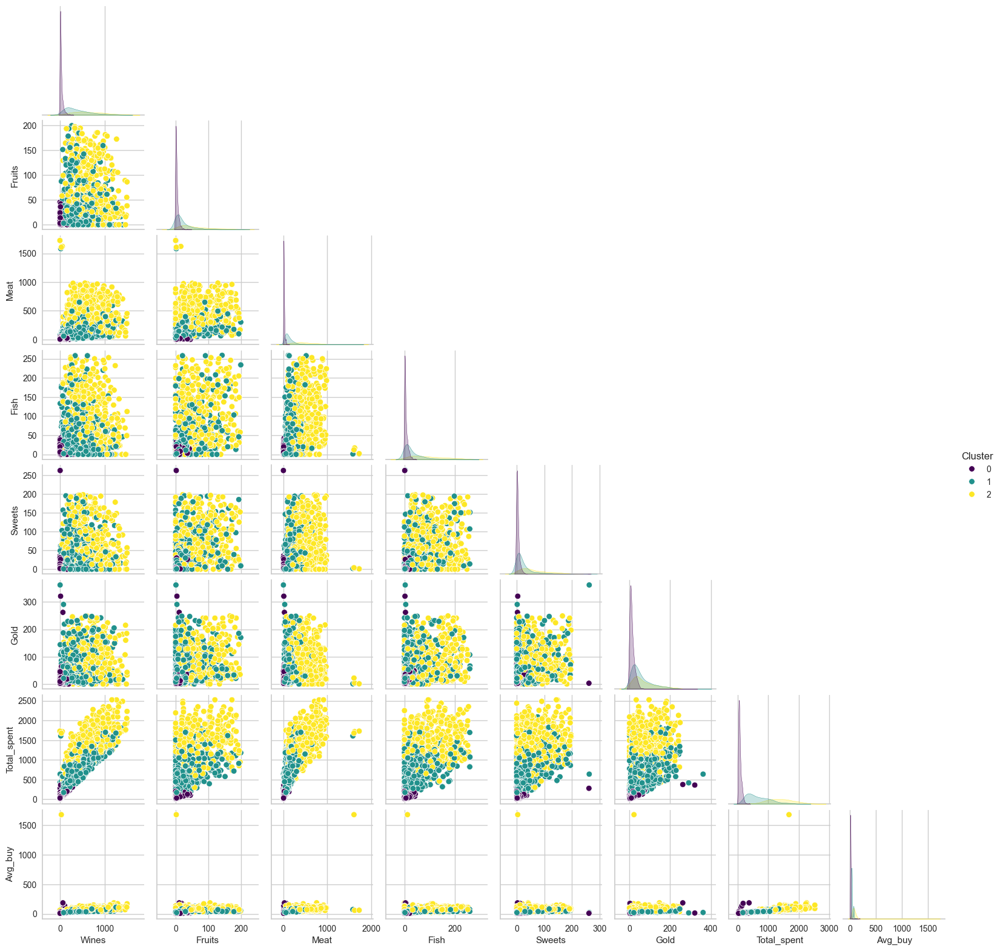

In [194]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

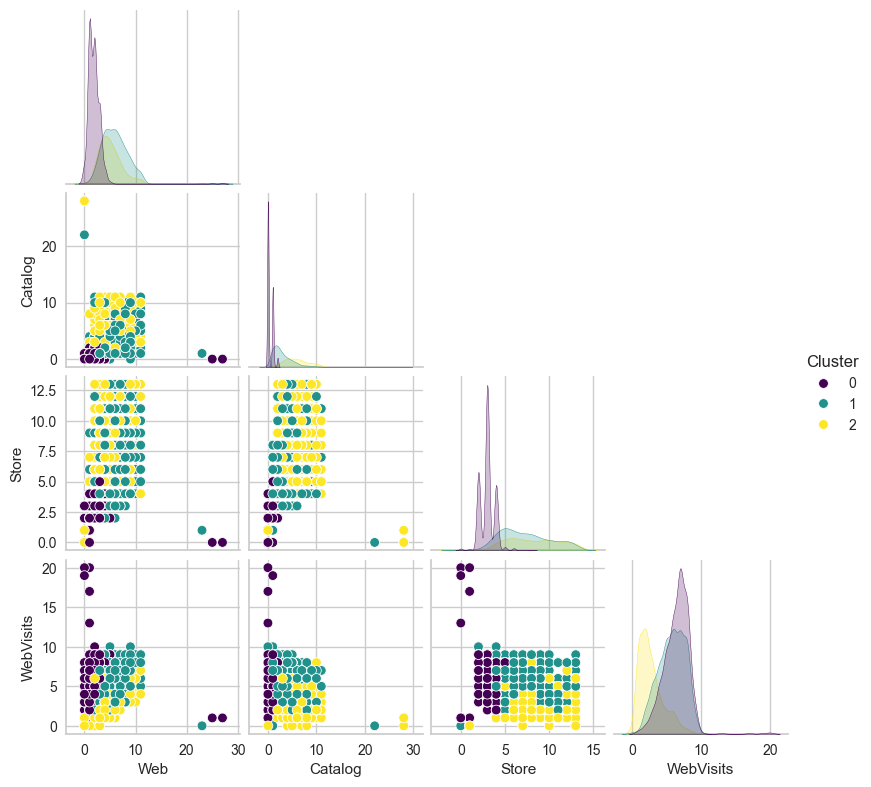

In [195]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

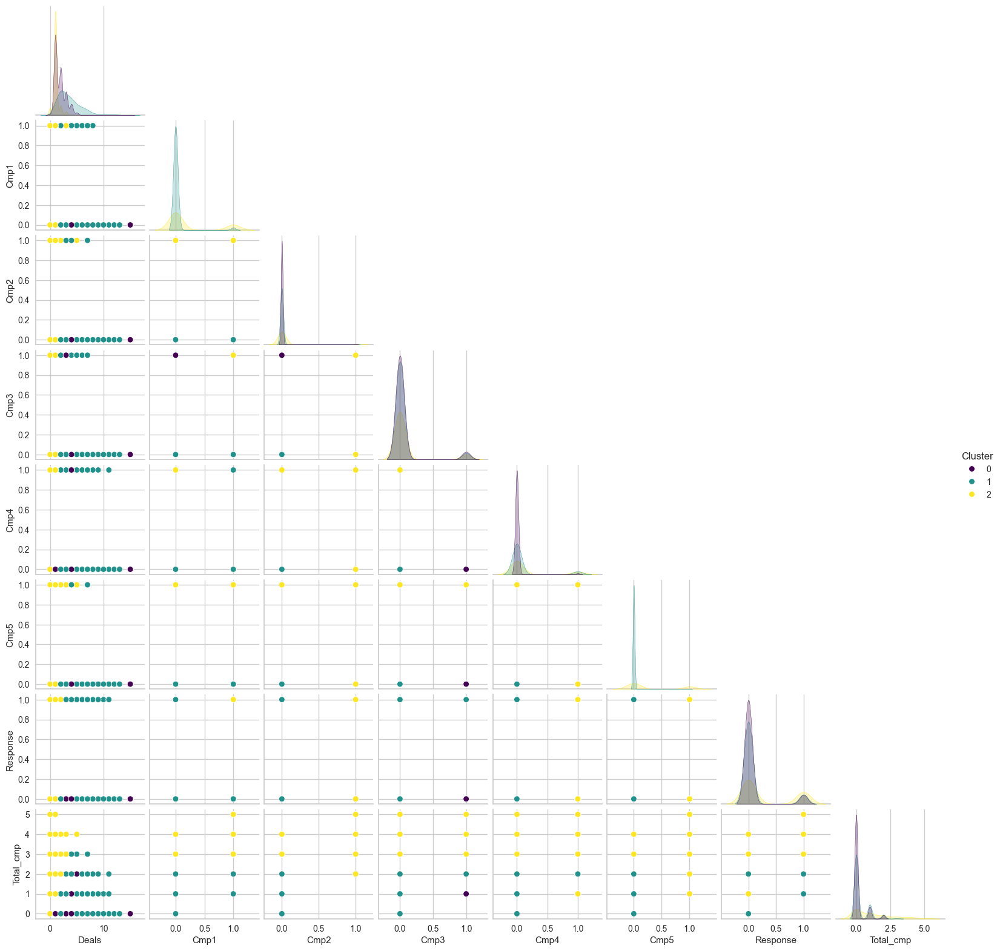

In [196]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

##### Aglomerative

In [197]:
data = df_agg_K3

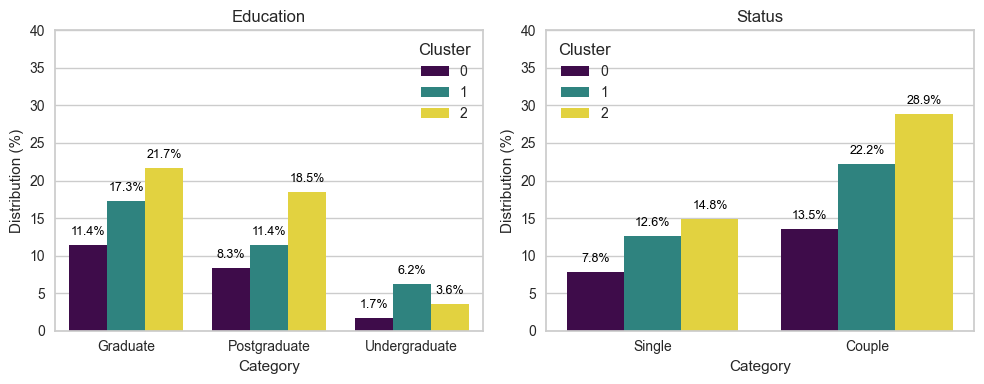

In [198]:
# Categorical Variables
# Configure the figure with 1 row and 2 columns (since there are only 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualize in subplots
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Select the correct subplot
    
    # Plot countplot with percentage
    sns.countplot(data=data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Category')
    ax.set_ylabel('Distribution (%)')
    ax.set_ylim(0, 40)  

    # Display values on the bars
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Avoid labels on bars with no data
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()


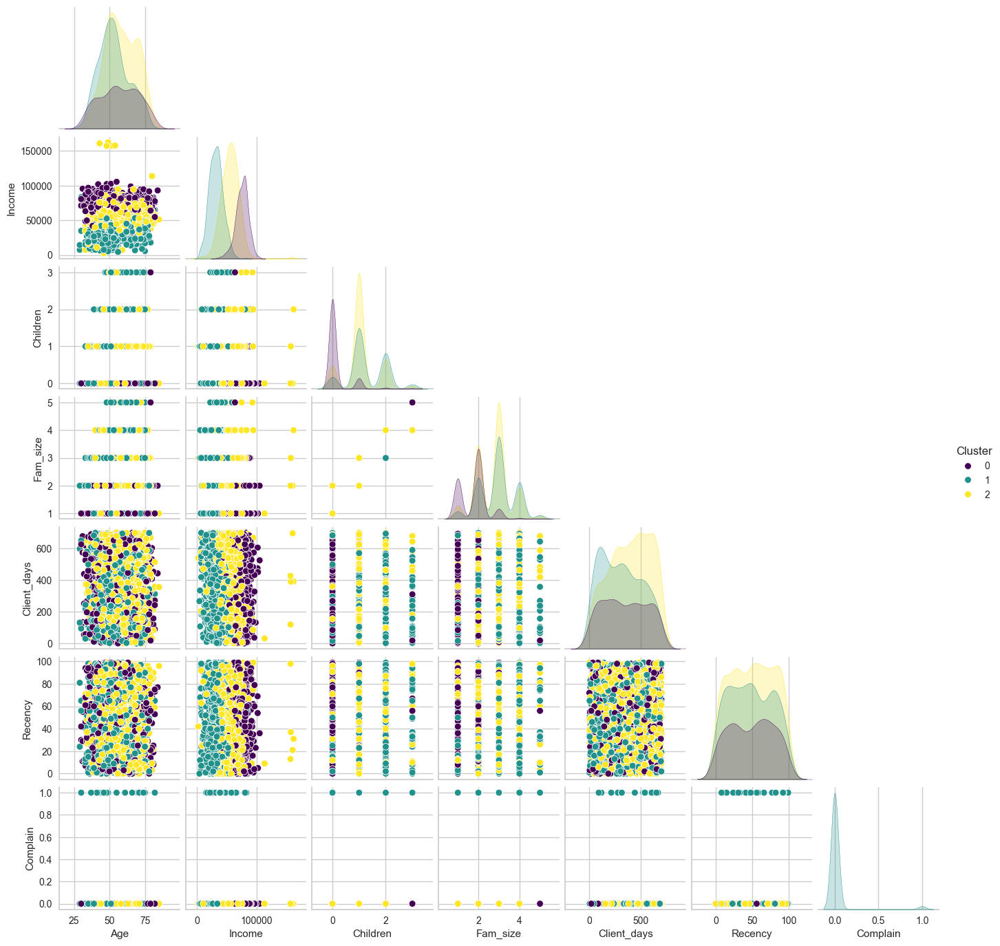

In [199]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

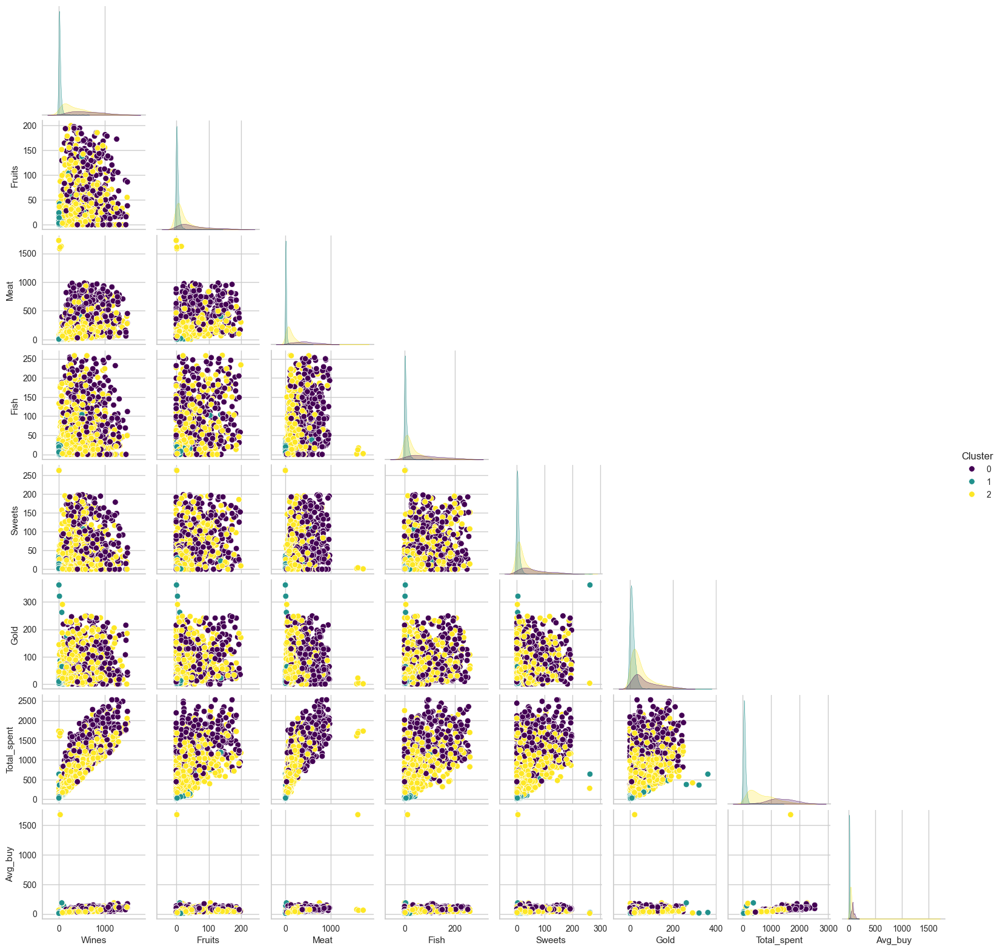

In [200]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

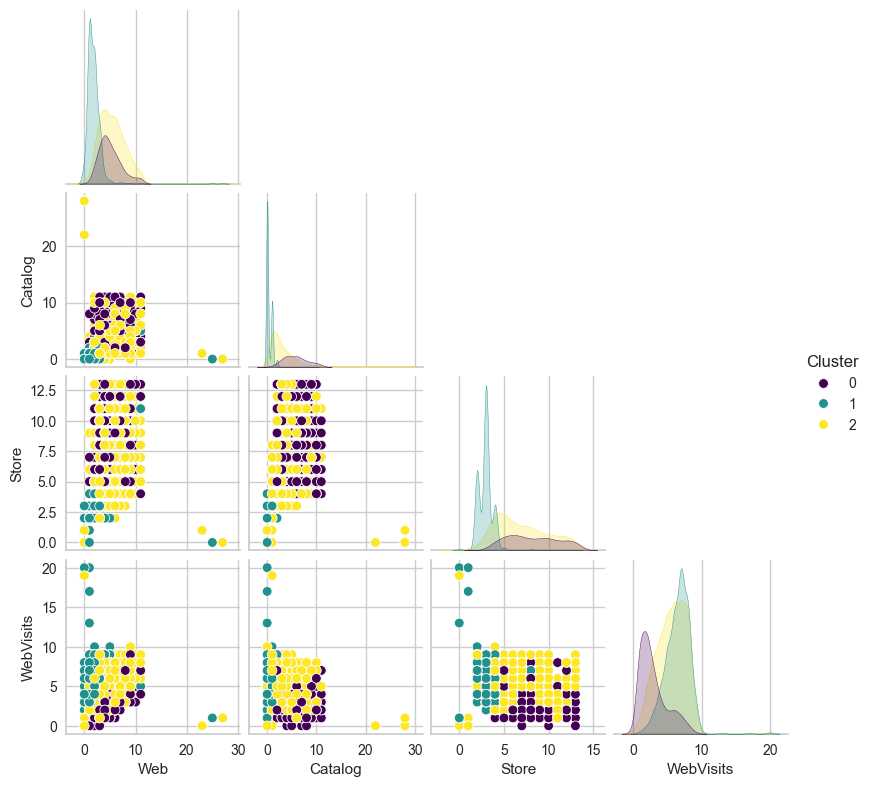

In [201]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

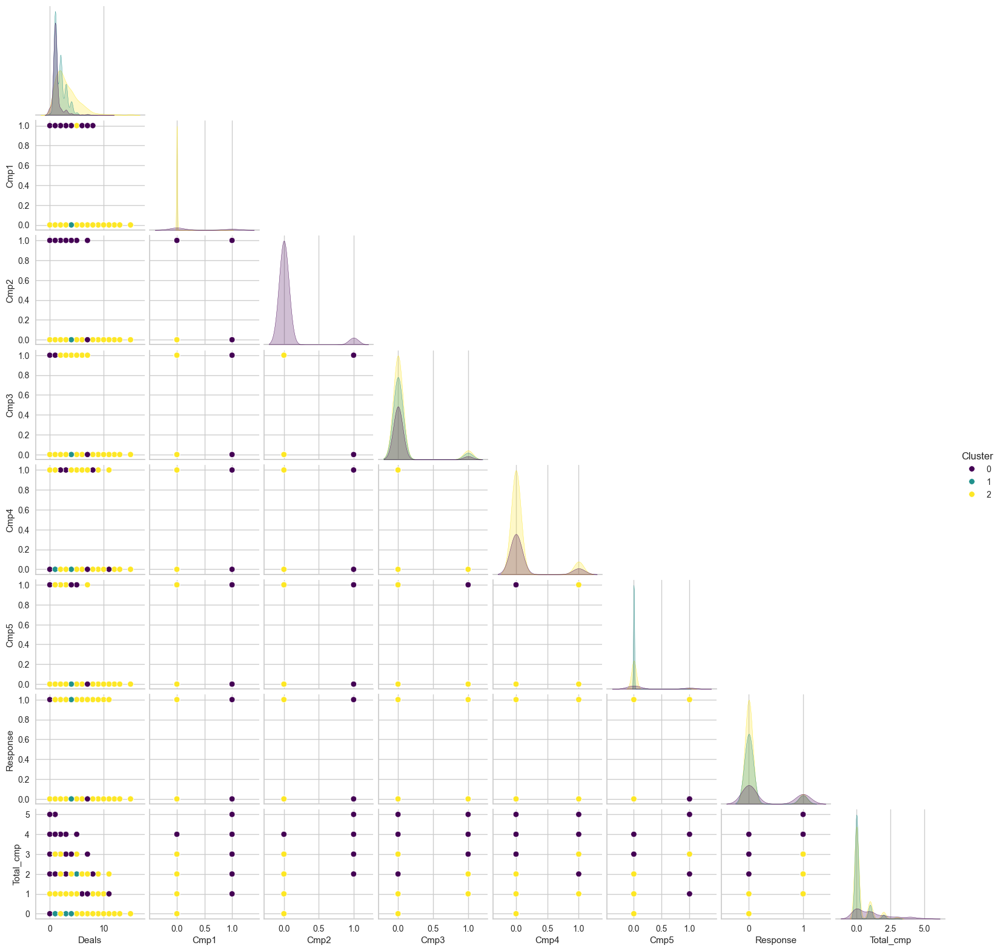

In [202]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

#### K = 4

##### Kmeans

In [203]:
data = df_kmeans_K4

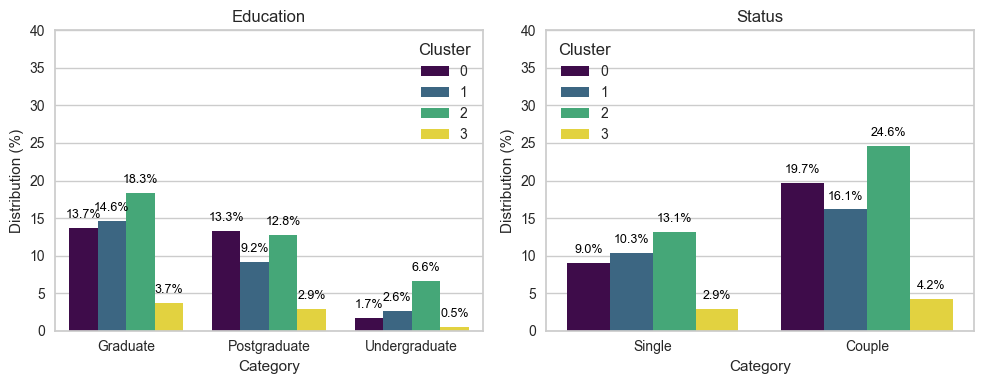

In [204]:
# Categorical Variables
# Configure the figure with 1 row and 2 columns (since there are only 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualize in subplots
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Select the correct subplot
    
    # Plot countplot with percentage
    sns.countplot(data=data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Category')
    ax.set_ylabel('Distribution (%)')
    ax.set_ylim(0, 40)  

    # Display values on the bars
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Avoid labels on bars with no data
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

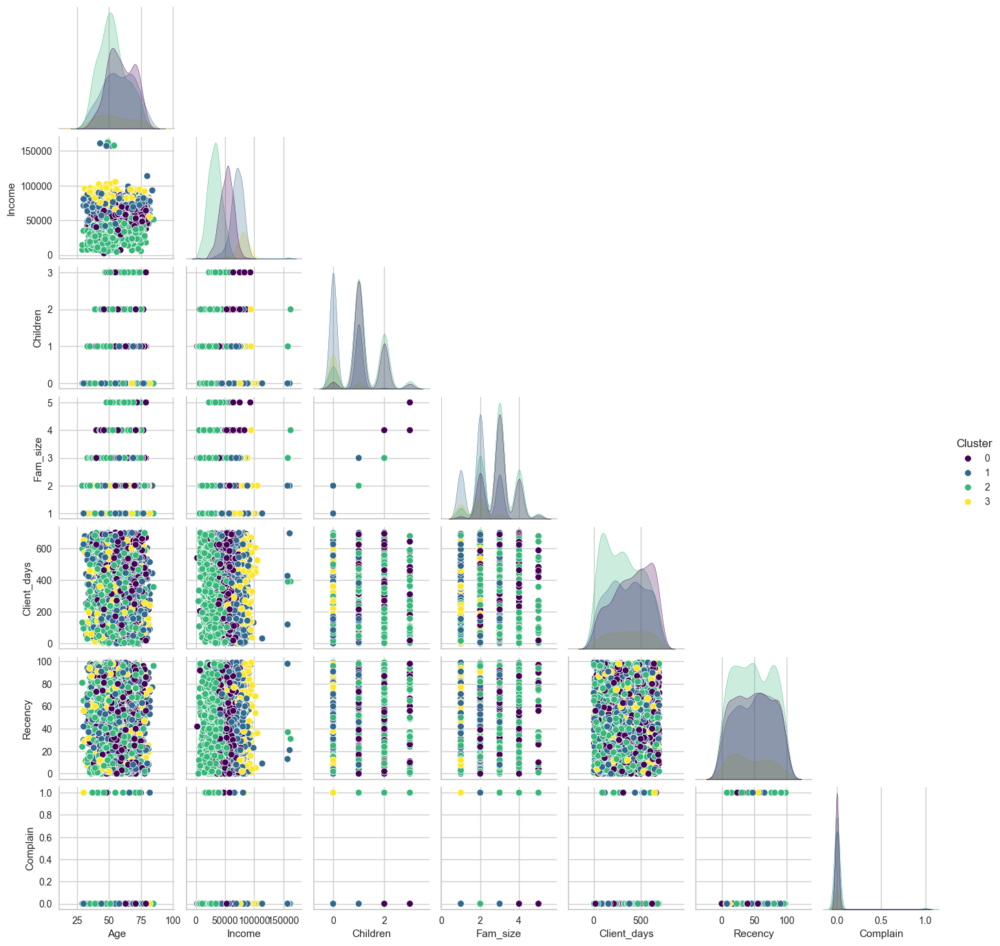

In [205]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

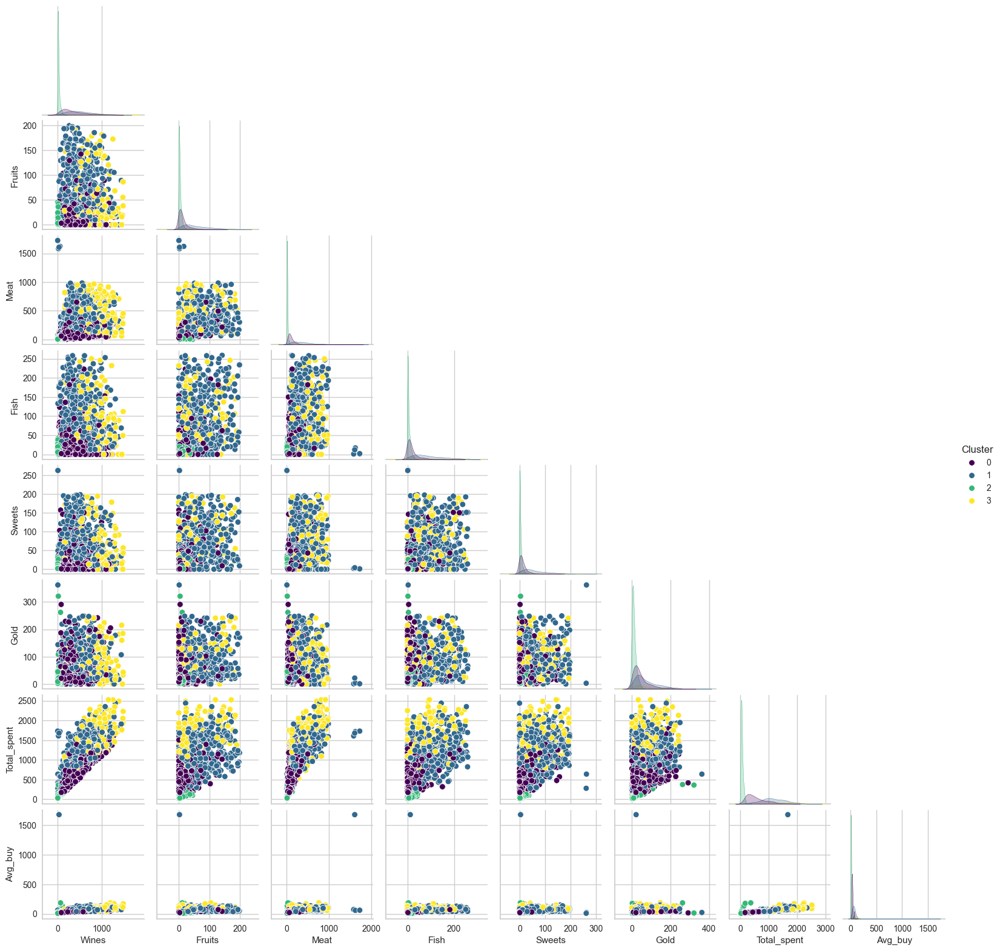

In [206]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

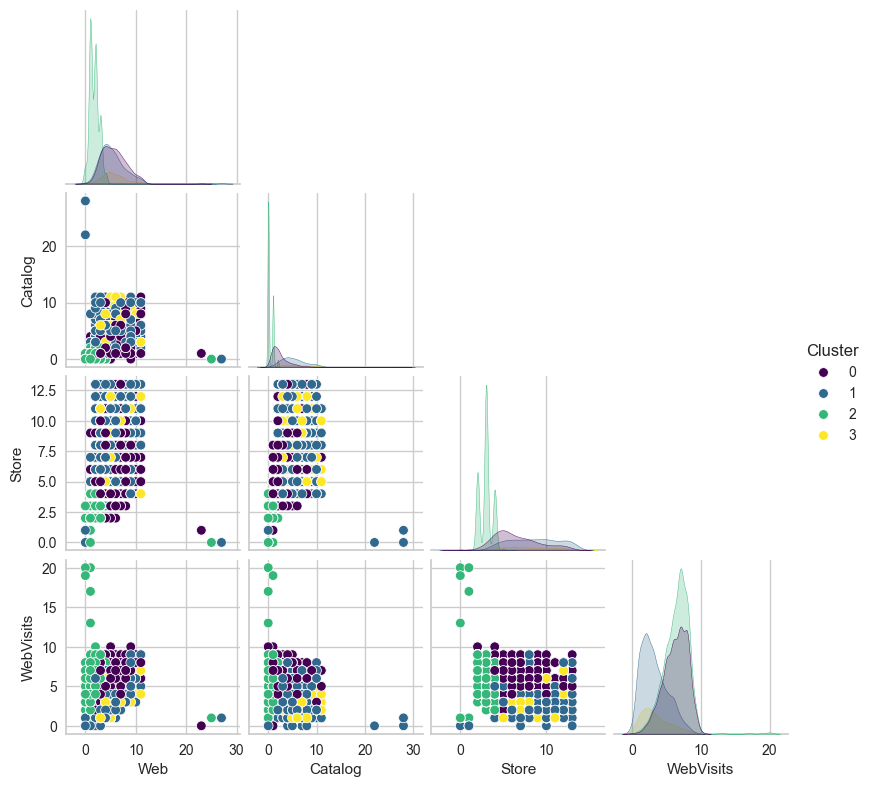

In [207]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

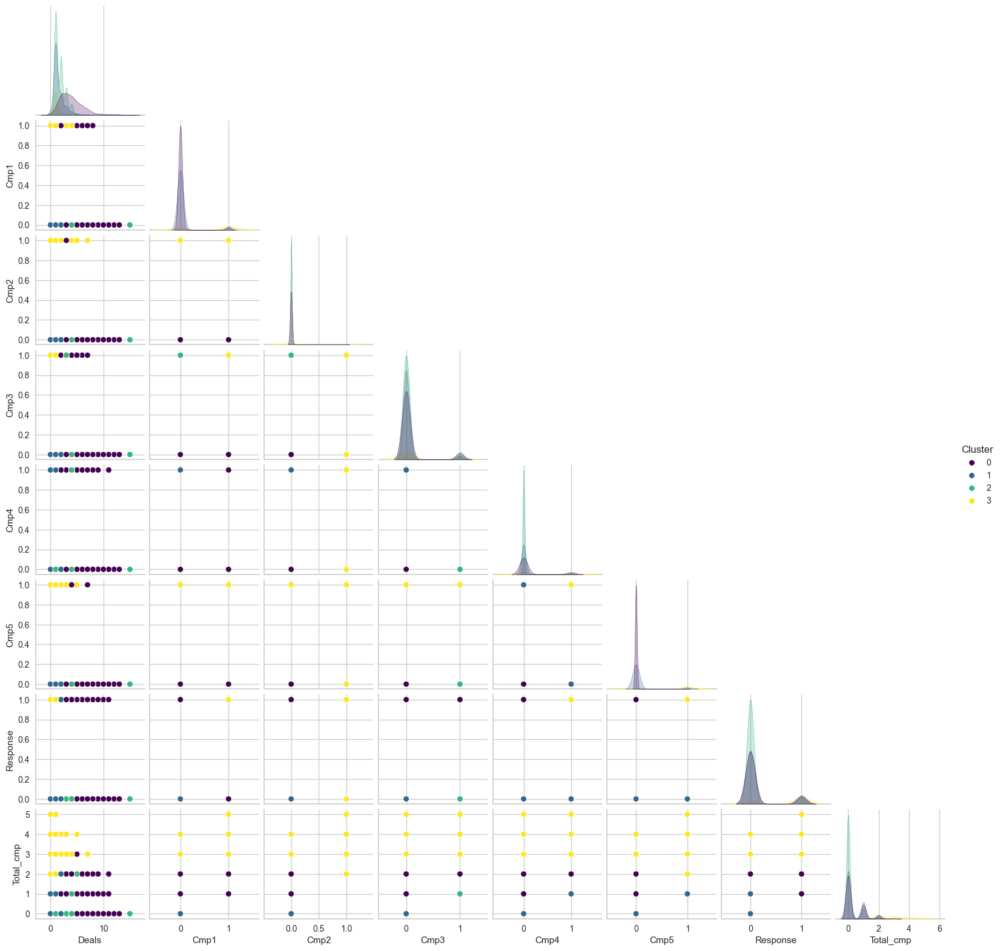

In [208]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

##### Aglomerative

In [209]:
data = df_agg_K4

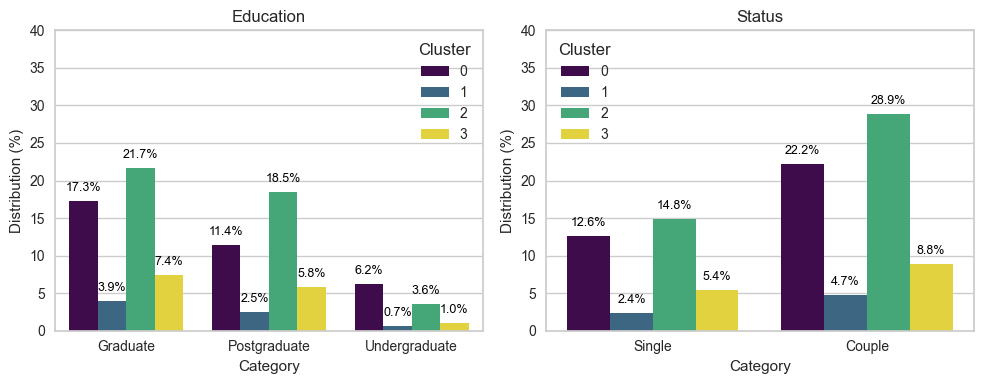

In [210]:
# Categorical Variables
# Configure the figure with 1 row and 2 columns (since there are only 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualize in subplots
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Select the correct subplot
    
    # Plot countplot with percentage
    sns.countplot(data=data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Category')
    ax.set_ylabel('Distribution (%)')
    ax.set_ylim(0, 40)  

    # Display values on the bars
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Avoid labels on bars with no data
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

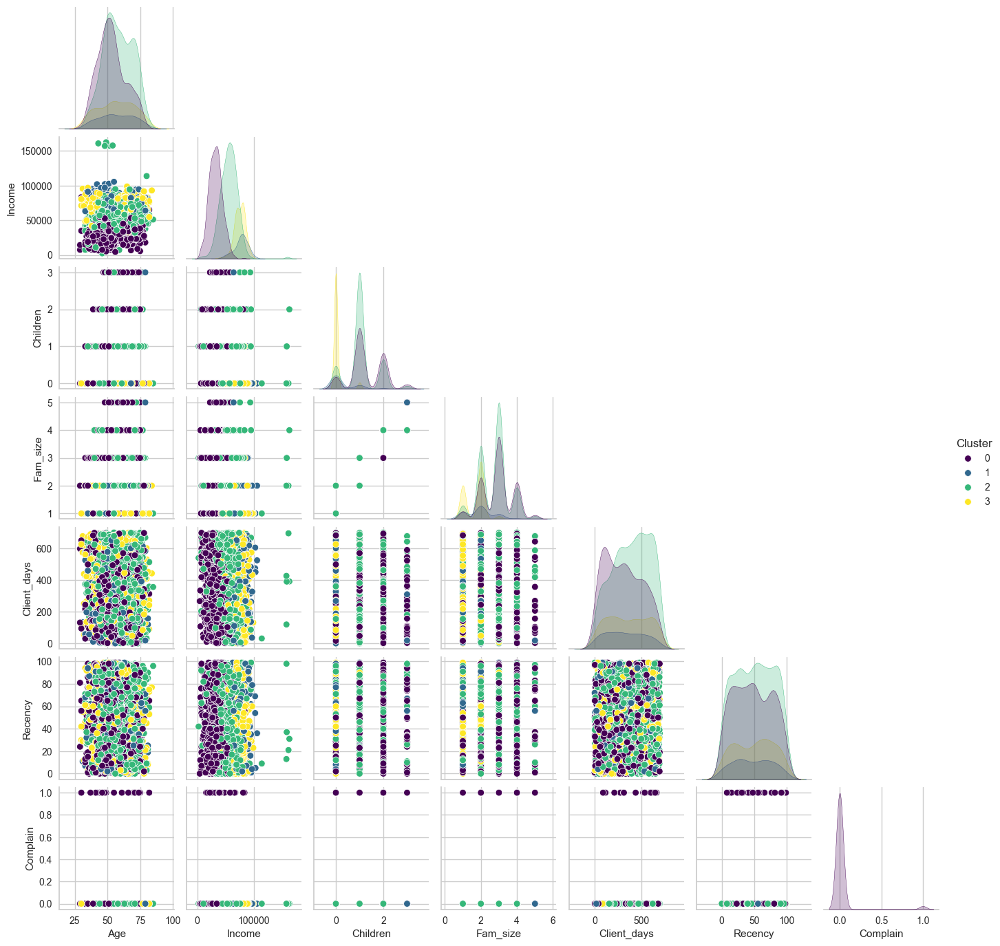

In [211]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

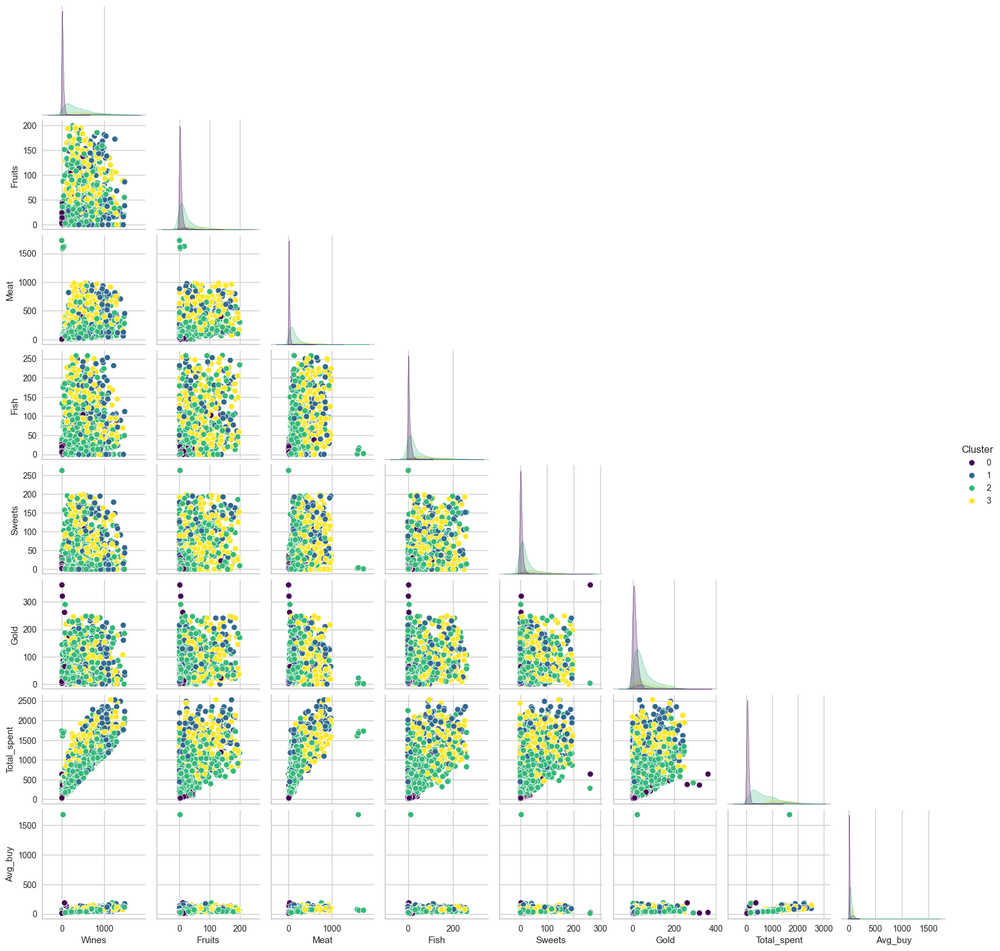

In [212]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

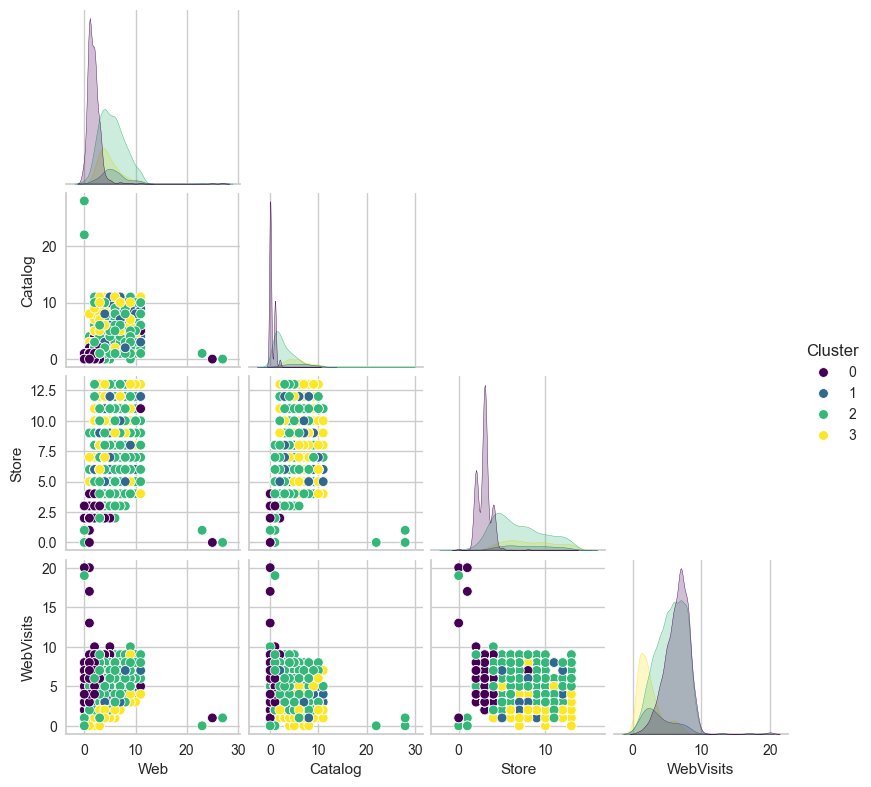

In [213]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

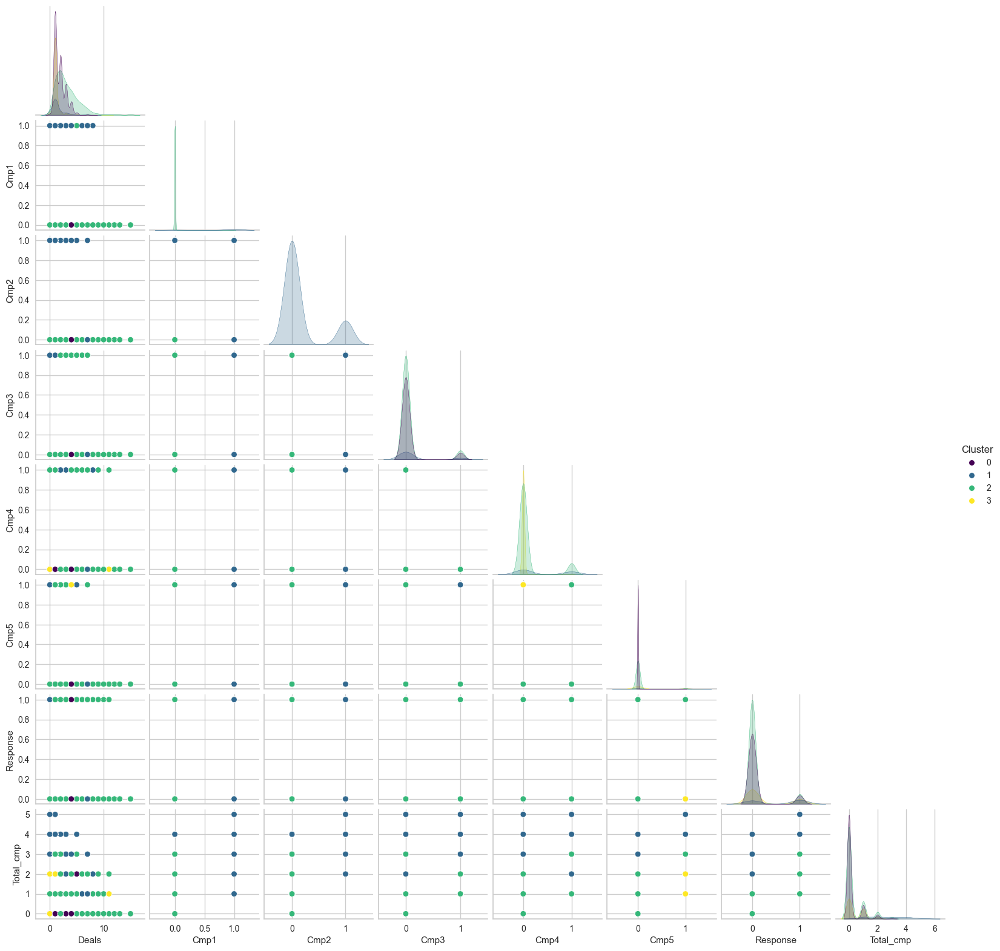

In [214]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

### 9.4. Final conclusion and Model Selection

After evaluating the four clustering models, all of them successfully segmented the customer base. However, the most balanced and effective model is **K-Means with K=3**, selected for the following reasons:

- Higher Silhouette Score – Indicates well-separated and compact clusters.
- Visually Well-Defined Clusters – Clear separation in PCA visualizations.
- Meaningful Segmentation – Differentiated customer groups based on both numerical and categorical variables.
- Easier Application to New Data – Compared to Agglomerative Clustering, K-Means is more scalable for future datasets.
- Lower Risk of Over-Segmentation – K=3 strikes a balance, avoiding excessive fragmentation seen in K=4.

This model will allow for strategic customer segmentation, supporting targeted marketing, pricing optimization, and customer retention strategies.

## 10. Customer segmentation (profiles)

- To define each cluster, it will be done through the visualization of features

### 10.1. Searching for patterns

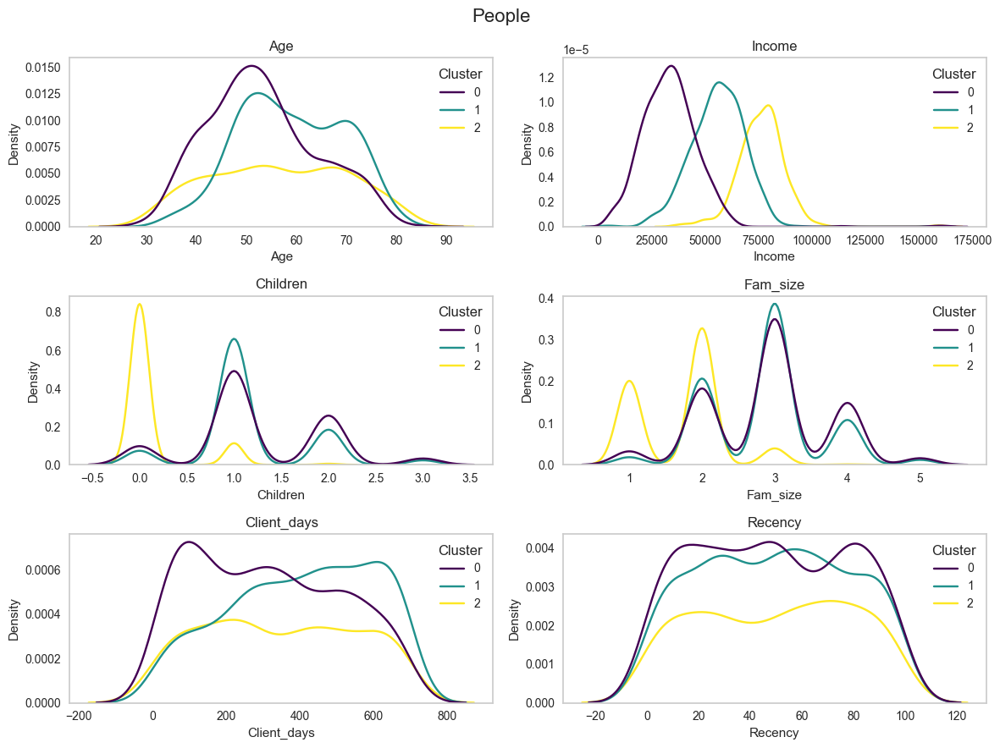

In [ ]:
# PEOPLE NUMERIC CATEGORY
features = numeric_people
palette = "viridis"

# Dynamically define the number of rows based on the number of features
n_features = len(features)
n_cols = 2  # Fixed number of columns
n_rows = -(-n_features // n_cols)  # Round up division

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Remove empty axes if the number of features is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("People", fontsize=16)
plt.tight_layout()
plt.show()

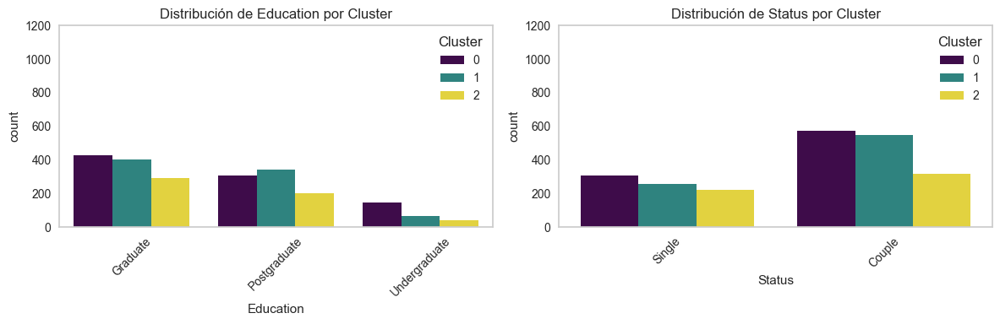

In [216]:
# PEOPLE CATEGORIC CATEGORY
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))  

for i, feature in enumerate(features_cat_list):
    sns.countplot(data=df_kmeans_K3, x=feature, hue="Cluster", palette=palette, ax=axes[i])
    axes[i].set_title(f'Distribución de {feature} por Cluster')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)
    axes[i].grid(False)
    axes[i].set_ylim(0, 1200)

plt.tight_layout()
plt.show()

**CLUSTER 0**
- AGE:          40-60
- INCOME:       low 
- CHILDREN:     1
- FAM SIZE:     3
- CLIENT_DAYS:  100
- RECENCY:      -
- EDUCATION:    graduated (undergraduated)
- STATUS:       couple

**CLUSTER 1**
- AGE:          50-75
- INCOME:       medium
- CHILDREN:     1
- FAM SIZE:     3
- CLIENT_DAYS:  600
- RECENCY:      -
- EDUCATION:    graduated (postgraduated)
- STATUS:       couple

**CLUSTER 2**
- AGE:          35-75
- INCOME:       high
- CHILDREN:     0
- FAM SIZE:     2
- CLIENT_DAYS:  200-600
- RECENCY:      -
- EDUCATION:    graduated
- STATUS:       couple(single)

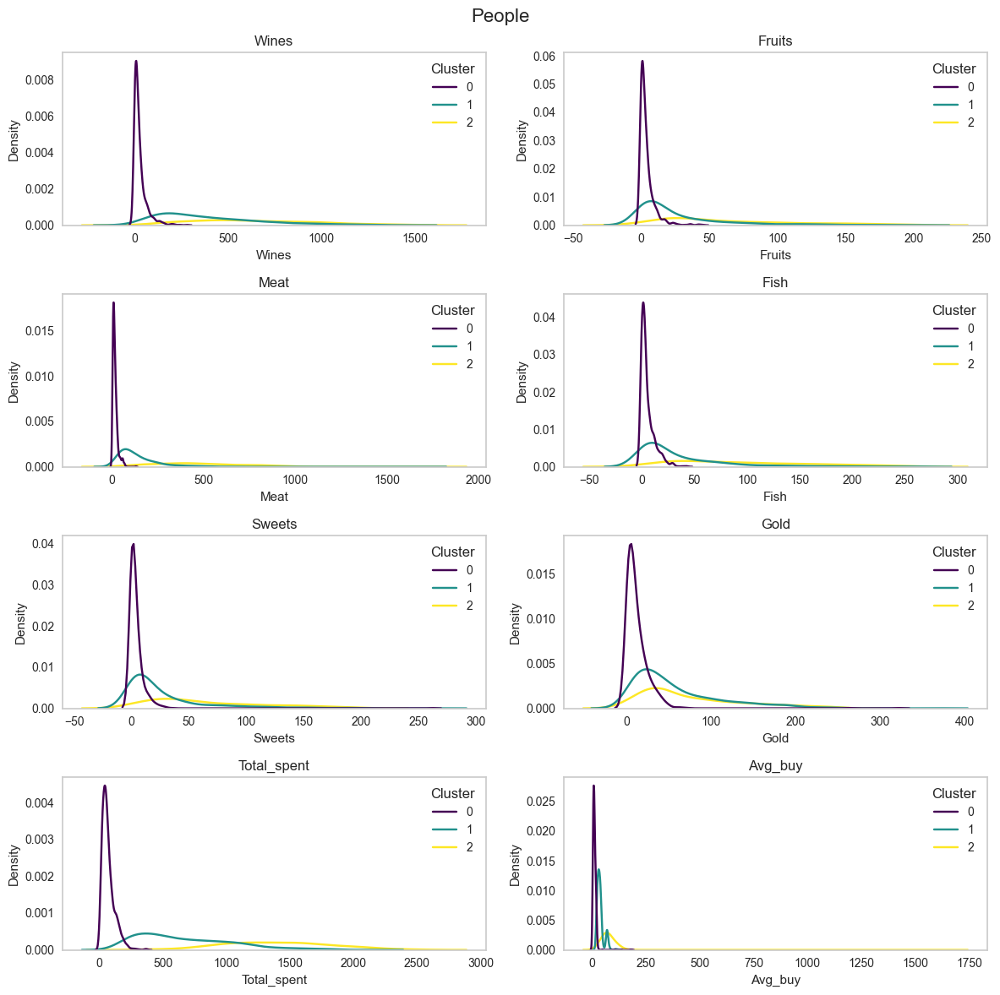

In [217]:
# PRODUCTS NUMERIC CATEGORY
features = products
palette = "viridis"

# Dynamically define the number of rows based on the number of features
n_features = len(features)
n_cols = 2  # Fixed number of columns
n_rows = -(-n_features // n_cols)  # Round up division

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Remove empty axes if the number of features is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("People", fontsize=16)
plt.tight_layout()
plt.show()

**CLUSTER 0**
- INTEREST:     -
- TOTAL SPENT:  low
- AVG_BUY:      10

**CLUSTER 1**
- INTEREST:     -
- TOTAL SPENT:  medium
- AVG_BUY:      50

**CLUSTER 2**
- INTEREST:     wines, meat, fish
- TOTAL SPENT:  high
- AVG_BUY:      100

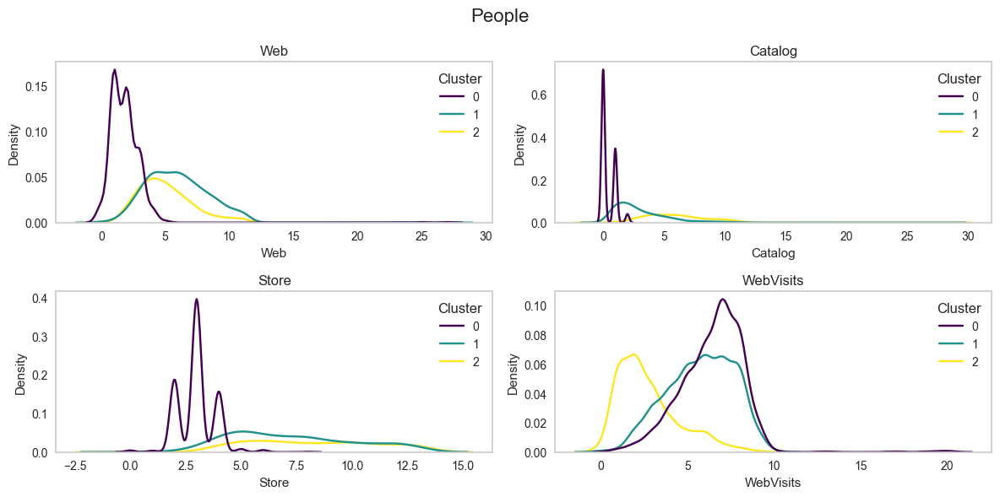

In [218]:
# PLACE CATEGORY
features = place
palette = "viridis"

# Dynamically define the number of rows based on the number of features
n_features = len(features)
n_cols = 2  # Fixed number of columns
n_rows = -(-n_features // n_cols)  # Round up division

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Remove empty axes if the number of features is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("People", fontsize=16)
plt.tight_layout()
plt.show()

**CLUSTER 0**
- WEB:          few (0-5)
- CATALOG:      few (0-3)
- STORE:        few (3)
- WEB VISITS:   high (8)

**CLUSTER 1**
- WEB:          high (4-6)
- CATALOG:      medium (2-3)
- STORE:        medium (5-10)
- WEB VISITS:   high (5-7)

**CLUSTER 2**
- WEB:          medium (4)
- CATALOG:      high (5)
- STORE:        high (6-12)
- WEB VISITS:   low (3)

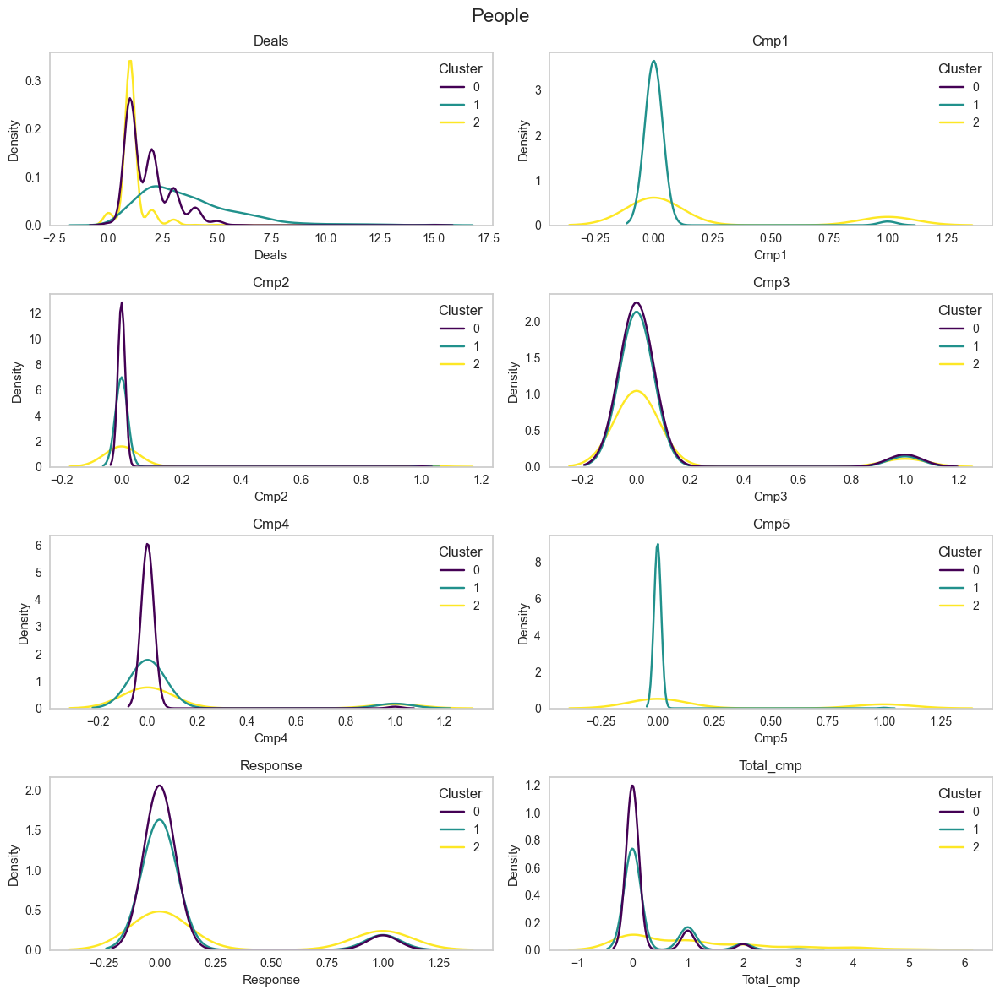

In [219]:
# PROMOTION NUMERIC CATEGORY
features = promotion
palette = "viridis"

# Dynamically define the number of rows based on the number of features
n_features = len(features)
n_cols = 2  # Fixed number of columns
n_rows = -(-n_features // n_cols)  # Round up division

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Remove empty axes if the number of features is odd
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("People", fontsize=16)
plt.tight_layout()
plt.show()

**CLUSTER 0**
- DEALS:        low-medium
- CMP1:         -
- CMP2:         0
- CMP3:         acceppted
- CMP4:         0
- CMP5:         -
- RESPONSE:     worst 
- TOTAL_CMP:    worst

**CLUSTER 1**
- DEALS:        high
- CMP1:         -
- CMP2:         0
- CMP3:         acceppted
- CMP4:         good
- CMP5:         0
- RESPONSE:     medium 
- TOTAL_CMP:    medium

**CLUSTER 2**
- DEALS:        low
- CMP1:         good
- CMP2:         0
- CMP3:         Good
- CMP4:         Good
- CMP5:         Good
- RESPONSE:     Good response, better than other 
- TOTAL_CMP:    Good

### 10.2. Profiles

#### Highlights

- **CLUSTER 0**
    - Low spending
    - Lower income
    - Larger family
    - Middle aged (40-60)
    - New client
    - Many visits to the website, but not to buy
    - Doesn't respond to Marketing
    - Slight interest in deals

- **CLUSTER 1**
    - Moderate spending
    - Medium income
    - old aged (50-75)
    - old client
    - Web shopping preference
    - Slight Response to Marketing
    - High interest in deals

- **CLUSTER 2**
    - High spending
    - Higher income
    - Small family
    - Interest to wines, meat and fish product
    - Catalog and store purchase preference 
    - Good response to marketing
    - Low interest in deals

### Profiling conclusion

#### **Cluster 0: *Digital Curious*: curious visitors, occasional buyers**
- ##### Demographic Profile: 
    - Middle-aged adults (40-60 years), with low incomes and small families (3 people). 
    - Relatively new customers (100 days on average), most with university degrees but no postgraduate studies.

- ##### Purchase Pattern: 
    - Spend little and make small purchases (average of 10 per purchase). 
    - Show no interest in specific products, and their purchases are sporadic. 
    - Prefer browsing the web, but without buying (many visits, but few online purchases).

- ##### Trends and Opportunities:
    - Difficult to retain customers who do not respond well to marketing.
    - They seem more interested in researching products than purchasing them.
    - May respond better to campaigns with discounts or strategies that encourage their first purchase.
    - Impulse buying or ease of payment could motivate them.

*They need incentives to make their first purchase. Strategies like initial discounts or flash promotions may work.*



#### **Cluster 1: *Deal Hunters*: Loyal online buyers sensitive to discounts**
- ##### Demographic Profile: 
    - Older individuals (50-75 years), with medium incomes. 
    - Long-term customers (600 days on average) with small families (3 people). 
    - Have higher education and tend to be in couples.

- ##### Purchase Pattern: 
    - Spend moderately, with an average ticket of 50 per purchase. Show no interest in specific products but prefer buying online and responding to promotions. Their purchase frequency is medium, and they use different channels (web, catalog, and store).

- ##### Trends and Opportunities:
    - Loyal customers but sensitive to offers and discounts.
    - Ease of online purchasing is key for them.
    - They may respond well to loyalty programs with progressive rewards.
    - Campaigns combining promotions with free shipping or exclusive discounts for repeat customers could be effective.

*They are loyal customers and frequent online buyers. They can be retained with progressive discount programs or exclusive benefits.*



- #### **Cluster 2: *Exclusive Elite*: Exclusive, selective, high-value buyers**
- ##### Demographic Profile: 
    - Adults between 35 and 75 years with high incomes. Have very small families (2 people) or live alone. Customers with a history of 200 to 600 days.

- ##### Purchase Pattern: 
    - Spend a lot and have a high average ticket (100 per purchase). Prefer premium products like wines, meats, and fish. Purchase more through catalogs and physical stores, with few web visits.

- ##### Trends and Opportunities:
    - Valuable customers with defined purchasing habits.
    - Value quality and exclusivity more than discounts.
    - Personalized sales strategies and VIP experiences can attract them.
    - They may respond well to product recommendations based on previous purchases.

*They are high-value customers looking for quality and exclusivity. The key is to offer premium experiences and personalized recommendations.*


## 11. Model save

In [222]:
# Model save

# Dictionary with models
models_to_save = {
    'kmeans_k3': kmeans_k3,
    'kmeans_k4': kmeans_k4,
    'agg_k3': AggClu_ward_k3,
    'agg_k4': AggClu_ward_k4,
    'dbscan_3': dbscan_3,
    'dbscan_4': dbscan_4,
    'dbscan_5': dbscan_5
}

# Save each model with its respective name
for model_name, model in models_to_save.items():
    model_filename = f'../models/{model_name}.pkl'  # File name based on the model name
    with open(model_filename, 'wb') as f:
        pickle.dump(model, f)
    print(f"{model_name} successfully saved in {model_filename}!")

kmeans_k3 successfully saved in ../models/kmeans_k3.pkl!
kmeans_k4 successfully saved in ../models/kmeans_k4.pkl!
agg_k3 successfully saved in ../models/agg_k3.pkl!
agg_k4 successfully saved in ../models/agg_k4.pkl!
dbscan_3 successfully saved in ../models/dbscan_3.pkl!
dbscan_4 successfully saved in ../models/dbscan_4.pkl!
dbscan_5 successfully saved in ../models/dbscan_5.pkl!
